## Import packages

In [73]:
import os
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import copy
import sys

## Read fluorescence dFF structure data

In [74]:
root_path = "/content/drive/MyDrive/Fluorescence_Data/FluoData4Fitting_Average"

path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515red_dFFStructuresrun4.mat')
mat_data = scipy.io.loadmat(path_)
fluo_dFF_run4 = mat_data['Master_dFF']
fluo_dFF_run4 = fluo_dFF_run4[:, :-1] # delete the last column (49th)
# print(type(fluo_dFF_run4))
# print(fluo_dFF_run4.shape)
# print(fluo_dFF_run4[0,0].shape)

conca_dFF_run4 = np.empty((0,fluo_dFF_run4[0,0].shape[2]))
index_record = []
action = True
while action:
    action = False
    for index, value in np.ndenumerate(fluo_dFF_run4):
        value = np.squeeze(value)
        # print(value.shape)
        # print(value[-31:, :].shape)
        if conca_dFF_run4.shape[0] == 0:
            conca_dFF_run4 = np.concatenate((conca_dFF_run4, value), axis=0)
            index_record = index_record + [index]
            action = True
            break
        if np.array_equal(conca_dFF_run4[:31, :], value[-31:, :]):
            conca_dFF_run4 = np.concatenate((value[:-31, :], conca_dFF_run4), axis=0)
            index_record = [index] + index_record
            action = True
            break
        if np.array_equal(conca_dFF_run4[-31:, :], value[:31, :]):
            conca_dFF_run4 = np.concatenate((conca_dFF_run4, value[31:, :]), axis=0)
            index_record = index_record + [index]
            action = True
            break
print(conca_dFF_run4.shape)

# arr[:31, :]
# arr[-31:, :]
# [0:31, :]
# [62:93, :]
# data_squeeze = np.squeeze(fluo_dFF_run4[0,0])
# print(data_squeeze.shape)
# empty_array = np.concatenate((empty_array, array1, array2), axis=0)

(93, 10)


## Read pupil data

In [75]:
root_path = "/content/drive/MyDrive/Fluorescence_Data/FluoData4Fitting_Average"

### Read pupil F

In [76]:
# fucntion for calculate pre 2s mean, stimulation 2s mean, and post 2s mean
def calculate_means_by_ranges(arr): # input shape is (93, 1, 10)
    range1_mean = np.mean(arr[0:31], axis=0)
    range2_mean = np.mean(arr[31:62], axis=0)
    range3_mean = np.mean(arr[62:93], axis=0)

    # Transpose
    range1_mean = np.transpose(range1_mean)
    range2_mean = np.transpose(range2_mean)
    range3_mean = np.transpose(range3_mean)

    # Combine means into a 10x3 array
    combined_means = np.concatenate((range1_mean, range2_mean, range3_mean), axis=1)

    return combined_means

#### sum/mean along conditions

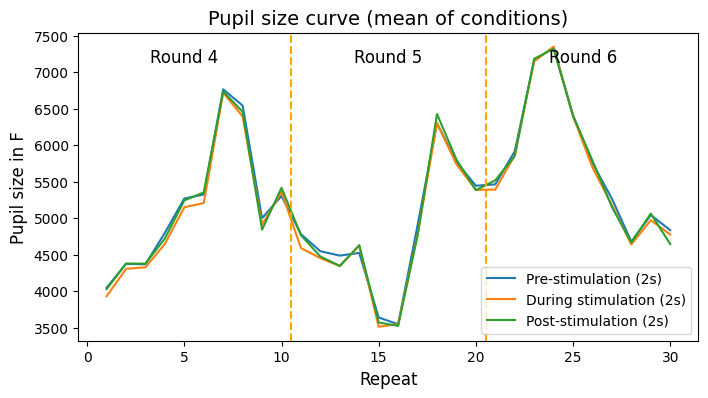

In [77]:
### read dFF values for pupil size for each run (round)

## run 4

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run4.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run4 = mat_data['Master_f']
pupil_area_run4 = pupil_area_run4[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run4):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run4
    pupil_area_run4[index] = value # change original pupil_area_run4
# print(pupil_area_run4.shape)
# print(type(pupil_area_run4))
# print(type(pupil_area_run4[0,1]))
# print(pupil_area_run4[0,1].shape)

# sum and average red data to see the decay
sum_mat_pupil_run4 = np.zeros((pupil_area_run4.shape[0], 1), dtype=np.ndarray)
mean_mat_pupil_run4 = np.zeros((pupil_area_run4.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run4.shape[0]):
    sum = np.zeros((pupil_area_run4[0,0].shape[0], 1))
    for j in range(pupil_area_run4.shape[1]):
        sum = sum + pupil_area_run4[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run4[i, 0] = sum
    mean_mat_pupil_run4[i, 0] = sum / pupil_area_run4.shape[1]


## run 5

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run5.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run5 = mat_data['Master_f']
pupil_area_run5 = pupil_area_run5[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run5):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run5
    pupil_area_run5[index] = value # change original pupil_area_run5
# print(pupil_area_run5.shape)
# print(type(pupil_area_run5))
# print(type(pupil_area_run5[0,1]))
# print(pupil_area_run5[0,1].shape)

# sum and average red data to see the decay
sum_mat_pupil_run5 = np.zeros((pupil_area_run5.shape[0], 1), dtype=np.ndarray)
mean_mat_pupil_run5 = np.zeros((pupil_area_run5.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run5.shape[0]):
    sum = np.zeros((pupil_area_run5[0,0].shape[0], 1))
    for j in range(pupil_area_run5.shape[1]):
        sum = sum + pupil_area_run5[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run5[i, 0] = sum
    mean_mat_pupil_run5[i, 0] = sum / pupil_area_run5.shape[1]


## run 6

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run6.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run6 = mat_data['Master_f']
pupil_area_run6 = pupil_area_run6[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run6):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run6
    pupil_area_run6[index] = value # change original pupil_area_run6
# print(pupil_area_run6.shape)
# print(type(pupil_area_run6))
# print(type(pupil_area_run6[0,1]))
# print(pupil_area_run6[0,1].shape)

# sum and average red data to see the decay
sum_mat_pupil_run6 = np.zeros((pupil_area_run6.shape[0], 1), dtype=np.ndarray)
mean_mat_pupil_run6 = np.zeros((pupil_area_run6.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run6.shape[0]):
    sum = np.zeros((pupil_area_run6[0,0].shape[0], 1))
    for j in range(pupil_area_run6.shape[1]):
        sum = sum + pupil_area_run6[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run6[i, 0] = sum
    mean_mat_pupil_run6[i, 0] = sum / pupil_area_run6.shape[1]


# print(sum_mat_pupil_run4)
# print(sum_mat_pupil_run5)
# print(sum_mat_pupil_run6)
sum_mat_pupil = np.concatenate((sum_mat_pupil_run4[0,0], sum_mat_pupil_run5[0,0], sum_mat_pupil_run6[0,0]), axis=0)
mean_mat_pupil = np.concatenate((mean_mat_pupil_run4[0,0], mean_mat_pupil_run5[0,0], mean_mat_pupil_run6[0,0]), axis=0)
# print(sum_mat_pupil.T)
# print(mean_mat_pupil.T)


# plot
data = mean_mat_pupil
x = np.arange(1, 31)
fig, ax = plt.subplots(figsize=(8, 4))  # Adjust the figure size as desired
ax.plot(x,data[:, 0], label='Pre-stimulation (2s)')
ax.plot(x,data[:, 1], label='During stimulation (2s)')
ax.plot(x,data[:, 2], label='Post-stimulation (2s)')
ax.legend(fontsize='medium')
ax.set_xlabel('Repeat', fontsize=12)  # Adjust the label size as desired
ax.set_ylabel('Pupil size in F', fontsize=12)  # Adjust the label size as desired
ax.axvline(x=10.5, color='orange', linestyle='--')
ax.axvline(x=20.5, color='orange', linestyle='--')
ax.text(5, 7200, 'Round 4', ha='center', va='center', fontsize=12)
ax.text(15.5, 7200, 'Round 5', ha='center', va='center', fontsize=12)
ax.text(25.5, 7200, 'Round 6', ha='center', va='center', fontsize=12)
ax.set_title('Pupil size curve (mean of conditions)', fontsize=14)  # Adjust the title size as desired
ax.tick_params(axis='both', labelsize=10)  # Adjust the tick size as desired
plt.show()


#### sum/mean along repeats

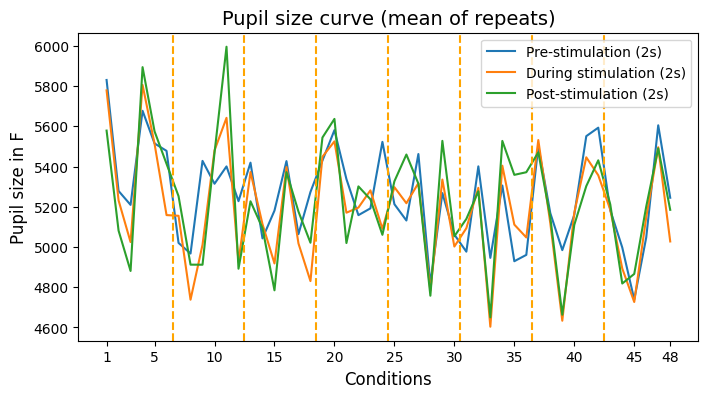

In [78]:
### read dFF values for pupil size for each run (round)

## run 4

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run4.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run4 = mat_data['Master_f']
pupil_area_run4 = pupil_area_run4[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run4):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run4
    pupil_area_run4[index] = value # change original pupil_area_run4
# print(pupil_area_run4.shape)
# print(type(pupil_area_run4))
# print(type(pupil_area_run4[0,1]))
# print(pupil_area_run4[0,1].shape)

## run 5

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run5.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run5 = mat_data['Master_f']
pupil_area_run5 = pupil_area_run5[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run5):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run5
    pupil_area_run5[index] = value # change original pupil_area_run5
# print(pupil_area_run5.shape)
# print(type(pupil_area_run5))
# print(type(pupil_area_run5[0,1]))
# print(pupil_area_run5[0,1].shape)

## run 6

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run6.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run6 = mat_data['Master_f']
pupil_area_run6 = pupil_area_run6[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run6):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run6
    pupil_area_run6[index] = value # change original pupil_area_run6
# print(pupil_area_run6.shape)
# print(type(pupil_area_run6))
# print(type(pupil_area_run6[0,1]))
# print(pupil_area_run6[0,1].shape)

# stack/concatenate all conditions

# satstackck elements in pupil_area_run4 along the 0th axis
concatenated_run4 = np.stack(pupil_area_run4[0,:], axis=2)
# stack elements in pupil_area_run5 along the 0th axis
concatenated_run5 = np.stack(pupil_area_run5[0,:], axis=2)
# stack elements in pupil_area_run6 along the 0th axis
concatenated_run6 = np.stack(pupil_area_run6[0,:], axis=2)
# Concatenate the results from all three runs along the 1st axis
result = np.concatenate((concatenated_run4, concatenated_run5, concatenated_run6), axis=0)
# print(concatenated_run4.shape)
# print(result.shape)


# plot
data = np.mean(result, axis=0)
x = np.arange(1, 49)
fig, ax = plt.subplots(figsize=(8, 4))  # Adjust the figure size as desired
ax.plot(x,data[0, :], label='Pre-stimulation (2s)')
ax.plot(x,data[1, :], label='During stimulation (2s)')
ax.plot(x,data[2, :], label='Post-stimulation (2s)')
ax.legend(fontsize='medium')
ax.set_xlabel('Conditions', fontsize=12)  # Adjust the label size as desired
ax.set_ylabel('Pupil size in F', fontsize=12)  # Adjust the label size as desired
ax.axvline(x=6.5, color='orange', linestyle='--')
ax.axvline(x=12.5, color='orange', linestyle='--')
ax.axvline(x=18.5, color='orange', linestyle='--')
ax.axvline(x=24.5, color='orange', linestyle='--')
ax.axvline(x=30.5, color='orange', linestyle='--')
ax.axvline(x=36.5, color='orange', linestyle='--')
ax.axvline(x=42.5, color='orange', linestyle='--')
ax.set_title('Pupil size curve (mean of repeats)', fontsize=14)  # Adjust the title size as desired
ax.tick_params(axis='both', labelsize=10)  # Adjust the tick size as desired
# Customize x-axis ticks
tick_positions = [1,5,10,15,20,25,30,35,40,45,48]
plt.xticks(tick_positions)
plt.show()


#### mean for each (condition, repeat)

In [79]:
### read dFF values for pupil size for each run (round)

## run 4

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run4.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run4 = mat_data['Master_f']
pupil_area_run4 = pupil_area_run4[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run4):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run4
    pupil_area_run4[index] = value # change original pupil_area_run4
# print(pupil_area_run4.shape)
# print(type(pupil_area_run4))
# print(type(pupil_area_run4[0,1]))
# print(pupil_area_run4[0,1].shape)
fine_mean_mat_pupil_run4 = copy.deepcopy(pupil_area_run4)

## run 5

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run5.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run5 = mat_data['Master_f']
pupil_area_run5 = pupil_area_run5[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run5):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run5
    pupil_area_run5[index] = value # change original pupil_area_run5
# print(pupil_area_run5.shape)
# print(type(pupil_area_run5))
# print(type(pupil_area_run5[0,1]))
# print(pupil_area_run5[0,1].shape)
fine_mean_mat_pupil_run5 = copy.deepcopy(pupil_area_run5)

## run 6

# read and calculate the pre 2s mean, stimulation 2s mean, and post 2s mean
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run6.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run6 = mat_data['Master_f']
pupil_area_run6 = pupil_area_run6[:, :-1] # delete the last column (49th)
for index, value in np.ndenumerate(pupil_area_run6):
    value = calculate_means_by_ranges(value) # here, value is a copy, so changing value will not change pupil_area_run6
    pupil_area_run6[index] = value # change original pupil_area_run6
# print(pupil_area_run6.shape)
# print(type(pupil_area_run6))
# print(type(pupil_area_run6[0,1]))
# print(pupil_area_run6[0,1].shape)
fine_mean_mat_pupil_run6 = copy.deepcopy(pupil_area_run6)

# concatenate
fine_mean_mat_pupil = np.concatenate((fine_mean_mat_pupil_run4,
                                      fine_mean_mat_pupil_run5,
                                      fine_mean_mat_pupil_run6),
                                     axis = 0)
print(fine_mean_mat_pupil.shape)
print(fine_mean_mat_pupil[0,1].shape)

(3, 48)
(10, 3)


### Read pupil dFF

<class 'numpy.ndarray'>
(10, 1)
<class 'numpy.ndarray'>
(10, 1)
<class 'numpy.ndarray'>
(10, 1)
[[-1.05138376 -0.13521511  0.22459265 -1.30045993 -0.88000986 -0.73014825
  -0.23684986 -0.75100413 -0.24845973  0.99998111 -1.71898365 -0.59187931
  -0.79403246  1.68797097 -1.13479677  1.79954027 -0.81404467  0.29317292
   0.05337399 -0.22734424 -0.60822942 -0.07015685  0.01182725  0.10699081
   0.14049484 -0.31848347 -0.430526    0.32631886 -0.39290653  0.08752607]]


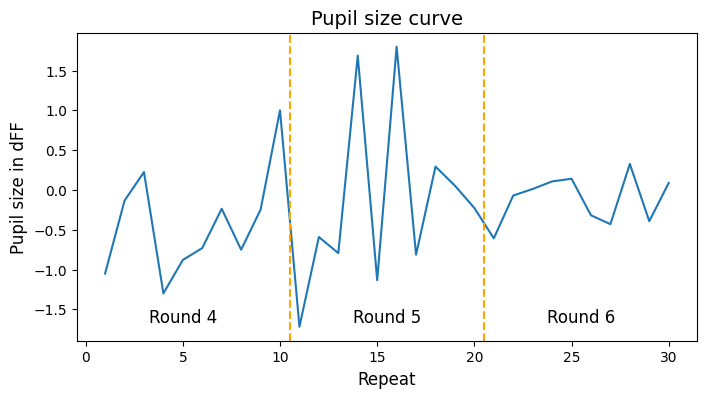

In [80]:
### read dFF values for pupil size for each run (round)

# run 4
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run4.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run4 = mat_data['Master_dFF_mean']
pupil_area_run4 = pupil_area_run4[:, :-1]
print(type(pupil_area_run4[0,1]))
print(pupil_area_run4[0,1].shape)
# sum red data to see the decay
sum_mat_pupil_run4 = np.zeros((pupil_area_run4.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run4.shape[0]):
    sum = np.zeros((pupil_area_run4[0,0].shape[0], 1))
    for j in range(pupil_area_run4.shape[1]):
        sum = sum + pupil_area_run4[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run4[i, 0] = sum

# run 5
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run5.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run5 = mat_data['Master_dFF_mean']
pupil_area_run5 = pupil_area_run5[:, :-1]
print(type(pupil_area_run5[0,1]))
print(pupil_area_run5[0,1].shape)
# sum red data to see the decay
sum_mat_pupil_run5 = np.zeros((pupil_area_run5.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run5.shape[0]):
    sum = np.zeros((pupil_area_run5[0,0].shape[0], 1))
    for j in range(pupil_area_run5.shape[1]):
        sum = sum + pupil_area_run5[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run5[i, 0] = sum

# run 6
path_ = os.path.join(root_path, 'CL090_230515', 'CL090_230515green_PupilArea_Run6.mat')
mat_data = scipy.io.loadmat(path_)
pupil_area_run6 = mat_data['Master_dFF_mean']
pupil_area_run6 = pupil_area_run6[:, :-1]
print(type(pupil_area_run6[0,1]))
print(pupil_area_run6[0,1].shape)
# sum red data to see the decay
sum_mat_pupil_run6 = np.zeros((pupil_area_run6.shape[0], 1), dtype=np.ndarray)
for i in range(pupil_area_run6.shape[0]):
    sum = np.zeros((pupil_area_run6[0,0].shape[0], 1))
    for j in range(pupil_area_run6.shape[1]):
        sum = sum + pupil_area_run6[i,j]
    # print(np.sum(sum))
    sum_mat_pupil_run6[i, 0] = sum


# print(sum_mat_pupil_run4)
# print(sum_mat_pupil_run5)
# print(sum_mat_pupil_run6)
sum_mat_pupil = np.concatenate((sum_mat_pupil_run4[0,0], sum_mat_pupil_run5[0,0], sum_mat_pupil_run6[0,0]), axis=0)
print(sum_mat_pupil.T)


data = sum_mat_pupil
x = np.arange(1, 31)
fig, ax = plt.subplots(figsize=(8, 4))  # Adjust the figure size as desired
ax.plot(x, data)
ax.set_xlabel('Repeat', fontsize=12)  # Adjust the label size as desired
ax.set_ylabel('Pupil size in dFF', fontsize=12)  # Adjust the label size as desired
ax.axvline(x=10.5, color='orange', linestyle='--')
ax.axvline(x=20.5, color='orange', linestyle='--')
ax.text(5, -1.6, 'Round 4', ha='center', va='center', fontsize=12)
ax.text(15.5, -1.6, 'Round 5', ha='center', va='center', fontsize=12)
ax.text(25.5, -1.6, 'Round 6', ha='center', va='center', fontsize=12)
ax.set_title('Pupil size curve', fontsize=14)  # Adjust the title size as desired
ax.tick_params(axis='both', labelsize=10)  # Adjust the tick size as desired
plt.show()


## Read fluorescence dFF mean data into dicts

In [81]:
root_path = "/content/drive/MyDrive/Fluorescence_Data/FluoData4Fitting_Average"

# Get a list of all the subdirectories: subfolders are viewed as cell names
cell_names = [f for f in os.listdir(root_path) if os.path.isdir(os.path.join(root_path, f))]
# for cell in cell_names:
#     print(cell)

# Create a dictionary with default values
default_value = 0
cell_data_dict = {cell: default_value for cell in cell_names}
# print(cell_data_dict)

file_suffixes = ['green_Axon.mat', 'green_dFFMeanValues.mat', 'red_dFFMeanValues.mat']

for cell in cell_names:
    print(cell)
    file_names = [cell + suffix for suffix in file_suffixes]

    path_ = file_names[0] # green_Axon.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    axons = mat_data['Axons'] # array containing nested arrays/sub-arrays
    # Squeeze the outer array
    axons = np.squeeze(axons, axis=0)
    for i in range(len(axons)):
        # Squeeze the inner array and convert the data type to 'int'
        axons[i] = np.squeeze(axons[i].astype(int), axis=0)
    # final axons' length is the number of groups with
    # each elements being a nested array of components

    path_ = file_names[1] # green_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_green = mat_data['dFFMeanValues'] # 3 by 49

    path_ = file_names[2] # red_dFFMeanValues.mat
    path_ = os.path.join(root_path, cell, path_)
    mat_data = scipy.io.loadmat(path_)
    dFFMeanValues_red = mat_data['dFFMeanValues'] # 3 by 49

    cell_data_dict[cell] = {'axons': axons,
                'green_dFFMeanValues': dFFMeanValues_green,
                'red_dFFMeanValues': dFFMeanValues_red}

# # Print keys and types
# for key, value in cell_data_dict.items():
#     print("-- * * * * * --")
#     print(key, type(value))
#     for key_, value_ in value.items():
#         print(key_, type(value_))
# print("-- * * * * * --")

CL090_230515
CL090_230518
CL083_230413
CL075_230303


## Decay restoration of red and trend visualization

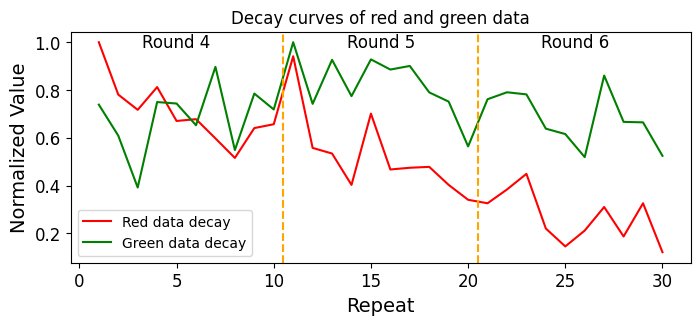

round 0, exponent in the exp func is -0.07472499699077181
round 1, exponent in the exp func is -0.12987990032231914
round 2, exponent in the exp func is -0.05409199709646579


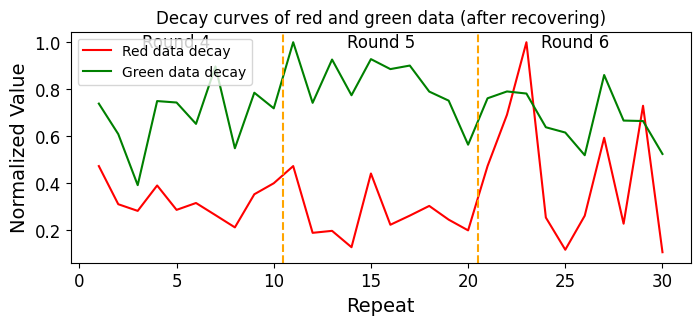

stacked_green.shape is (1440, 281) (compare with 48*3*10=1440)
group_satcked_green.shape, data_axons.shape are: (1440, 23) (23,)
stacked_red.shape is (1440, 1) (compare with 48*3*10=1440)
np.max(group_satcked_green), np.min(group_satcked_green) are: 23.665895684845708 -6.580518409021957
np.max(stacked_red), np.min(stacked_red) are: 1.1687414763592152 -0.46077202173483056


In [82]:
cell_data = copy.deepcopy(cell_data_dict['CL090_230515'])
# cell_data = copy.deepcopy(cell_data_dict['CL075_230303'])
# cell_data = cell_data_dict['CL090_230515']
# cell_data = cell_data_dict['CL075_230303']

# # the following 4 lines of code used for checking if cell_data and
# # cell_data_dict changed after running the code of this chunk; compare
# # with the printing at the end
# print(cell_data['red_dFFMeanValues'][1,1][0,-1])
# print(cell_data['green_dFFMeanValues'][1,1][0,-1])
# print(cell_data_dict['CL090_230515']['red_dFFMeanValues'][1,1][0,-1])
# print(cell_data_dict['CL090_230515']['green_dFFMeanValues'][1,1][0,-1])


delete_small_group = True # delete groups (axons) with less than 3 components

data_green = cell_data['green_dFFMeanValues'][:,:-1] # exclude 49th column
data_red = cell_data['red_dFFMeanValues'][:,:-1] # exclude 49th column
# data_red = cell_data['red_dFFMeanValues'][:,:-1].copy() # exclude 49th column
# the .copy() method is for a NumPy array. Using .copy() on a NumPy array,
# it creates a new copied array but it is a separate and independent object.
# Modifying the copied array will not affect the original array.
# # here uses .copy() to avoid cell_data and cell_data['red_dFFMeanValues'] be changed in
# # the later code line data_red[i,j] = red_recover_factor[i,0] * data_red[i,j], or we can use
# # cell_data = copy.deepcopy(cell_data_dict['CL090_230515']) to guarantee cell_data['red_dFFMeanValues']
# # will not be changed (cell_data will be changed).
# # copy.deepcopy will recursively copy all nested objects; copy.copy cannot do this.
data_axons = cell_data['axons']

# sum red data to see the decay
sum_mat_red = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
for i in range(data_red.shape[0]):
    sum = np.zeros((data_red[0,0].shape[0], 1))
    for j in range(data_red.shape[1]):
        sum = sum + data_red[i,j]
    # print(np.sum(sum))
    sum_mat_red[i, 0] = sum
# print(sum_mat_red)

# Normalization of red
sum_mat_red_n = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
max_value = -np.inf
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        max_value = max(max_value, np.max(np.abs(sum_mat_red[i, j])))
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        element = sum_mat_red[i, j]
        sum_mat_red_n[i, j] = element / max_value
# print(sum_mat_red_n.shape)

# vstack sum_mat_red_n
stacked_sum_mat_red_n = np.empty((0, sum_mat_red_n[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(sum_mat_red_n):
    stacked_sum_mat_red_n = np.vstack((stacked_sum_mat_red_n, value))
stacked_sum_mat_red_n = np.squeeze(stacked_sum_mat_red_n)
# print(stacked_sum_mat_red_n.shape)


# sum green data to see the decay
sum_mat_green = np.zeros((data_green.shape[0], 1), dtype=np.ndarray)
for i in range(data_red.shape[0]):
    sum = np.zeros((data_green[0,0].shape[0], 1))
    for j in range(data_green.shape[1]):
        sum = sum + np.sum(data_green[i,j], axis=1, keepdims=True)
    # print(np.sum(sum))
    sum_mat_green[i, 0] = sum
# print(sum_mat_green)

# Normalization of green
sum_mat_green_n = np.zeros((data_green.shape[0], 1), dtype=np.ndarray)
max_value = -np.inf
for i in range(sum_mat_green.shape[0]):
    for j in range(sum_mat_green.shape[1]):
        max_value = max(max_value, np.max(np.abs(sum_mat_green[i, j])))
for i in range(sum_mat_green.shape[0]):
    for j in range(sum_mat_green.shape[1]):
        element = sum_mat_green[i, j]
        sum_mat_green_n[i, j] = element / max_value
# print(sum_mat_green_n.shape)

# vstack sum_mat_green_n
stacked_sum_mat_green_n = np.empty((0, sum_mat_green_n[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(sum_mat_green_n):
    stacked_sum_mat_green_n = np.vstack((stacked_sum_mat_green_n, value))
stacked_sum_mat_green_n = np.squeeze(stacked_sum_mat_green_n)
# print(stacked_sum_mat_green_n.shape)


# plot stacked_sum_mat_red_n and stacked_sum_mat_green_n
x = np.arange(1, stacked_sum_mat_green_n.shape[0] + 1)
fig, ax = plt.subplots(figsize=(8, 3))  # Adjust the figure size as desired
ax.plot(x, stacked_sum_mat_red_n, color='red', label='Red data decay')
ax.plot(x, stacked_sum_mat_green_n, color='green', label='Green data decay')
ax.axvline(x=10.5, color='orange', linestyle='--')
ax.axvline(x=20.5, color='orange', linestyle='--')
ax.text(5, 1, 'Round 4', ha='center', va='center', fontsize=12)
ax.text(15.5, 1, 'Round 5', ha='center', va='center', fontsize=12)
ax.text(25.5, 1, 'Round 6', ha='center', va='center', fontsize=12)
ax.set_title('Decay curves of red and green data')
ax.tick_params(axis='both', labelsize=12)  # Adjust the tick size as desired
ax.set_xlabel('Repeat', fontsize=14)  # Adjust the label size as desired
ax.set_ylabel('Normalized Value', fontsize=14)  # Adjust the label size as desired
ax.legend()
plt.show()


# Define the exponential function for regression of decay
def exponential_func(x, lambda_):
    return np.exp(lambda_ * x)
red_recover_factor = sum_mat_red_n.copy()
for i in range(sum_mat_red_n.shape[0]):
    for j in range(sum_mat_red_n.shape[1]): # sum_mat_red_n.shape[1] = 1
        y = sum_mat_red_n[i, j].copy()
        y = np.squeeze(y)
        multiplier = 1 / y[0]
        y = y * multiplier
        x = np.arange(10)
        popt, pcov = curve_fit(exponential_func, x, y)
        lambda_ = popt[0]
        print(f"round {i}, exponent in the exp func is {lambda_}")
        y_fit = exponential_func(x, lambda_)
        y = y.reshape(-1, 1)
        y_fit = y_fit.reshape(-1, 1)
        red_recover_factor[i, j] = (y / y_fit) * multiplier
# print(red_recover_factor.shape)

for i in range(data_red.shape[0]):
    for j in range(data_red.shape[1]):
        data_red[i,j] = red_recover_factor[i,0] * data_red[i,j]

# sum red data to see the decay
sum_mat_red = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
for i in range(data_red.shape[0]):
    sum = np.zeros((data_red[0,0].shape[0], 1))
    for j in range(data_red.shape[1]):
        sum = sum + data_red[i,j]
    # print(np.sum(sum))
    sum_mat_red[i, 0] = sum
# print(sum_mat_red)

# Normalization of red
sum_mat_red_n = np.zeros((data_red.shape[0], 1), dtype=np.ndarray)
max_value = -np.inf
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        max_value = max(max_value, np.max(np.abs(sum_mat_red[i, j])))
for i in range(sum_mat_red.shape[0]):
    for j in range(sum_mat_red.shape[1]):
        element = sum_mat_red[i, j]
        sum_mat_red_n[i, j] = element / max_value
# print(sum_mat_red_n.shape)

# vstack sum_mat_red_n
stacked_sum_mat_red_n = np.empty((0, sum_mat_red_n[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(sum_mat_red_n):
    stacked_sum_mat_red_n = np.vstack((stacked_sum_mat_red_n, value))
stacked_sum_mat_red_n = np.squeeze(stacked_sum_mat_red_n)
# print(stacked_sum_mat_red_n.shape)


# plot stacked_sum_mat_red_n and stacked_sum_mat_green_n
x = np.arange(1, stacked_sum_mat_green_n.shape[0] + 1)
fig, ax = plt.subplots(figsize=(8, 3))  # Adjust the figure size as desired
ax.plot(x, stacked_sum_mat_red_n, color='red', label='Red data decay')
ax.plot(x, stacked_sum_mat_green_n, color='green', label='Green data decay')
ax.axvline(x=10.5, color='orange', linestyle='--')
ax.axvline(x=20.5, color='orange', linestyle='--')
ax.text(5, 1, 'Round 4', ha='center', va='center', fontsize=12)
ax.text(15.5, 1, 'Round 5', ha='center', va='center', fontsize=12)
ax.text(25.5, 1, 'Round 6', ha='center', va='center', fontsize=12)
ax.set_title('Decay curves of red and green data (after recovering)')
ax.tick_params(axis='both', labelsize=12)  # Adjust the tick size as desired
ax.set_xlabel('Repeat', fontsize=14)  # Adjust the label size as desired
ax.set_ylabel('Normalized Value', fontsize=14)  # Adjust the label size as desired
ax.legend()
plt.show()


# at most one of the following options is True
mean_pupil_size_along_conditions_multiply = False
mean_pupil_size_each_condition_each_repeat_multiply = True

if mean_pupil_size_along_conditions_multiply:
    for i in range(data_green.shape[0]):
        if i == 0:
            mul_mat = mean_mat_pupil[:10,[1]] / np.mean(mean_mat_pupil)
        if i == 1:
            mul_mat = mean_mat_pupil[10:20,[1]] / np.mean(mean_mat_pupil)
        if i == 2:
            mul_mat = mean_mat_pupil[20:30,[1]] / np.mean(mean_mat_pupil)
        for j in range(data_green.shape[1]):
            data_green[i,j] = data_green[i,j] * mul_mat
if mean_pupil_size_each_condition_each_repeat_multiply:
    for i in range(data_green.shape[0]):
        for j in range(data_green.shape[1]):
            data_green[i,j] = data_green[i,j] * fine_mean_mat_pupil[i,j][:,[1]] / np.mean(mean_mat_pupil)


### the following is stacking opearion to make green and red data both 2-D
### so that thery are prepared for later regression

# print(data_axons)
# print(type(data_axons),len(data_axons))
if delete_small_group:
    data_axons = np.array([axons_ for axons_ in data_axons if len(axons_) >= 3], dtype=object)
# print(data_axons)
# print(type(data_axons),len(data_axons))

# vstack green data
stacked_green = np.empty((0, data_green[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_green):
    stacked_green = np.vstack((stacked_green, value))
print(f"stacked_green.shape is {stacked_green.shape} (compare with 48*3*10={48*3*10})")

# group columns of green data
group_num = data_axons.shape[0]
group_satcked_green = np.zeros((stacked_green.shape[0], group_num))
for i, cols in enumerate(data_axons):
    group_satcked_green[:, i] = np.sum(stacked_green[:, cols-1], axis=1)
print("group_satcked_green.shape, data_axons.shape are:", group_satcked_green.shape, data_axons.shape)

# vstack red data
stacked_red = np.empty((0, data_red[0,0].shape[1]))
# Enumerate the elements in the np array and vstack them
for index, value in np.ndenumerate(data_red):
    stacked_red = np.vstack((stacked_red, value))
print(f"stacked_red.shape is {stacked_red.shape} (compare with 48*3*10={48*3*10})")

print("np.max(group_satcked_green), np.min(group_satcked_green) are:", np.max(group_satcked_green), np.min(group_satcked_green))
print("np.max(stacked_red), np.min(stacked_red) are:", np.max(stacked_red), np.min(stacked_red))

# # the following 4 lines of code used for checking if cell_data and
# # cell_data_dict changed after running the code of this chunk; compare
# # with the beginning printing
# print(cell_data['red_dFFMeanValues'][1,1][0,-1])
# print(cell_data['green_dFFMeanValues'][1,1][0,-1])
# print(cell_data_dict['CL090_230515']['red_dFFMeanValues'][1,1][0,-1])
# print(cell_data_dict['CL090_230515']['green_dFFMeanValues'][1,1][0,-1])


## Regression

### Logistic regression

In [84]:
import os
import numpy as np
import scipy.io
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, mean_squared_error, r2_score
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
from IPython.display import clear_output
import random
import sys

In [85]:
def plot_comparison(y_test, y_pred, subtitle = ''):
    # Sort y_pred and y_test based on y_test
    sorted_indices = np.argsort(y_test)
    sorted_y_pred = y_pred[sorted_indices]
    sorted_y_test = y_test[sorted_indices]
    # Plot sorted_y_pred and sorted_y_test
    plt.plot(sorted_y_pred, label='Sorted Predictions')
    plt.plot(sorted_y_test, label='Sorted Ground Truth')
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparison of Sorted Predictions and Sorted Ground Truth \n ({subtitle})')
    plt.legend()
    plt.savefig(f'Comparison ({subtitle}).png', bbox_inches='tight')
    # bbox_inches='tight' will adjust the figure's bounding box to fit all the content, ensuring that
    # the complete words are visible in the saved figure. Otherwise, the saved figure may not show the
    # complete words, e.g., for x-label, or for the long title.
    # The default setting can sometimes result in cutoff or clipped text. It tries to include the entire
    # figure within the saved image, but there may be cases where the default behavior is not sufficient
    # to capture all the content. The default behavior assumes the figure content fits within the predefined
    # margins and padding.
    plt.show()

#### Divide train and val datasets

In [86]:
# independent data
x = group_satcked_green

class_num = 480

# dependent data (labels/targets)
y = np.squeeze(stacked_red)
# print(np.max(y), np.min(y))

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max
# Generate class_num+1 evenly spaced intervals
intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
# print(intervals)
# Digitize the array to get the indices of the intervals
y_train = np.digitize(y_train, intervals) - 1
y_test = np.digitize(y_test, intervals) - 1
print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

# to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
unique_elements = np.unique(y_train)
print("Unique elements:", unique_elements)
print("Number of unique elements:", len(unique_elements))


x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)
Unique elements: [  0  14  25  41  42  45  49  50  51  53  58  63  67  69  72  73  74  75
  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  92  93  94
  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111 112
 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130
 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148
 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166
 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184
 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202
 203 204 205 206 207 208 209 210 211 213 214 215 216 217 218 219 220 221
 222 223 224 225 227 228 229 230 231 232 233 234 235 236 237 238 239 241
 242 243 244 245 246 247 248 249 250 251 253 254 255 256 257 258 260 261
 263 264 265 267 272 273 276 277 278 280 281 283 284 285 287 288 292 298
 300 302 314 31

#### Fit and predict

'multinomial' (default option for multi-calss) achieves better performance than 'ovr'.

In [87]:
# fit
model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
# model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='ovr')

fit_result = model.fit(x_train, y_train)
print(fit_result.intercept_.shape, fit_result.coef_.shape)
# print("Coefficients:", model.coef_[0,:])
# print("Intercept:", model.intercept_[0])
print('--- --- ---')

# predict
# Use the trained model to make predictions
y_pred = model.predict(x_test)
# Alternatively, you can get the predicted probabilities for each class
y_prob = model.predict_proba(x_test)

print('y_prob.shape:', y_prob.shape)
print(np.sum(y_prob, axis = 1))
# print(y_prob[0,:])

# Print the predicted class labels
print('y_pred:', y_pred)
print('y_test:', y_test)
print('y_pred shape:', y_pred.shape, 'y_test shape:', y_test.shape)
# Print the predicted probabilities
# print(y_prob)

(231,) (231, 23)
--- --- ---
y_prob.shape: (72, 231)
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
y_pred: [155 146 167 147 148 280 134 165 182 178 155 248 124 128 149 123  88 140
 154 141 150 198 131 141 140 147 155 138 138 128 128 103 180 128 136  98
 255 127 145 121 119 172 128 128 133 128 158 171 121 146 128 160 134 181
 128 169 141 112 232 117 134 149 136  69 155 149 134 170 141 124 165 141]
y_test: [180 138 226 261 138 223  99 286 188 214 157 165  71 158 126  77 126 136
 203 233 195 262 138 156 128 157 145 144 121 169 154 145 201 137 128 116
 265 153 152 133 133 131 233 134 134 147 159 223 109 162  95 153 115 169
 156 202 177 108 186 107 182 120 129 119 186 142  64 184 164 115 148 156]
y_pred shape: (72,) y_test shape: (72,)


#### Evaluate

##### Evaluate (normal)

In previous data division, I classify data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results with the same number of classes (e.g., class_num = 160).

Accuracy: 0.0
Mean squared error: 1565.5833333333333
Correlation coefficient: 0.5661850911845832
Coefficient of determination (R-squared score, R2 score): 0.23619472894270543


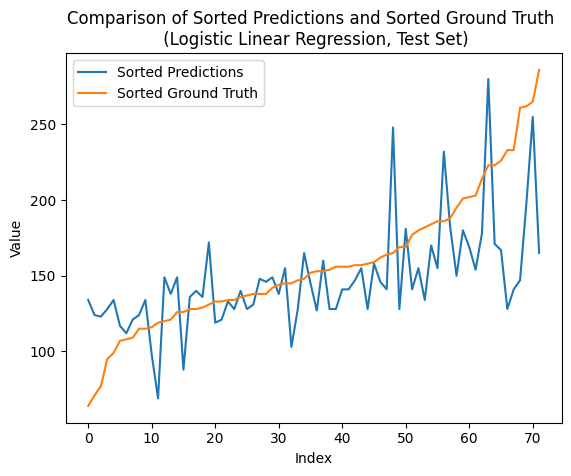

In [88]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_test, y_pred)
# print("Confusion Matrix:") # y_test doesn't include all classes, so confusion matrix is less than num_class by num_class
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#           |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_test, y_pred)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred, y_test)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_test, y_pred)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)


# Sort y_pred and y_test based on y_test
plot_comparison(y_test, y_pred, 'Logistic Linear Regression, Test Set')

Accuracy: 0.2141812865497076
Mean squared error: 1157.6498538011697
Correlation coefficient: 0.7100871677515767
Coefficient of determination (R-squared score, R2 score): 0.4619433397469369


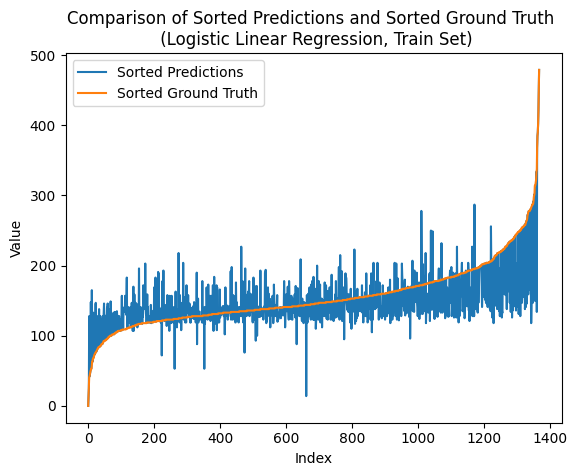

In [89]:
# predict on train
# Use the trained model to make predictions
y_pred_ = model.predict(x_train)
# Alternatively, you can get the predicted probabilities for each class
y_prob_ = model.predict_proba(x_train)

accuracy = accuracy_score(y_train, y_pred_)
print("Accuracy:", accuracy)

# cm = confusion_matrix(y_train, y_pred_)
# print("Confusion Matrix:")
# print(cm)
# the columns represent the predicted labels (predictions)
# the rows represent the true labels (ground truth)
#                Predicted Class
#              |   Class 1   |   Class 2   |   Class 3   |
# -----------------------------------------------------
# True Class   |     TP1     |     FN1     |     FN1     |
# -----------------------------------------------------
# True Class   |     FP2     |     TP2     |     FN2     |
# -----------------------------------------------------
# True Class   |     FN3     |     FP3     |     TP3     |

mse = mean_squared_error(y_train, y_pred_)
print("Mean squared error:", mse)

# Calculate the correlation coefficient
correlation = np.corrcoef(y_pred_, y_train)[0, 1]
print("Correlation coefficient:", correlation)

r_squared = r2_score(y_train, y_pred_)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

plot_comparison(y_train, y_pred_, 'Logistic Linear Regression, Train Set')

##### Evaluate (reduced)

The model is based on classifying data into class_num (e.g., class_num = 160) intervals (histogram, by np.digitize). Here, evaluate the results a smaller number of classes (e.g., reduced_class_num = 16), that is, for the example of class_num = 160 and reduced_class_num = 16, classes 0, 1, ..., 15 become one class, i.e., 0; ...; classes 144, 145, ..., 159 become one class, i.e., 15.

In [90]:
print("---- ---- ----")
# Define the boundaries for digitization
reduced_class_num = 16
intervals = np.arange(0, class_num + 1, class_num / reduced_class_num)
print(intervals)

y_train_digital = np.digitize(y_train, intervals) - 1
y_test_digital = np.digitize(y_test, intervals) - 1
y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
y_pred_test_digital = np.digitize(y_pred, intervals) - 1
print(y_pred)
print(y_pred_test_digital)
mse = mean_squared_error(y_test_digital, y_pred_test_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_test_digital, y_pred_test_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)
mse = mean_squared_error(y_train_digital, y_pred_train_digital)
print("Mean squared error:", mse)
correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
print("Correlation coefficient:", correlation)
r_squared = r2_score(y_train_digital, y_pred_train_digital)
print("Coefficient of determination (R-squared score, R2 score):", r_squared)

---- ---- ----
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
[155 146 167 147 148 280 134 165 182 178 155 248 124 128 149 123  88 140
 154 141 150 198 131 141 140 147 155 138 138 128 128 103 180 128 136  98
 255 127 145 121 119 172 128 128 133 128 158 171 121 146 128 160 134 181
 128 169 141 112 232 117 134 149 136  69 155 149 134 170 141 124 165 141]
[5 4 5 4 4 9 4 5 6 5 5 8 4 4 4 4 2 4 5 4 5 6 4 4 4 4 5 4 4 4 4 3 6 4 4 3 8
 4 4 4 3 5 4 4 4 4 5 5 4 4 4 5 4 6 4 5 4 3 7 3 4 4 4 2 5 4 4 5 4 4 5 4]
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.547890464752461
Coefficient of determination (R-squared score, R2 score): 0.1868647380766224
Mean squared error: 1.3845029239766082
Correlation coefficient: 0.694536948751427
Coefficient of determination (R-squared score, R2 score): 0.43967877989299153


Fixing the reduced class number, I enumerate the original class number to see what a original class number is better.

x_train shape: (1368, 23)
y_train shape: (1368,)
x_test shape: (72, 23)
y_test shape: (72,)
---- ---- ----
class_num = 16
Number of unique elements: 16
[ 0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.5167601108390442
Coefficient of determination (R-squared score, R2 score): 0.18060985144644248
train eval:
Mean squared error: 1.7609649122807018
Correlation coefficient: 0.5794800379789481
Coefficient of determination (R-squared score, R2 score): 0.2873211091669571


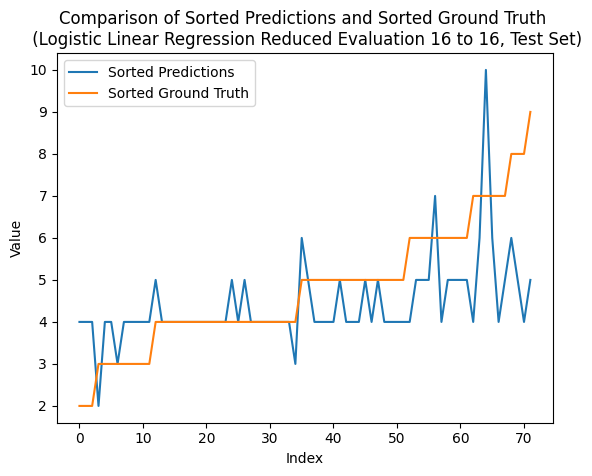

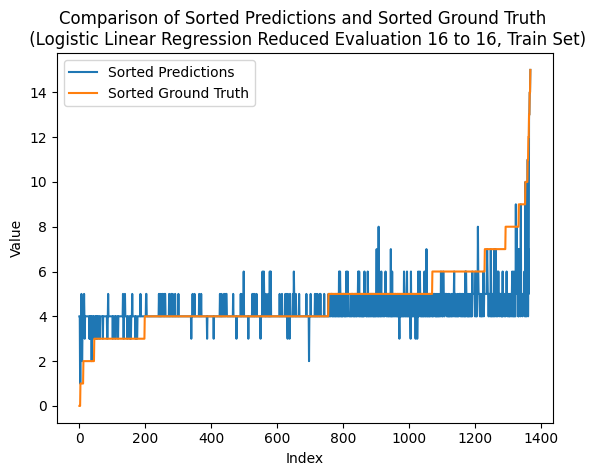

---- ---- ----
class_num = 32
Number of unique elements: 29


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[ 0.  2.  4.  6.  8. 10. 12. 14. 16. 18. 20. 22. 24. 26. 28. 30. 32.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.536159392084241
Coefficient of determination (R-squared score, R2 score): 0.1868647380766224
train eval:
Mean squared error: 1.7726608187134503
Correlation coefficient: 0.581628264236524
Coefficient of determination (R-squared score, R2 score): 0.2825876669696433


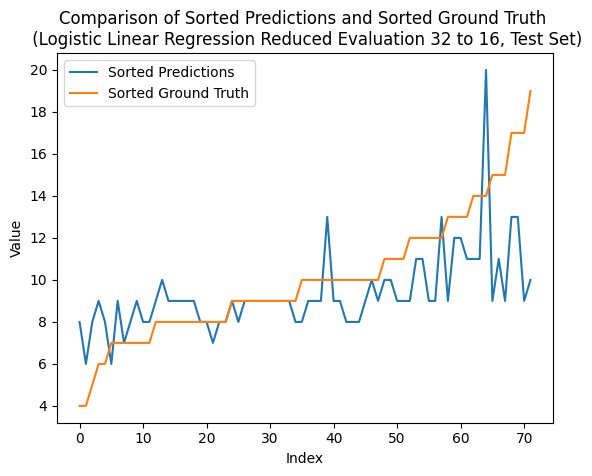

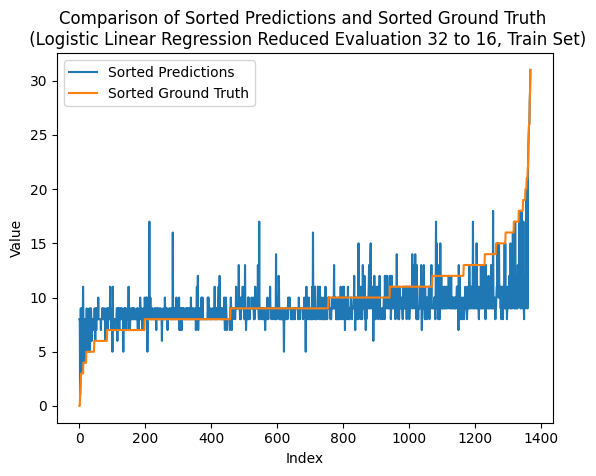

---- ---- ----
class_num = 48
Number of unique elements: 40


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[ 0.  3.  6.  9. 12. 15. 18. 21. 24. 27. 30. 33. 36. 39. 42. 45. 48.]
test eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.6128699723669949
Coefficient of determination (R-squared score, R2 score): 0.25566849100860045
train eval:
Mean squared error: 1.7711988304093567
Correlation coefficient: 0.5832781417410506
Coefficient of determination (R-squared score, R2 score): 0.2831793472443076


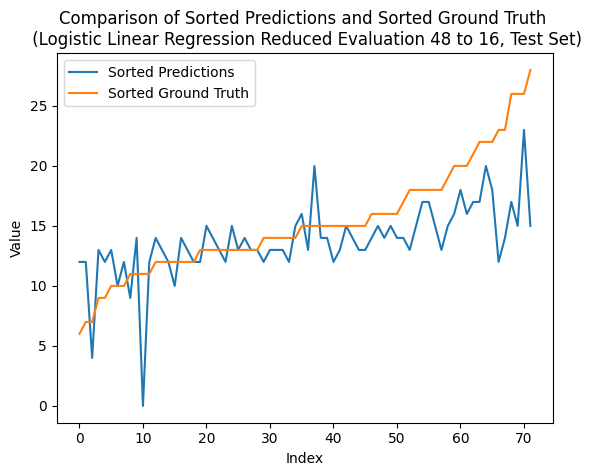

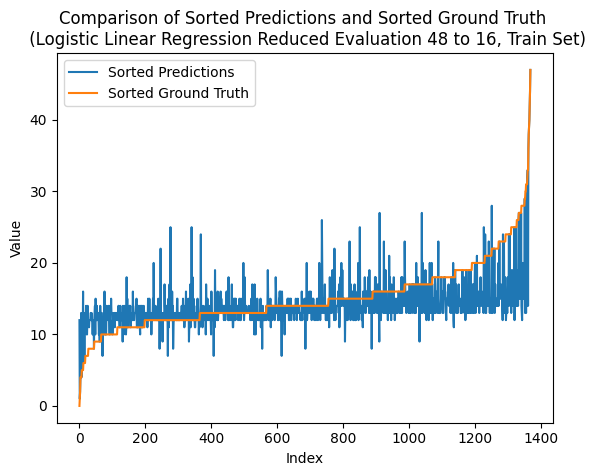

---- ---- ----
class_num = 64
Number of unique elements: 51
[ 0.  4.  8. 12. 16. 20. 24. 28. 32. 36. 40. 44. 48. 52. 56. 60. 64.]
test eval:
Mean squared error: 2.0833333333333335
Correlation coefficient: 0.5220690674062916
Coefficient of determination (R-squared score, R2 score): 0.06176700547302583
train eval:
Mean squared error: 1.804093567251462
Correlation coefficient: 0.5804340555287357
Coefficient of determination (R-squared score, R2 score): 0.2698665410643628


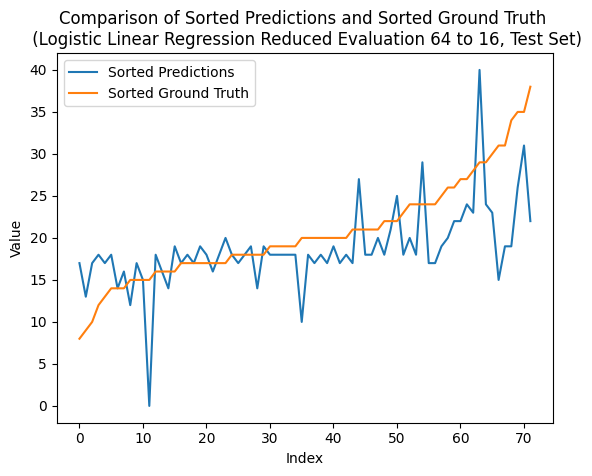

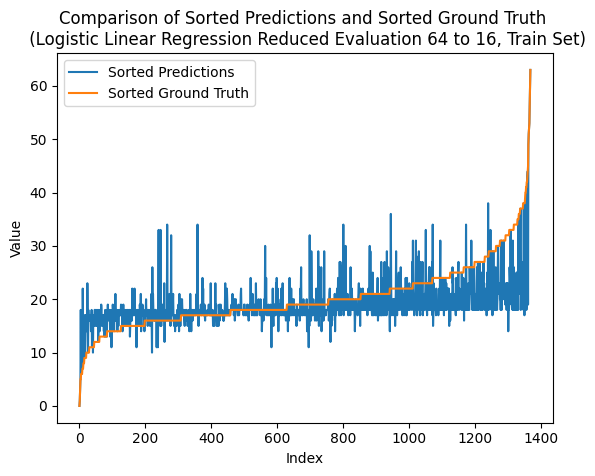

---- ---- ----
class_num = 80
Number of unique elements: 59


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


[ 0.  5. 10. 15. 20. 25. 30. 35. 40. 45. 50. 55. 60. 65. 70. 75. 80.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.546850871376478
Coefficient of determination (R-squared score, R2 score): 0.19937451133698203
train eval:
Mean squared error: 1.6842105263157894
Correlation coefficient: 0.6144532060370395
Coefficient of determination (R-squared score, R2 score): 0.3183843235868281


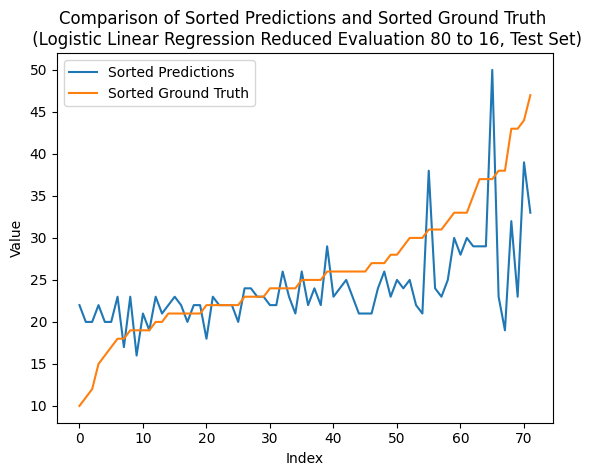

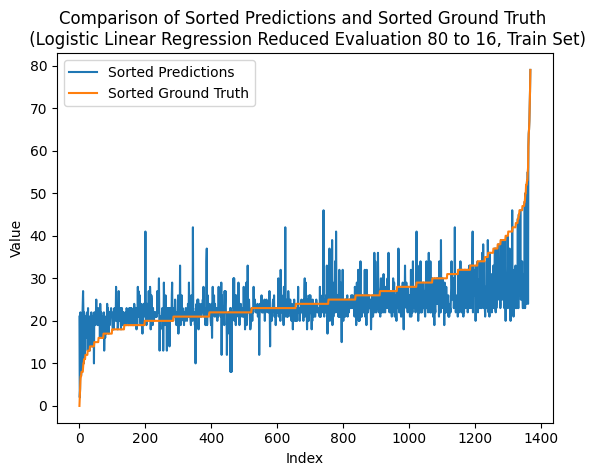

---- ---- ----
class_num = 96
Number of unique elements: 68
[ 0.  6. 12. 18. 24. 30. 36. 42. 48. 54. 60. 66. 72. 78. 84. 90. 96.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.5842621546447068
Coefficient of determination (R-squared score, R2 score): 0.22439405785770128
train eval:
Mean squared error: 1.7185672514619883
Correlation coefficient: 0.5996374605795556
Coefficient of determination (R-squared score, R2 score): 0.30447983713221916


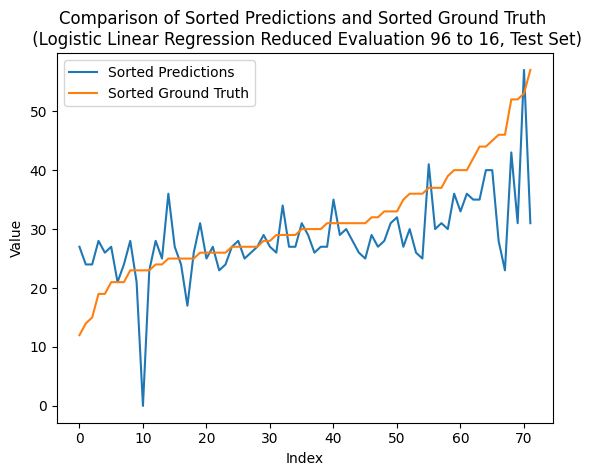

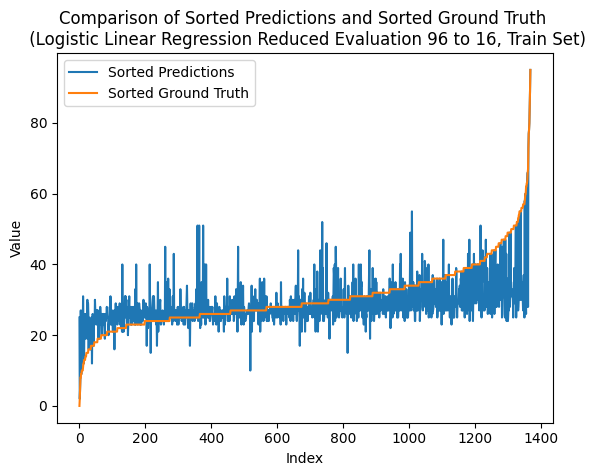

---- ---- ----
class_num = 112
Number of unique elements: 76
[  0.   7.  14.  21.  28.  35.  42.  49.  56.  63.  70.  77.  84.  91.
  98. 105. 112.]
test eval:
Mean squared error: 1.9861111111111112
Correlation coefficient: 0.5042725864979889
Coefficient of determination (R-squared score, R2 score): 0.10555121188428462
train eval:
Mean squared error: 1.7887426900584795
Correlation coefficient: 0.5914189528952266
Coefficient of determination (R-squared score, R2 score): 0.27607918394833697


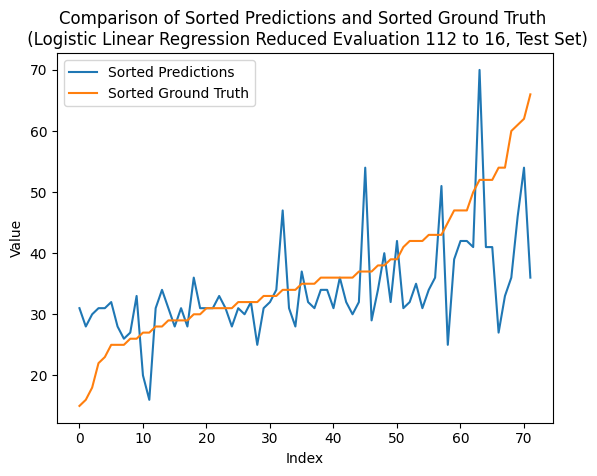

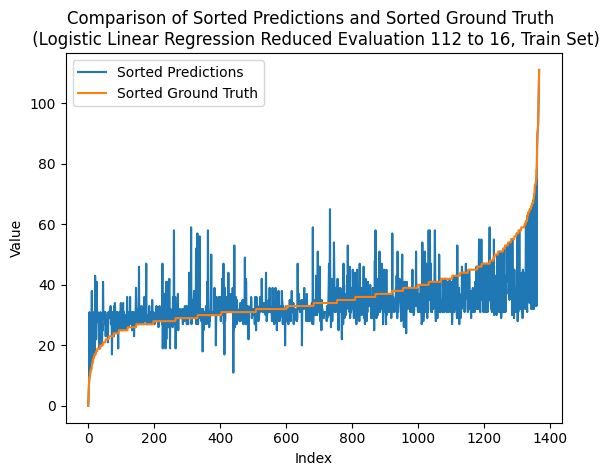

---- ---- ----
class_num = 128
Number of unique elements: 85
[  0.   8.  16.  24.  32.  40.  48.  56.  64.  72.  80.  88.  96. 104.
 112. 120. 128.]
test eval:
Mean squared error: 2.111111111111111
Correlation coefficient: 0.47738602245322687
Coefficient of determination (R-squared score, R2 score): 0.04925723221266609
train eval:
Mean squared error: 1.739766081871345
Correlation coefficient: 0.599254599657913
Coefficient of determination (R-squared score, R2 score): 0.2959004731495881


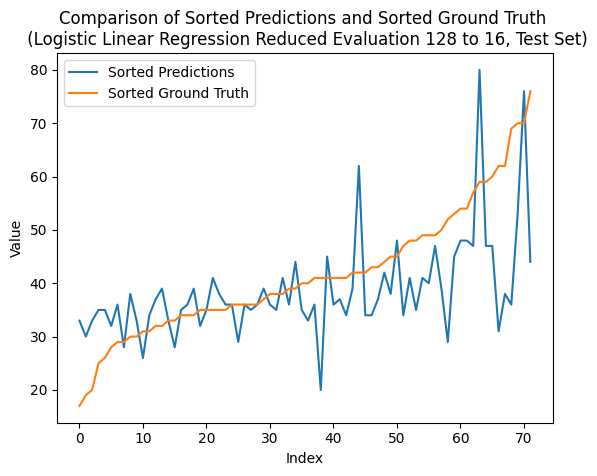

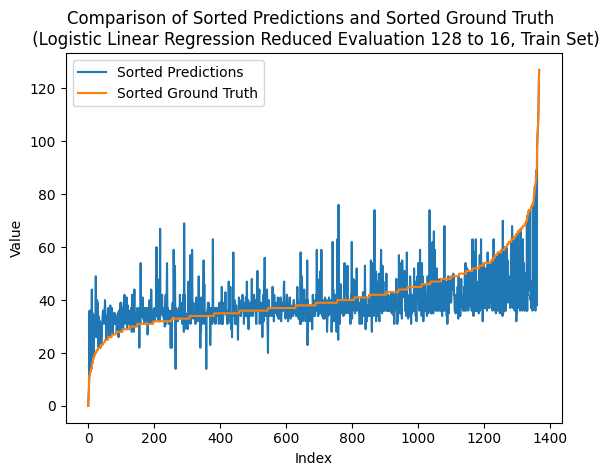

---- ---- ----
class_num = 144
Number of unique elements: 92
[  0.   9.  18.  27.  36.  45.  54.  63.  72.  81.  90.  99. 108. 117.
 126. 135. 144.]
test eval:
Mean squared error: 2.0555555555555554
Correlation coefficient: 0.457775353297472
Coefficient of determination (R-squared score, R2 score): 0.07427677873338545
train eval:
Mean squared error: 1.682748538011696
Correlation coefficient: 0.6175579742056457
Coefficient of determination (R-squared score, R2 score): 0.3189760038614924


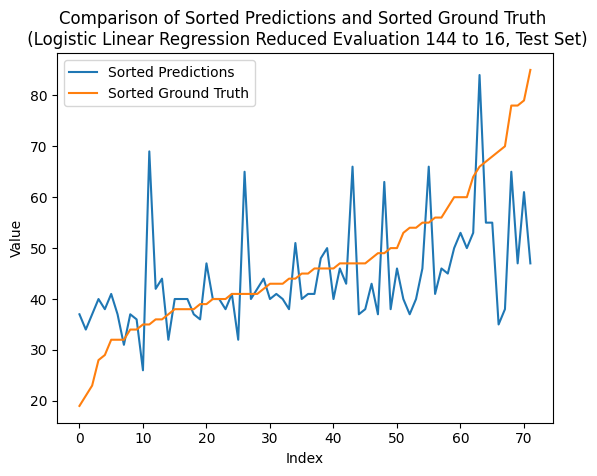

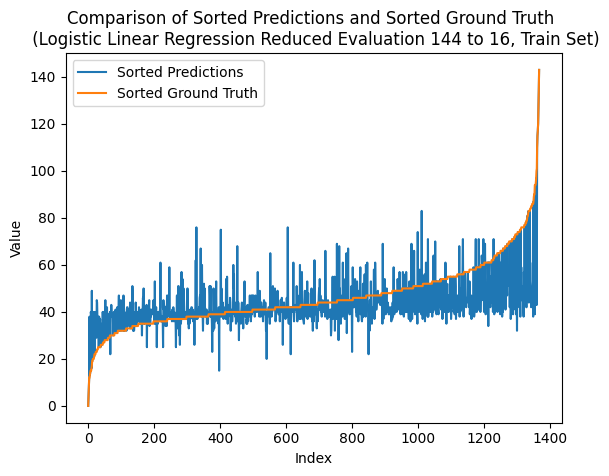

---- ---- ----
class_num = 160
Number of unique elements: 101
[  0.  10.  20.  30.  40.  50.  60.  70.  80.  90. 100. 110. 120. 130.
 140. 150. 160.]
test eval:
Mean squared error: 1.9444444444444444
Correlation coefficient: 0.5352309939802403
Coefficient of determination (R-squared score, R2 score): 0.12431587177482406
train eval:
Mean squared error: 1.659356725146199
Correlation coefficient: 0.6328669490472459
Coefficient of determination (R-squared score, R2 score): 0.3284428882561198


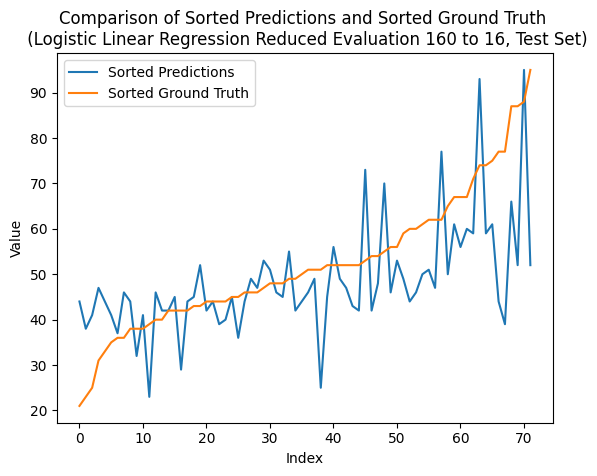

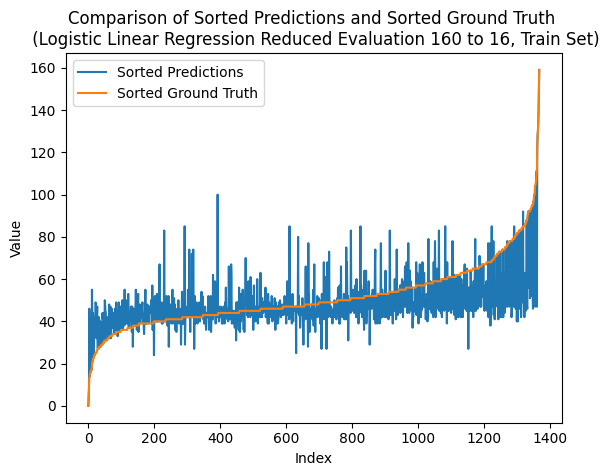

---- ---- ----
class_num = 176
Number of unique elements: 106
[  0.  11.  22.  33.  44.  55.  66.  77.  88.  99. 110. 121. 132. 143.
 154. 165. 176.]
test eval:
Mean squared error: 2.111111111111111
Correlation coefficient: 0.4856066631766664
Coefficient of determination (R-squared score, R2 score): 0.04925723221266609
train eval:
Mean squared error: 1.6710526315789473
Correlation coefficient: 0.62447895494355
Coefficient of determination (R-squared score, R2 score): 0.323709446058806


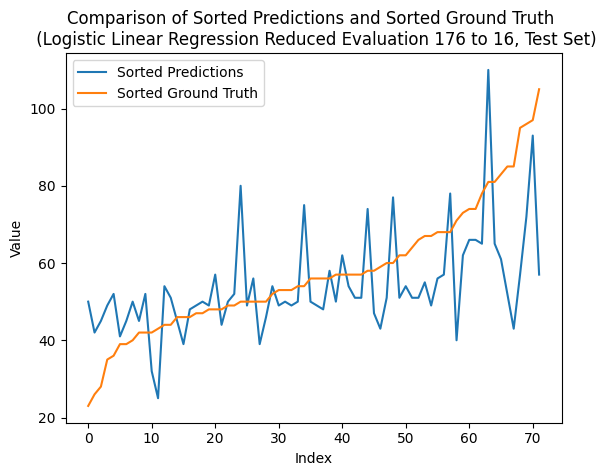

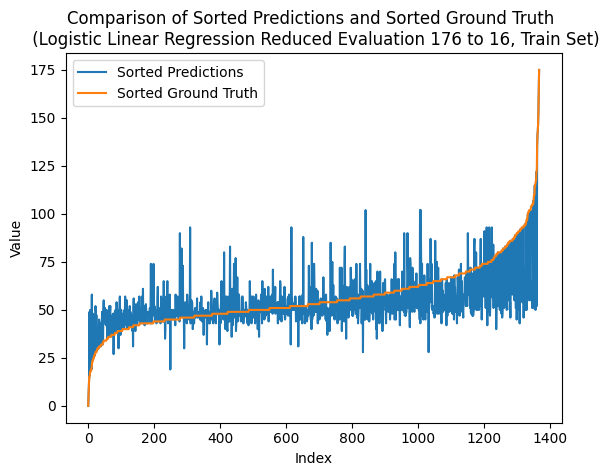

---- ---- ----
class_num = 192
Number of unique elements: 115
[  0.  12.  24.  36.  48.  60.  72.  84.  96. 108. 120. 132. 144. 156.
 168. 180. 192.]
test eval:
Mean squared error: 2.236111111111111
Correlation coefficient: 0.5021929825474497
Coefficient of determination (R-squared score, R2 score): -0.0070367474589523304
train eval:
Mean squared error: 1.5862573099415205
Correlation coefficient: 0.6408004826194157
Coefficient of determination (R-squared score, R2 score): 0.3580269019893303


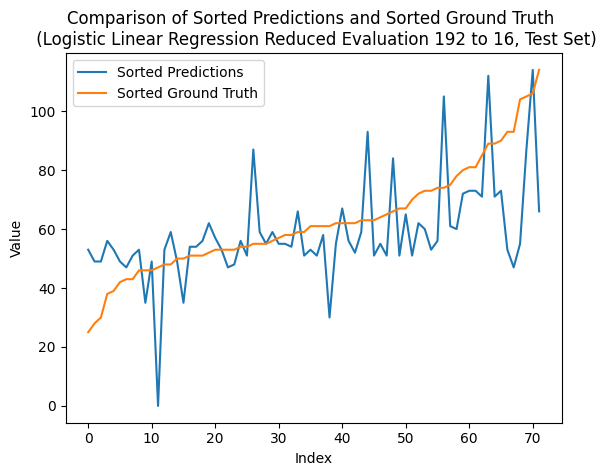

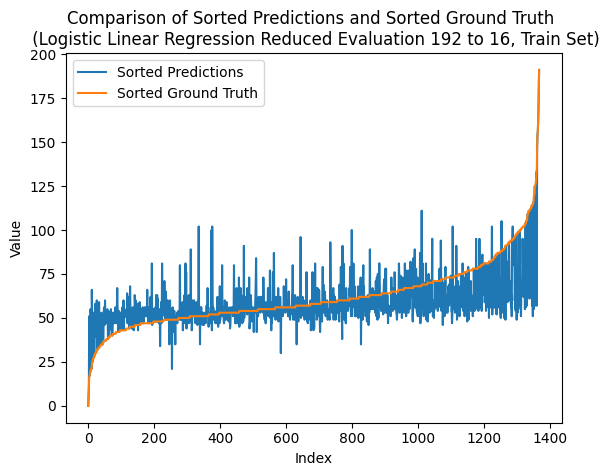

---- ---- ----
class_num = 208
Number of unique elements: 121
[  0.  13.  26.  39.  52.  65.  78.  91. 104. 117. 130. 143. 156. 169.
 182. 195. 208.]
test eval:
Mean squared error: 1.9861111111111112
Correlation coefficient: 0.4984701351164844
Coefficient of determination (R-squared score, R2 score): 0.10555121188428462
train eval:
Mean squared error: 1.6973684210526316
Correlation coefficient: 0.6164096783217288
Coefficient of determination (R-squared score, R2 score): 0.3130592011148502


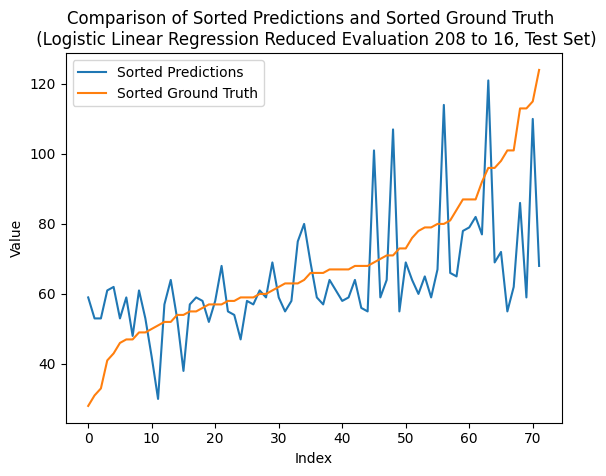

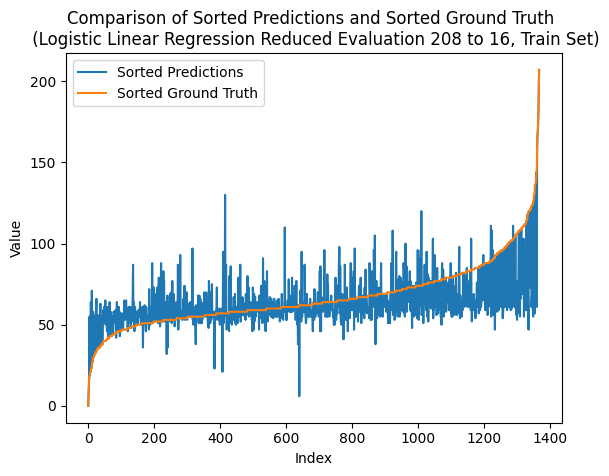

---- ---- ----
class_num = 224
Number of unique elements: 129
[  0.  14.  28.  42.  56.  70.  84.  98. 112. 126. 140. 154. 168. 182.
 196. 210. 224.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.5460466744918934
Coefficient of determination (R-squared score, R2 score): 0.21813917122752147
train eval:
Mean squared error: 1.5869883040935673
Correlation coefficient: 0.6455912060023244
Coefficient of determination (R-squared score, R2 score): 0.3577310618519982


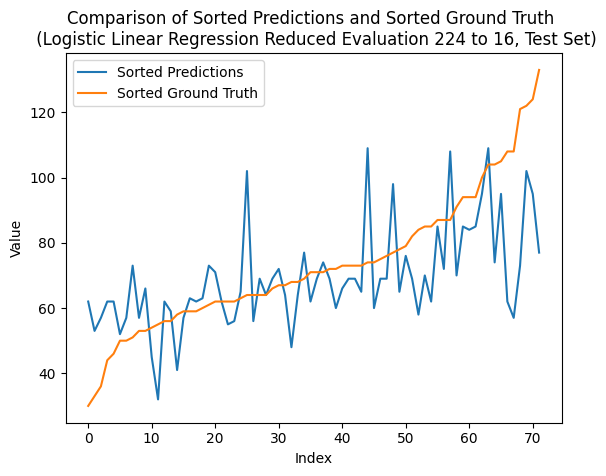

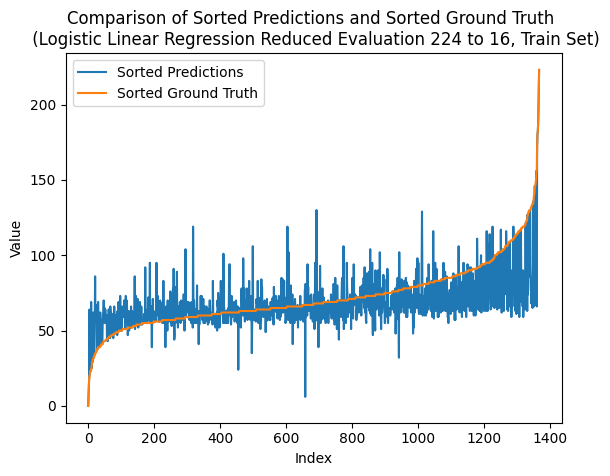

---- ---- ----
class_num = 240
Number of unique elements: 136
[  0.  15.  30.  45.  60.  75.  90. 105. 120. 135. 150. 165. 180. 195.
 210. 225. 240.]
test eval:
Mean squared error: 1.75
Correlation coefficient: 0.5609735204746593
Coefficient of determination (R-squared score, R2 score): 0.21188428459734165
train eval:
Mean squared error: 1.5584795321637428
Correlation coefficient: 0.6549093234983661
Coefficient of determination (R-squared score, R2 score): 0.3692688272079504


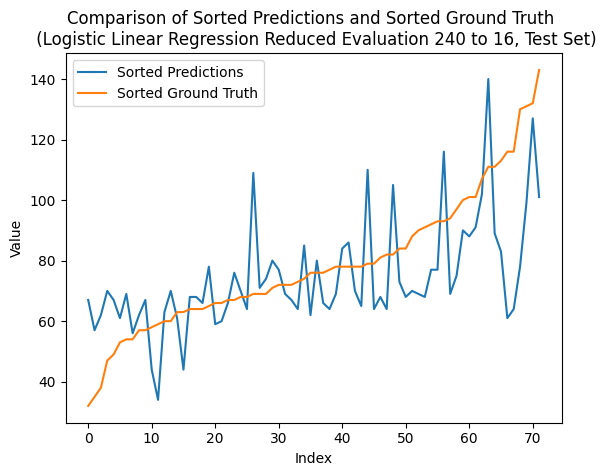

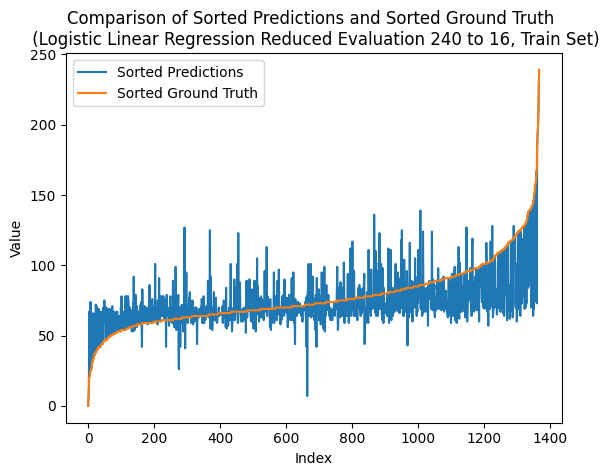

---- ---- ----
class_num = 256
Number of unique elements: 143
[  0.  16.  32.  48.  64.  80.  96. 112. 128. 144. 160. 176. 192. 208.
 224. 240. 256.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.5558209904878391
Coefficient of determination (R-squared score, R2 score): 0.13682564503518369
train eval:
Mean squared error: 1.6578947368421053
Correlation coefficient: 0.6300189728849458
Coefficient of determination (R-squared score, R2 score): 0.32903456853078394


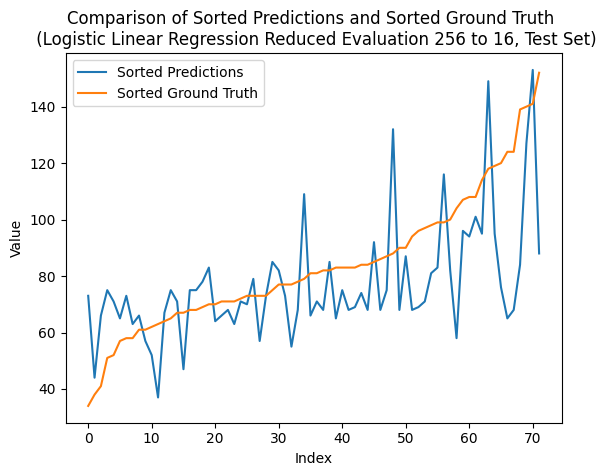

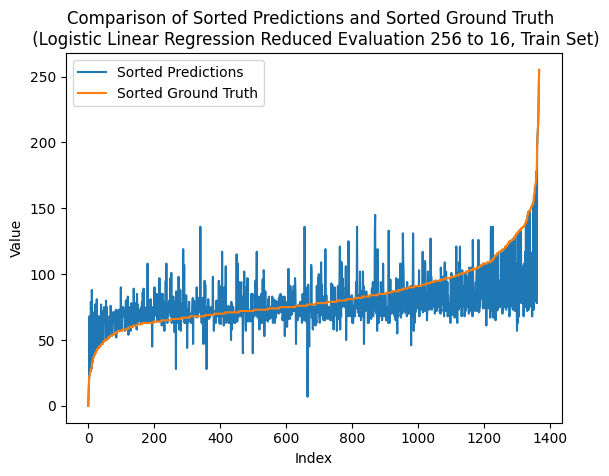

---- ---- ----
class_num = 272
Number of unique elements: 152
[  0.  17.  34.  51.  68.  85. 102. 119. 136. 153. 170. 187. 204. 221.
 238. 255. 272.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.5825868194392554
Coefficient of determination (R-squared score, R2 score): 0.24941360437842064
train eval:
Mean squared error: 1.513157894736842
Correlation coefficient: 0.6656335832145776
Coefficient of determination (R-squared score, R2 score): 0.3876109157225409


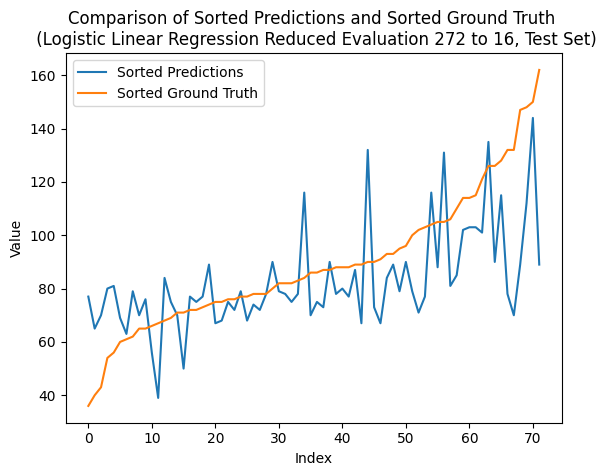

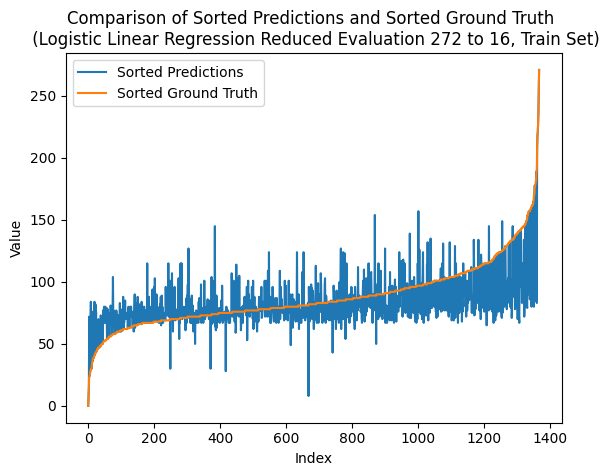

---- ---- ----
class_num = 288
Number of unique elements: 158
[  0.  18.  36.  54.  72.  90. 108. 126. 144. 162. 180. 198. 216. 234.
 252. 270. 288.]
test eval:
Mean squared error: 1.6527777777777777
Correlation coefficient: 0.5725957484772376
Coefficient of determination (R-squared score, R2 score): 0.25566849100860045
train eval:
Mean squared error: 1.4488304093567252
Correlation coefficient: 0.6796341798583605
Coefficient of determination (R-squared score, R2 score): 0.4136448478077662


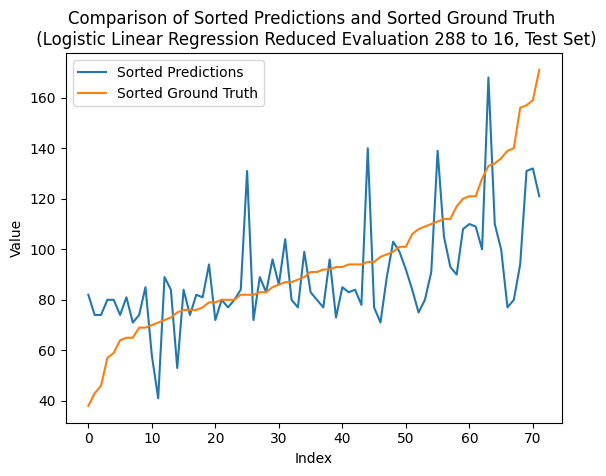

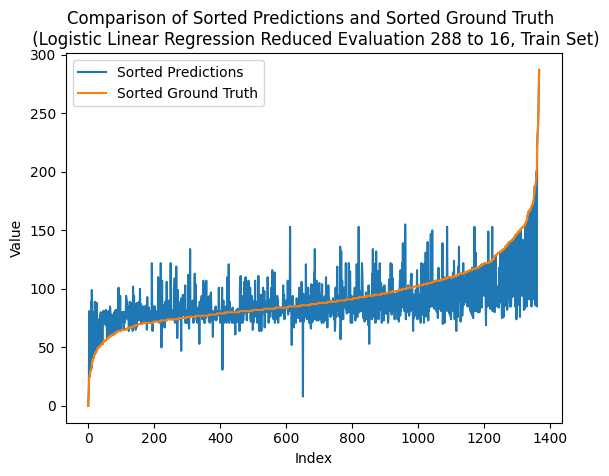

---- ---- ----
class_num = 304
Number of unique elements: 164
[  0.  19.  38.  57.  76.  95. 114. 133. 152. 171. 190. 209. 228. 247.
 266. 285. 304.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.5716077113270863
Coefficient of determination (R-squared score, R2 score): 0.18060985144644248
train eval:
Mean squared error: 1.4320175438596492
Correlation coefficient: 0.6854773497078975
Coefficient of determination (R-squared score, R2 score): 0.42044917096640466


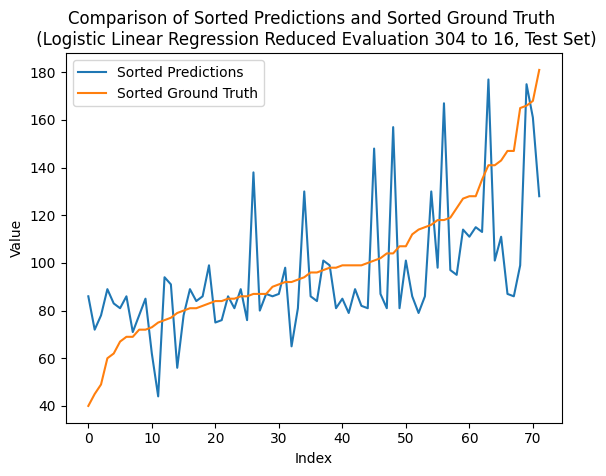

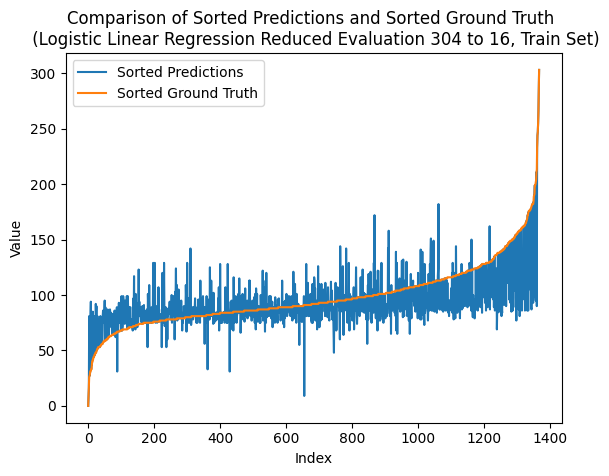

---- ---- ----
class_num = 320
Number of unique elements: 173
[  0.  20.  40.  60.  80. 100. 120. 140. 160. 180. 200. 220. 240. 260.
 280. 300. 320.]
test eval:
Mean squared error: 2.0972222222222223
Correlation coefficient: 0.47098564554165745
Coefficient of determination (R-squared score, R2 score): 0.055512118842846014
train eval:
Mean squared error: 1.5489766081871346
Correlation coefficient: 0.6526729510184647
Coefficient of determination (R-squared score, R2 score): 0.3731147489932677


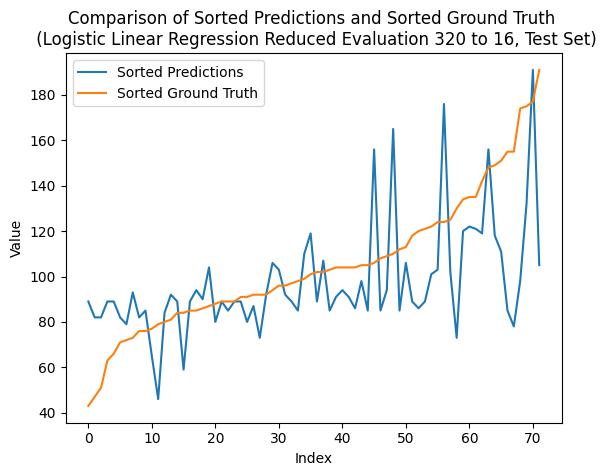

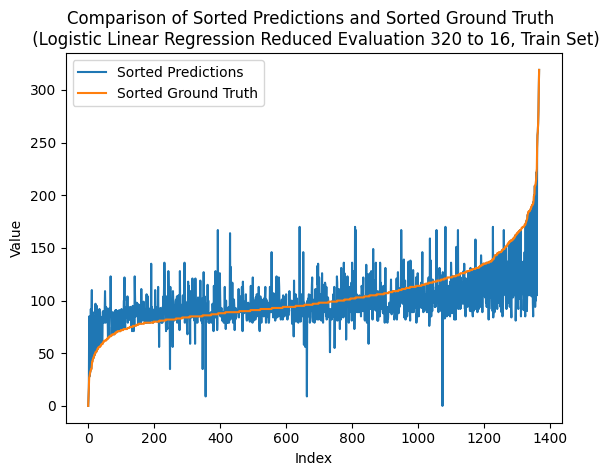

---- ---- ----
class_num = 336
Number of unique elements: 177
[  0.  21.  42.  63.  84. 105. 126. 147. 168. 189. 210. 231. 252. 273.
 294. 315. 336.]
test eval:
Mean squared error: 1.9444444444444444
Correlation coefficient: 0.5352320582275872
Coefficient of determination (R-squared score, R2 score): 0.12431587177482406
train eval:
Mean squared error: 1.493421052631579
Correlation coefficient: 0.6722009513349693
Coefficient of determination (R-squared score, R2 score): 0.3955985994305078


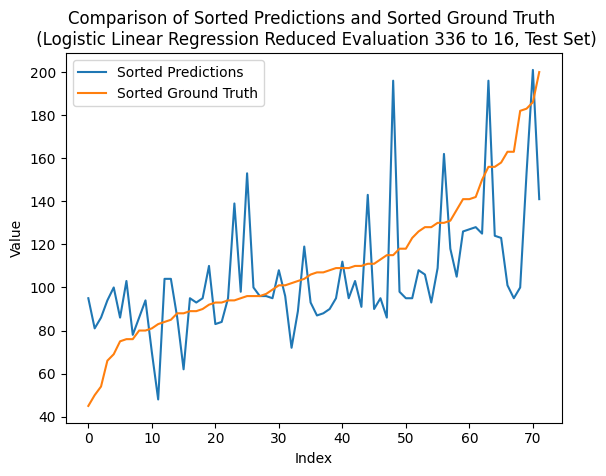

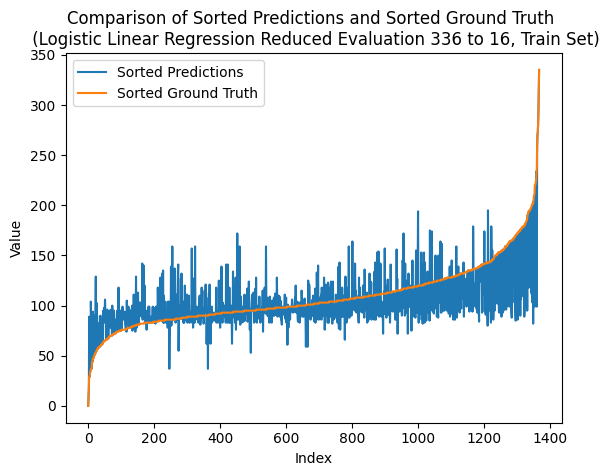

---- ---- ----
class_num = 352
Number of unique elements: 184
[  0.  22.  44.  66.  88. 110. 132. 154. 176. 198. 220. 242. 264. 286.
 308. 330. 352.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.5766854550733127
Coefficient of determination (R-squared score, R2 score): 0.15559030492572323
train eval:
Mean squared error: 1.4919590643274854
Correlation coefficient: 0.6694807735672724
Coefficient of determination (R-squared score, R2 score): 0.39619027970517195


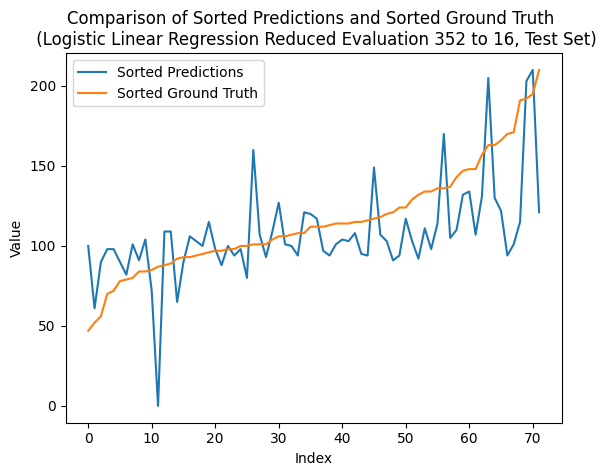

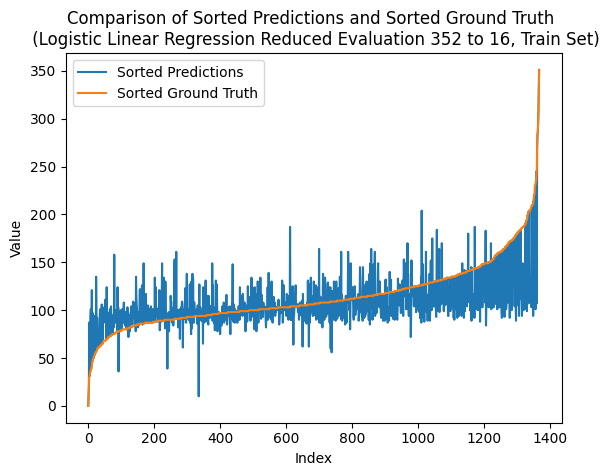

---- ---- ----
class_num = 368
Number of unique elements: 191
[  0.  23.  46.  69.  92. 115. 138. 161. 184. 207. 230. 253. 276. 299.
 322. 345. 368.]
test eval:
Mean squared error: 2.0
Correlation coefficient: 0.49552007027745365
Coefficient of determination (R-squared score, R2 score): 0.09929632525410481
train eval:
Mean squared error: 1.4298245614035088
Correlation coefficient: 0.6849191353802092
Coefficient of determination (R-squared score, R2 score): 0.421336691378401


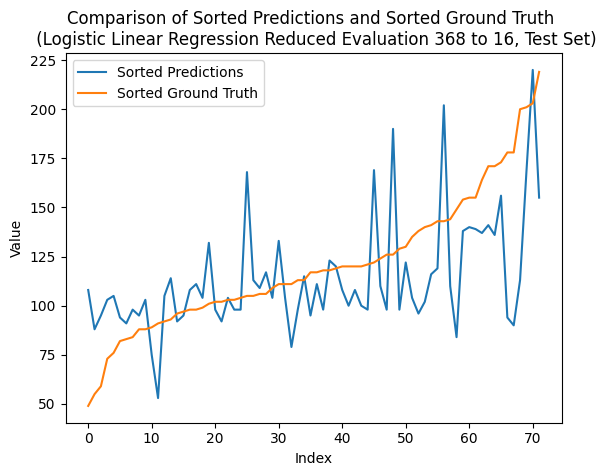

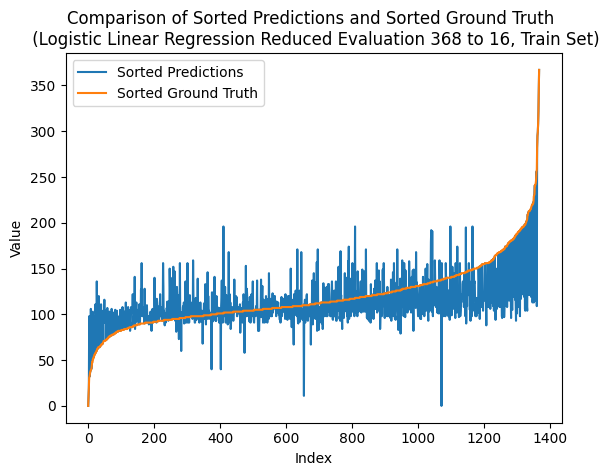

---- ---- ----
class_num = 384
Number of unique elements: 197
[  0.  24.  48.  72.  96. 120. 144. 168. 192. 216. 240. 264. 288. 312.
 336. 360. 384.]
test eval:
Mean squared error: 2.0277777777777777
Correlation coefficient: 0.45452195942273255
Coefficient of determination (R-squared score, R2 score): 0.08678655199374508
train eval:
Mean squared error: 1.5021929824561404
Correlation coefficient: 0.6688932095615617
Coefficient of determination (R-squared score, R2 score): 0.3920485177825225


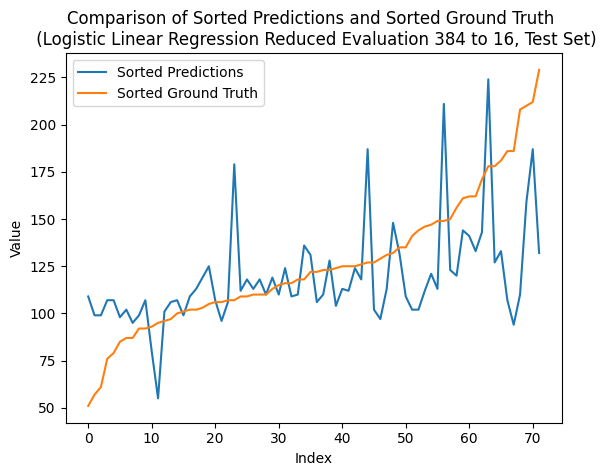

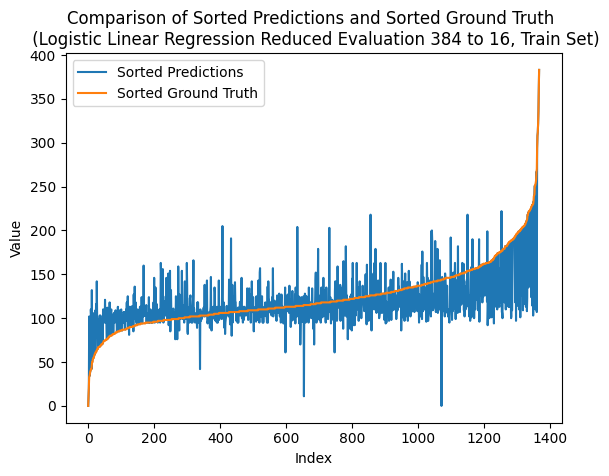

---- ---- ----
class_num = 400
Number of unique elements: 201
[  0.  25.  50.  75. 100. 125. 150. 175. 200. 225. 250. 275. 300. 325.
 350. 375. 400.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.534970225574194
Coefficient of determination (R-squared score, R2 score): 0.16184519155590305
train eval:
Mean squared error: 1.4371345029239766
Correlation coefficient: 0.6854065106536082
Coefficient of determination (R-squared score, R2 score): 0.41837829000508


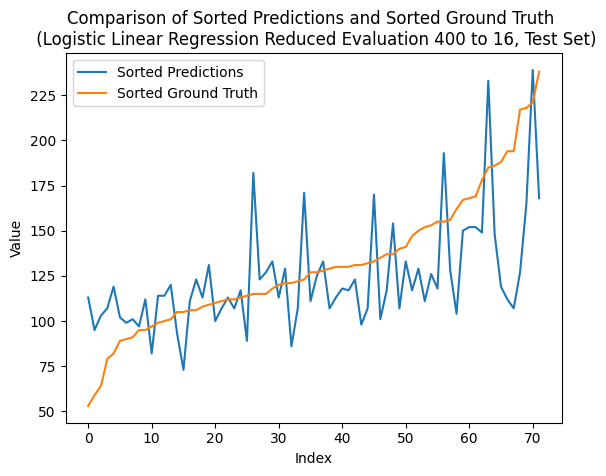

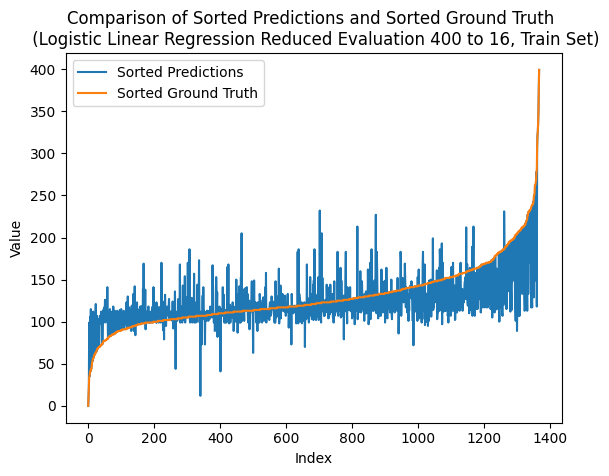

---- ---- ----
class_num = 416
Number of unique elements: 204
[  0.  26.  52.  78. 104. 130. 156. 182. 208. 234. 260. 286. 312. 338.
 364. 390. 416.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.5260623042098596
Coefficient of determination (R-squared score, R2 score): 0.18060985144644248
train eval:
Mean squared error: 1.439327485380117
Correlation coefficient: 0.6829543135309688
Coefficient of determination (R-squared score, R2 score): 0.4174907695930836


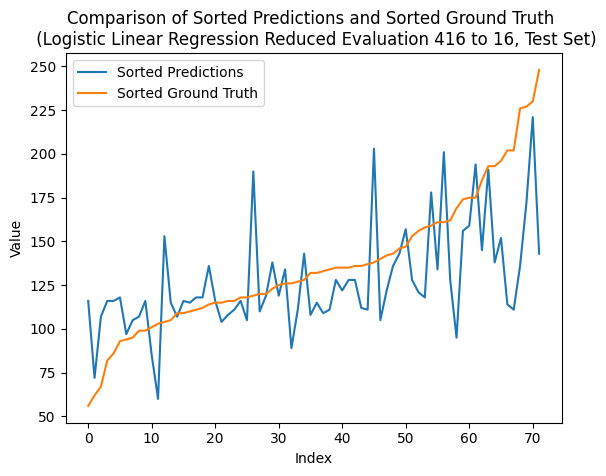

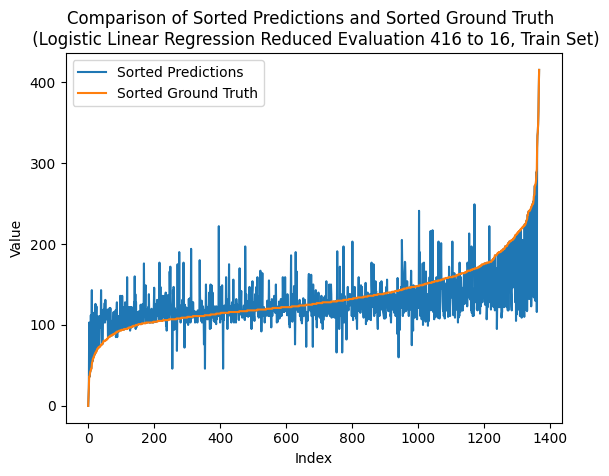

---- ---- ----
class_num = 432
Number of unique elements: 211
[  0.  27.  54.  81. 108. 135. 162. 189. 216. 243. 270. 297. 324. 351.
 378. 405. 432.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.5636522832985089
Coefficient of determination (R-squared score, R2 score): 0.15559030492572323
train eval:
Mean squared error: 1.404970760233918
Correlation coefficient: 0.6944161339953167
Coefficient of determination (R-squared score, R2 score): 0.4313952560476926


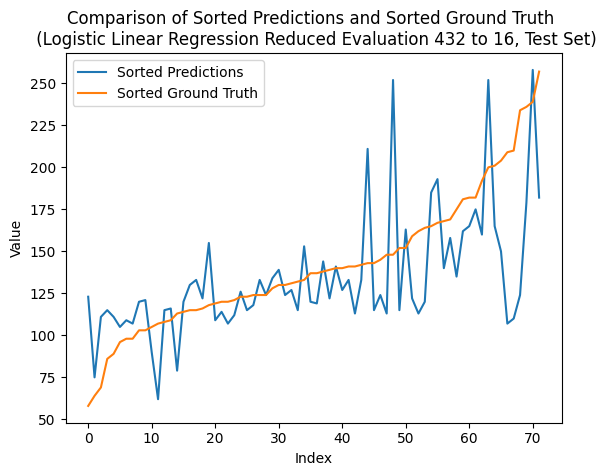

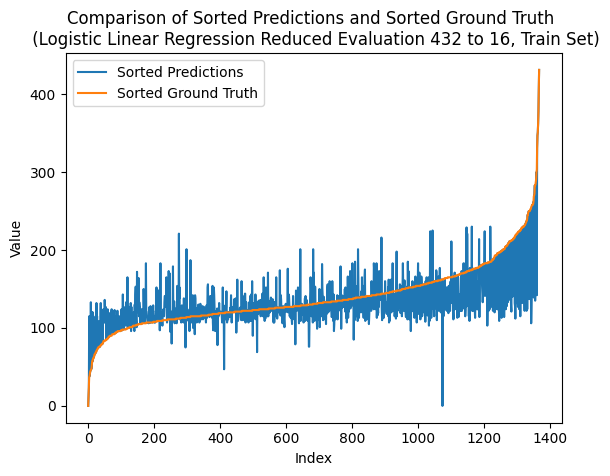

---- ---- ----
class_num = 448
Number of unique elements: 219
[  0.  28.  56.  84. 112. 140. 168. 196. 224. 252. 280. 308. 336. 364.
 392. 420. 448.]
test eval:
Mean squared error: 1.9722222222222223
Correlation coefficient: 0.547070748302988
Coefficient of determination (R-squared score, R2 score): 0.11180609851446444
train eval:
Mean squared error: 1.4283625730994152
Correlation coefficient: 0.6881633804168038
Coefficient of determination (R-squared score, R2 score): 0.4219283716530652


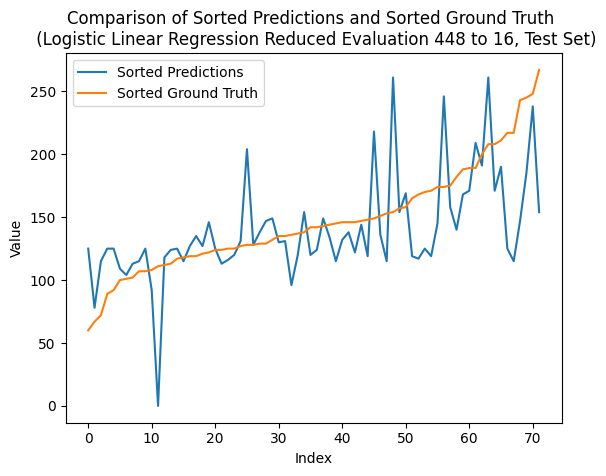

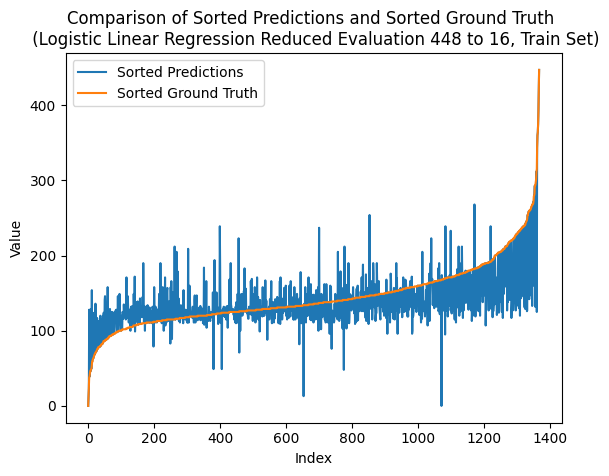

---- ---- ----
class_num = 464
Number of unique elements: 227
[  0.  29.  58.  87. 116. 145. 174. 203. 232. 261. 290. 319. 348. 377.
 406. 435. 464.]
test eval:
Mean squared error: 1.6666666666666667
Correlation coefficient: 0.5648711265090116
Coefficient of determination (R-squared score, R2 score): 0.24941360437842064
train eval:
Mean squared error: 1.4495614035087718
Correlation coefficient: 0.6836585350186538
Coefficient of determination (R-squared score, R2 score): 0.41334900767043414


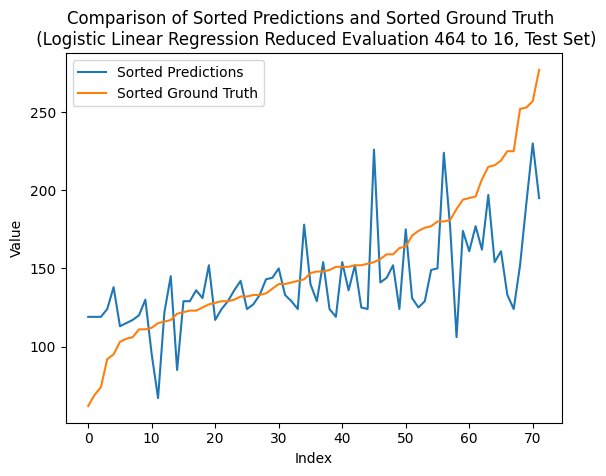

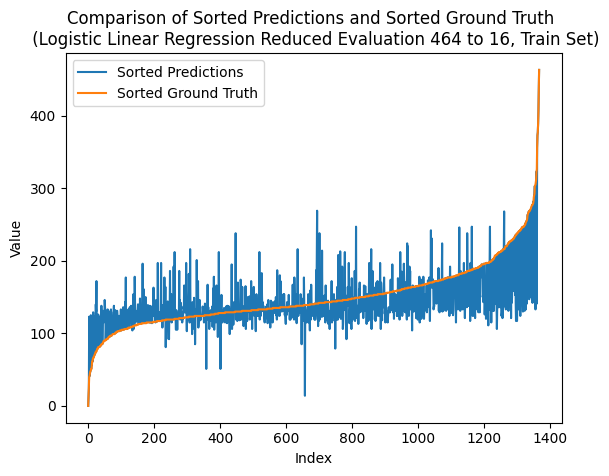

---- ---- ----
class_num = 480
Number of unique elements: 231
[  0.  30.  60.  90. 120. 150. 180. 210. 240. 270. 300. 330. 360. 390.
 420. 450. 480.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.547890464752461
Coefficient of determination (R-squared score, R2 score): 0.1868647380766224
train eval:
Mean squared error: 1.3845029239766082
Correlation coefficient: 0.694536948751427
Coefficient of determination (R-squared score, R2 score): 0.43967877989299153


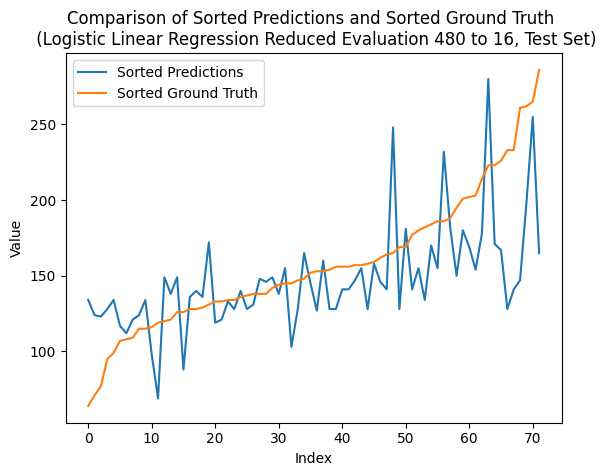

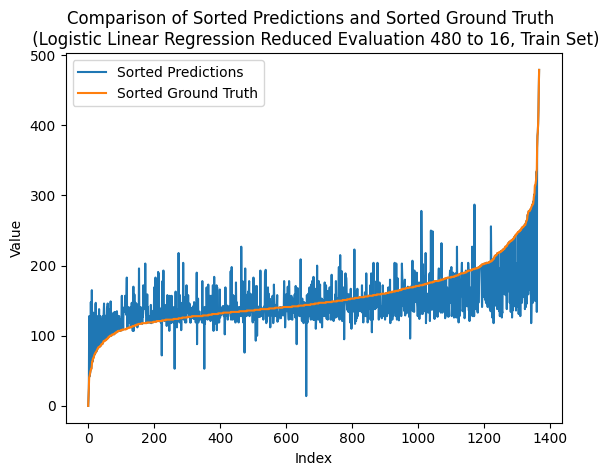

---- ---- ----
class_num = 496
Number of unique elements: 238
[  0.  31.  62.  93. 124. 155. 186. 217. 248. 279. 310. 341. 372. 403.
 434. 465. 496.]
test eval:
Mean squared error: 1.9444444444444444
Correlation coefficient: 0.5196631111784135
Coefficient of determination (R-squared score, R2 score): 0.12431587177482406
train eval:
Mean squared error: 1.344298245614035
Correlation coefficient: 0.7060443146058458
Coefficient of determination (R-squared score, R2 score): 0.45594998744625737


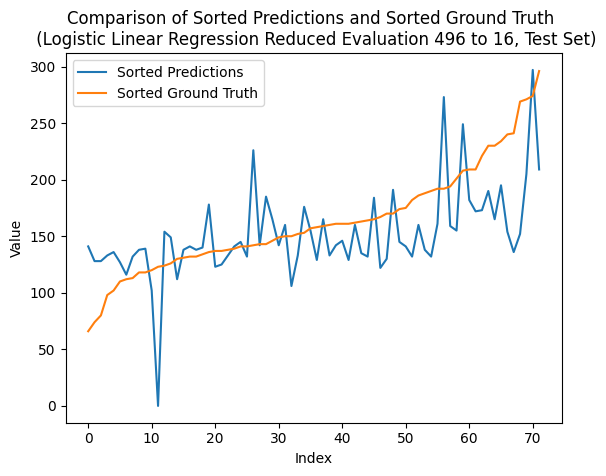

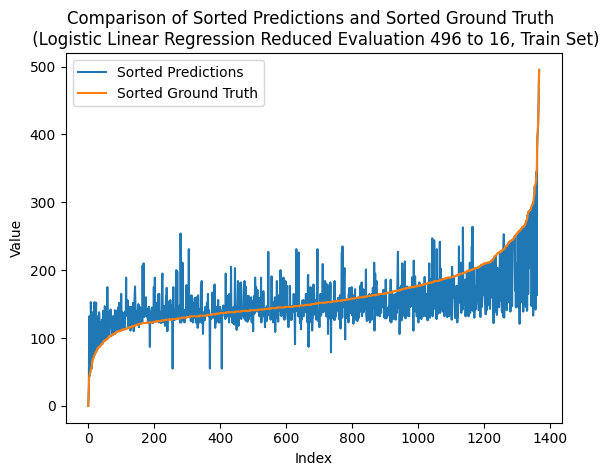

---- ---- ----
class_num = 512
Number of unique elements: 244
[  0.  32.  64.  96. 128. 160. 192. 224. 256. 288. 320. 352. 384. 416.
 448. 480. 512.]
test eval:
Mean squared error: 1.9861111111111112
Correlation coefficient: 0.49859805582511596
Coefficient of determination (R-squared score, R2 score): 0.10555121188428462
train eval:
Mean squared error: 1.5190058479532165
Correlation coefficient: 0.6694727063834228
Coefficient of determination (R-squared score, R2 score): 0.38524419462388404


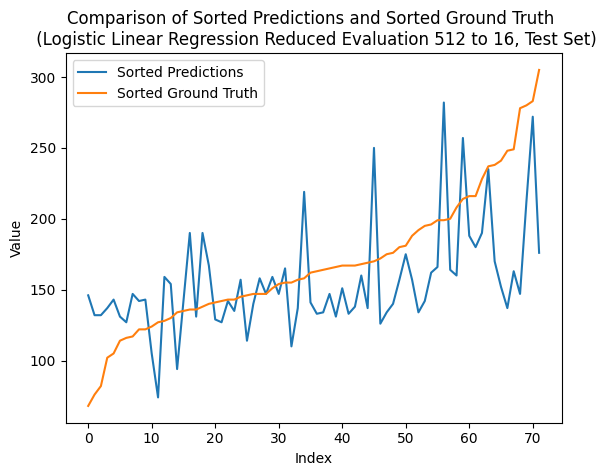

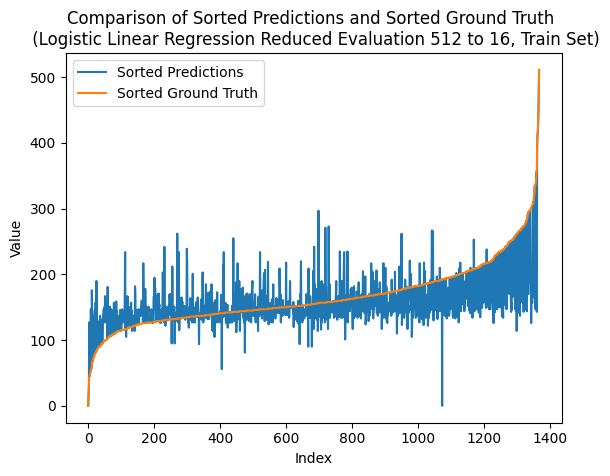

---- ---- ----
class_num = 528
Number of unique elements: 246
[  0.  33.  66.  99. 132. 165. 198. 231. 264. 297. 330. 363. 396. 429.
 462. 495. 528.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.5652749898414968
Coefficient of determination (R-squared score, R2 score): 0.1868647380766224
train eval:
Mean squared error: 1.3691520467836258
Correlation coefficient: 0.7021742469572093
Coefficient of determination (R-squared score, R2 score): 0.4458914227769658


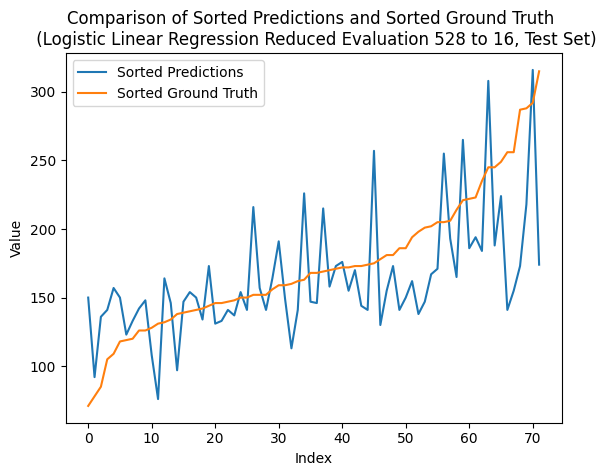

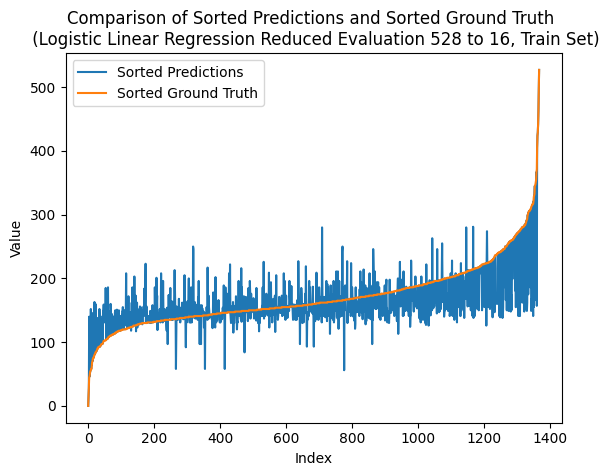

---- ---- ----
class_num = 544
Number of unique elements: 249
[  0.  34.  68. 102. 136. 170. 204. 238. 272. 306. 340. 374. 408. 442.
 476. 510. 544.]
test eval:
Mean squared error: 1.5972222222222223
Correlation coefficient: 0.5793982506849946
Coefficient of determination (R-squared score, R2 score): 0.2806880375293198
train eval:
Mean squared error: 1.4071637426900585
Correlation coefficient: 0.6907627209228226
Coefficient of determination (R-squared score, R2 score): 0.4305077356356962


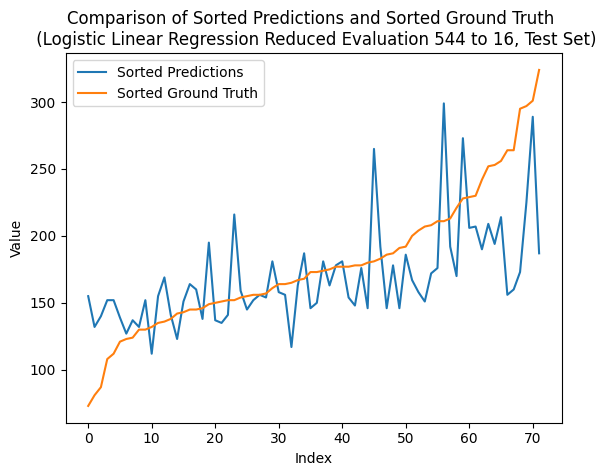

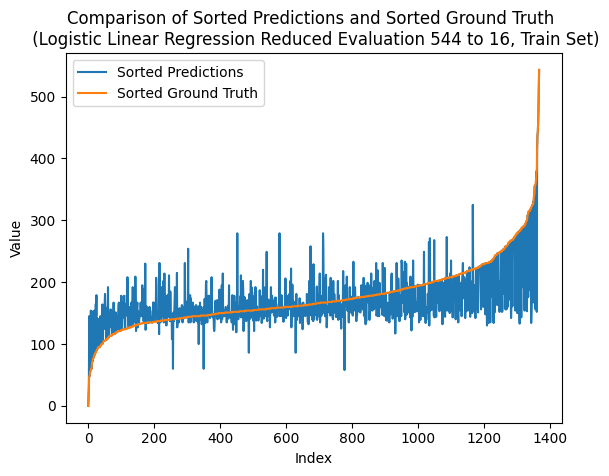

---- ---- ----
class_num = 560
Number of unique elements: 257
[  0.  35.  70. 105. 140. 175. 210. 245. 280. 315. 350. 385. 420. 455.
 490. 525. 560.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.5310604484135896
Coefficient of determination (R-squared score, R2 score): 0.18060985144644248
train eval:
Mean squared error: 1.3801169590643274
Correlation coefficient: 0.6977273944412533
Coefficient of determination (R-squared score, R2 score): 0.44145382071698414


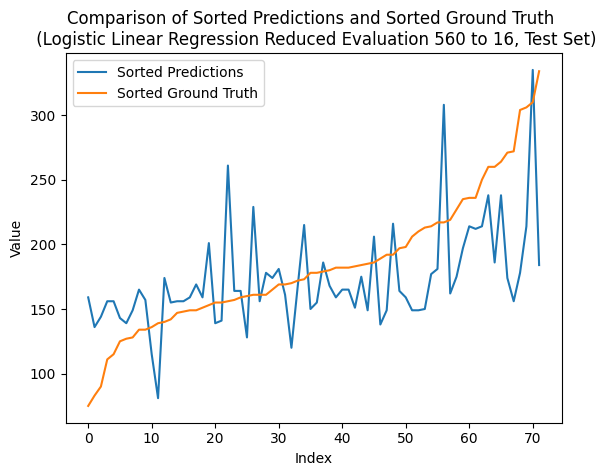

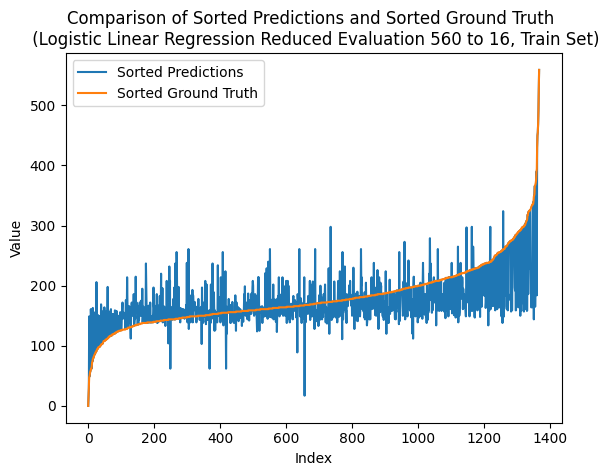

---- ---- ----
class_num = 576
Number of unique elements: 261
[  0.  36.  72. 108. 144. 180. 216. 252. 288. 324. 360. 396. 432. 468.
 504. 540. 576.]
test eval:
Mean squared error: 1.6944444444444444
Correlation coefficient: 0.5653789348304394
Coefficient of determination (R-squared score, R2 score): 0.23690383111806101
train eval:
Mean squared error: 1.378654970760234
Correlation coefficient: 0.6973377682013654
Coefficient of determination (R-squared score, R2 score): 0.4420455009916484


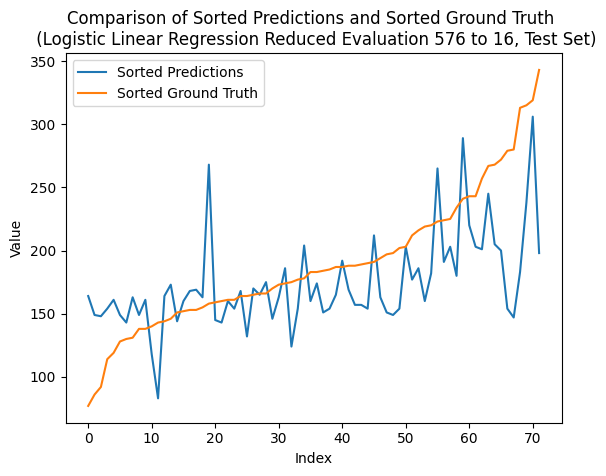

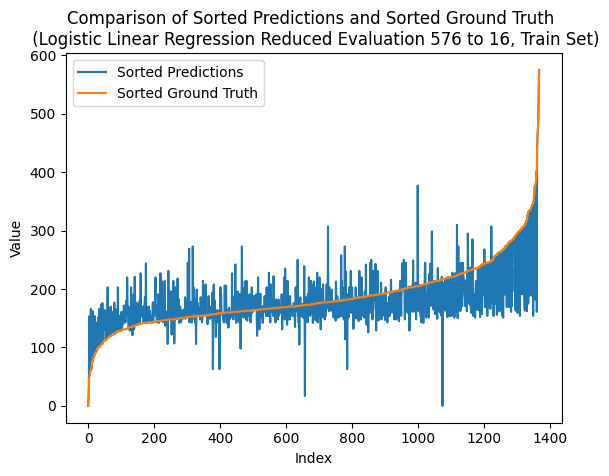

---- ---- ----
class_num = 592
Number of unique elements: 264
[  0.  37.  74. 111. 148. 185. 222. 259. 296. 333. 370. 407. 444. 481.
 518. 555. 592.]
test eval:
Mean squared error: 1.7222222222222223
Correlation coefficient: 0.5959451582466508
Coefficient of determination (R-squared score, R2 score): 0.22439405785770128
train eval:
Mean squared error: 1.3187134502923976
Correlation coefficient: 0.7116933923479251
Coefficient of determination (R-squared score, R2 score): 0.4663043922528811


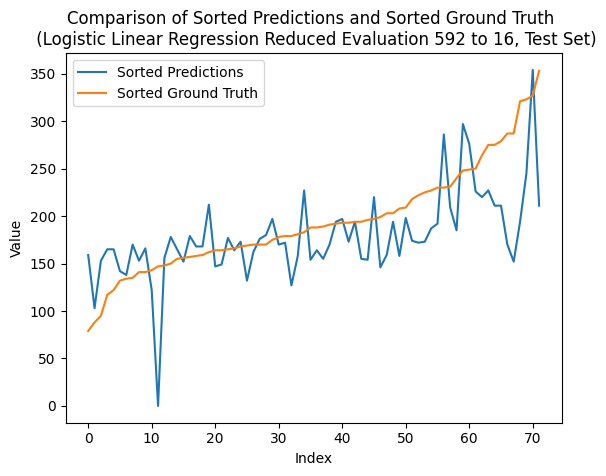

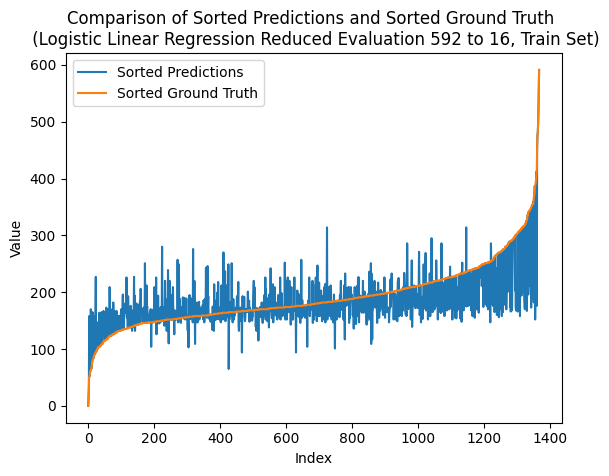

---- ---- ----
class_num = 608
Number of unique elements: 267
[  0.  38.  76. 114. 152. 190. 228. 266. 304. 342. 380. 418. 456. 494.
 532. 570. 608.]
test eval:
Mean squared error: 1.7638888888888888
Correlation coefficient: 0.5560213436501915
Coefficient of determination (R-squared score, R2 score): 0.20562939796716184
train eval:
Mean squared error: 1.3318713450292399
Correlation coefficient: 0.7102819165845323
Coefficient of determination (R-squared score, R2 score): 0.4609792697809032


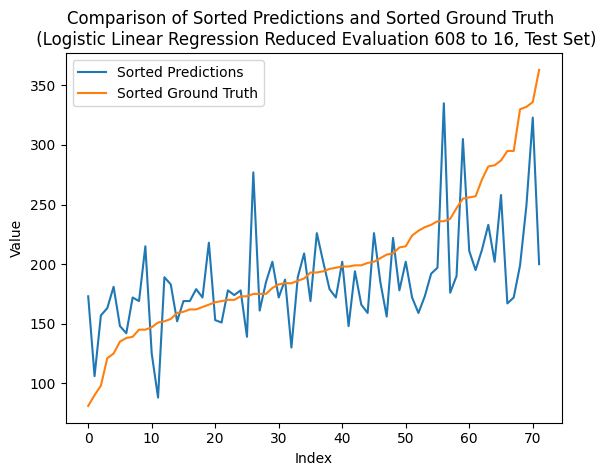

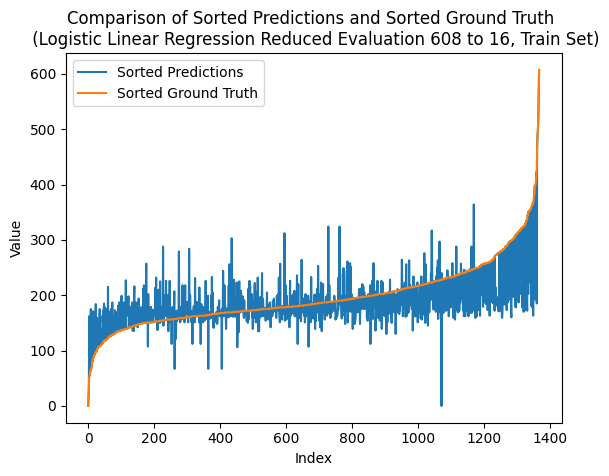

---- ---- ----
class_num = 624
Number of unique elements: 276
[  0.  39.  78. 117. 156. 195. 234. 273. 312. 351. 390. 429. 468. 507.
 546. 585. 624.]
test eval:
Mean squared error: 1.9722222222222223
Correlation coefficient: 0.5235278543187498
Coefficient of determination (R-squared score, R2 score): 0.11180609851446444
train eval:
Mean squared error: 1.3369883040935673
Correlation coefficient: 0.7101188299338393
Coefficient of determination (R-squared score, R2 score): 0.4589083888195784


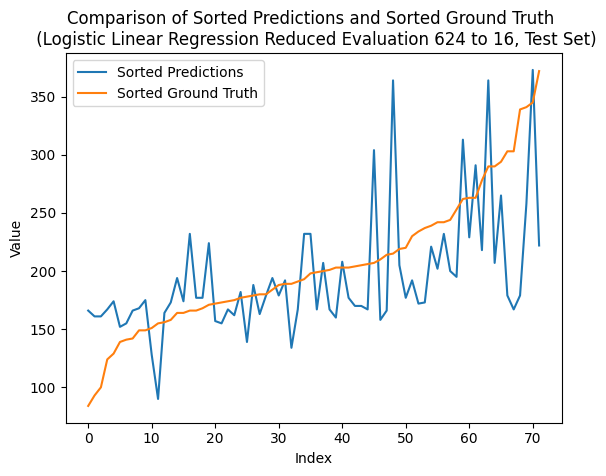

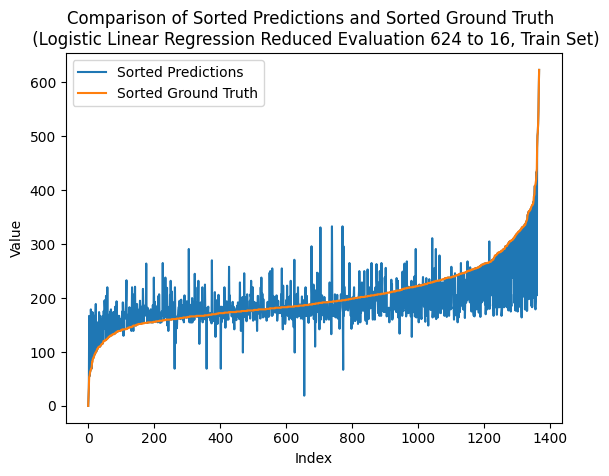

---- ---- ----
class_num = 640
Number of unique elements: 283
[  0.  40.  80. 120. 160. 200. 240. 280. 320. 360. 400. 440. 480. 520.
 560. 600. 640.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.5227840554193932
Coefficient of determination (R-squared score, R2 score): 0.15559030492572323
train eval:
Mean squared error: 1.3742690058479532
Correlation coefficient: 0.7037158137433195
Coefficient of determination (R-squared score, R2 score): 0.443820541815641


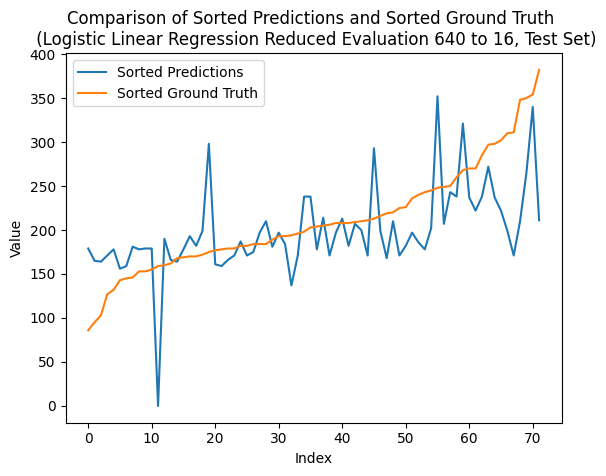

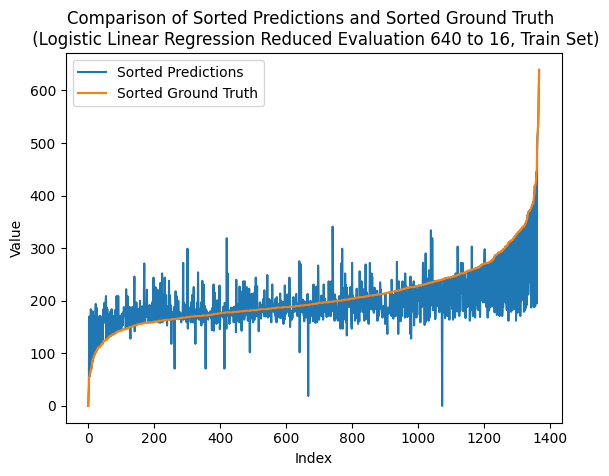

---- ---- ----
class_num = 656
Number of unique elements: 289
[  0.  41.  82. 123. 164. 205. 246. 287. 328. 369. 410. 451. 492. 533.
 574. 615. 656.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.5140709679850606
Coefficient of determination (R-squared score, R2 score): 0.15559030492572323
train eval:
Mean squared error: 1.314327485380117
Correlation coefficient: 0.7136871813389302
Coefficient of determination (R-squared score, R2 score): 0.4680794330768737


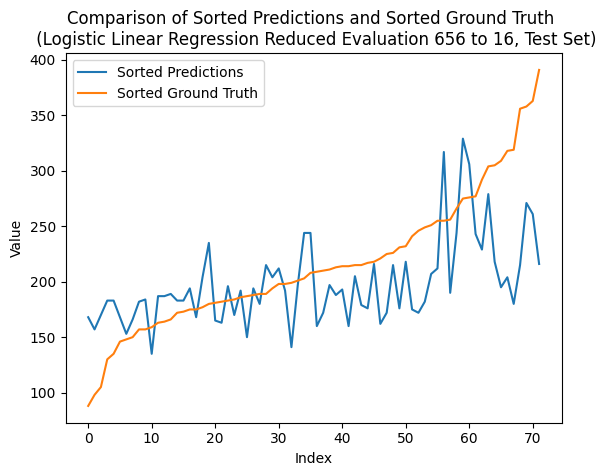

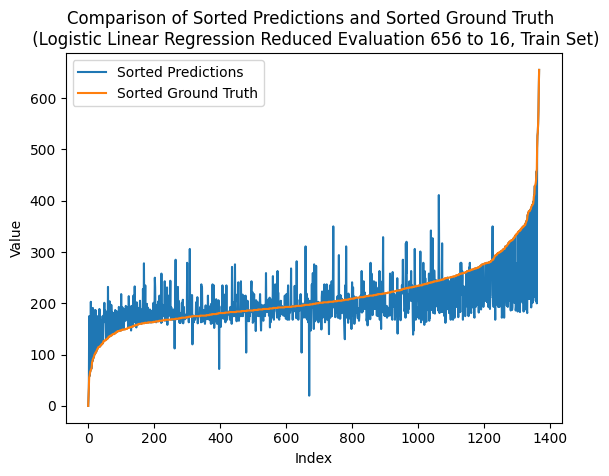

---- ---- ----
class_num = 672
Number of unique elements: 286
[  0.  42.  84. 126. 168. 210. 252. 294. 336. 378. 420. 462. 504. 546.
 588. 630. 672.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.5652598756284566
Coefficient of determination (R-squared score, R2 score): 0.1430805316653636
train eval:
Mean squared error: 1.3954678362573099
Correlation coefficient: 0.6977102886624406
Coefficient of determination (R-squared score, R2 score): 0.43524117783301


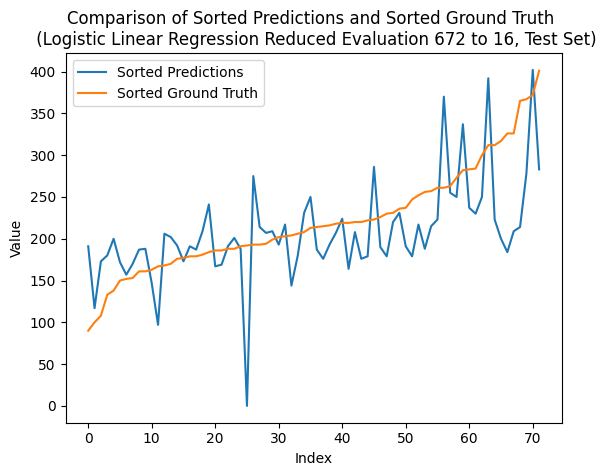

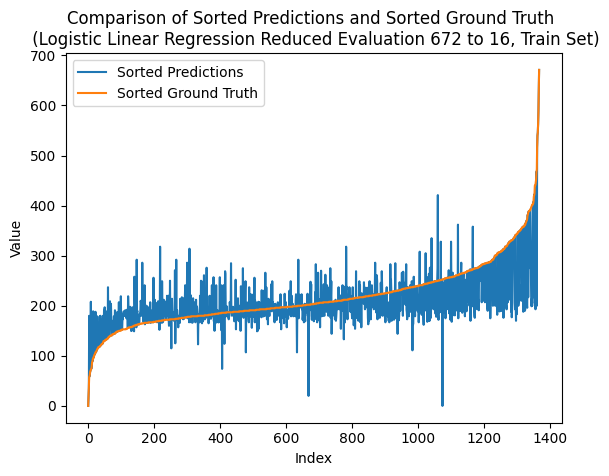

---- ---- ----
class_num = 688
Number of unique elements: 296
[  0.  43.  86. 129. 172. 215. 258. 301. 344. 387. 430. 473. 516. 559.
 602. 645. 688.]
test eval:
Mean squared error: 1.8333333333333333
Correlation coefficient: 0.5046002948714309
Coefficient of determination (R-squared score, R2 score): 0.17435496481626267
train eval:
Mean squared error: 1.2609649122807018
Correlation coefficient: 0.7266829236098219
Coefficient of determination (R-squared score, R2 score): 0.48967576310211747


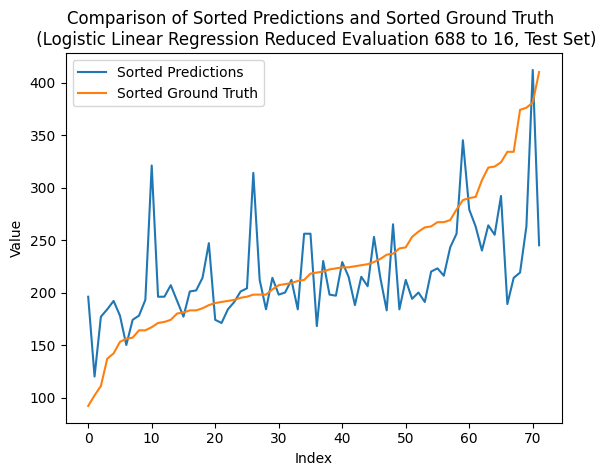

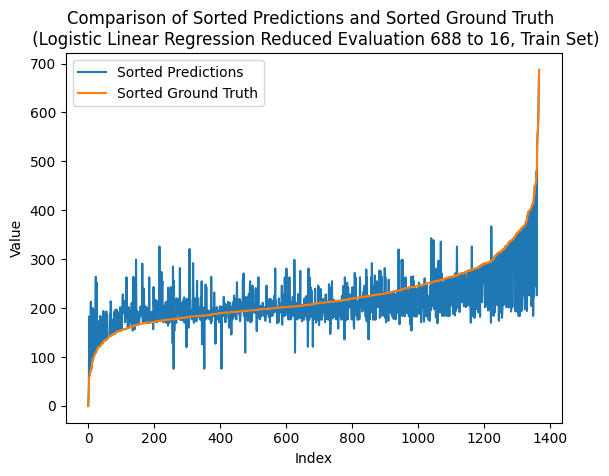

---- ---- ----
class_num = 704
Number of unique elements: 303
[  0.  44.  88. 132. 176. 220. 264. 308. 352. 396. 440. 484. 528. 572.
 616. 660. 704.]
test eval:
Mean squared error: 1.8888888888888888
Correlation coefficient: 0.529453636509299
Coefficient of determination (R-squared score, R2 score): 0.14933541829554342
train eval:
Mean squared error: 1.3092105263157894
Correlation coefficient: 0.7153093559797474
Coefficient of determination (R-squared score, R2 score): 0.4701503140381984


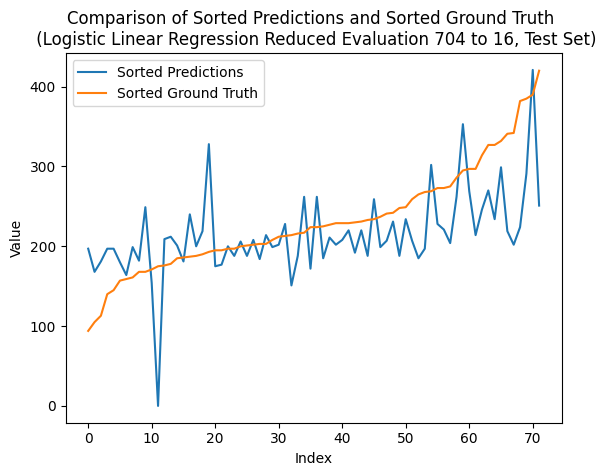

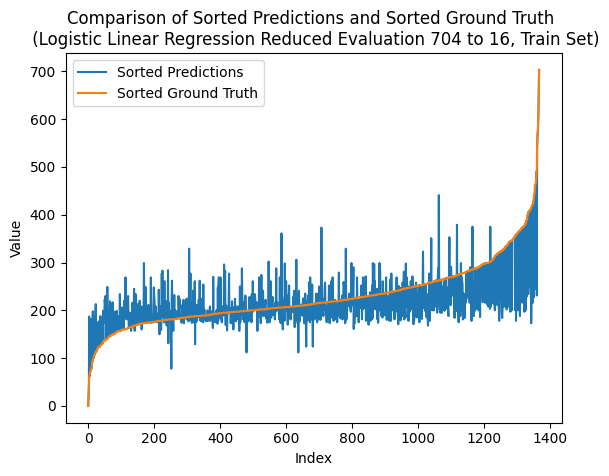

---- ---- ----
class_num = 720
Number of unique elements: 301
[  0.  45.  90. 135. 180. 225. 270. 315. 360. 405. 450. 495. 540. 585.
 630. 675. 720.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.5847112602566467
Coefficient of determination (R-squared score, R2 score): 0.21813917122752147
train eval:
Mean squared error: 1.2551169590643274
Correlation coefficient: 0.7305513594114825
Coefficient of determination (R-squared score, R2 score): 0.49204248420077423


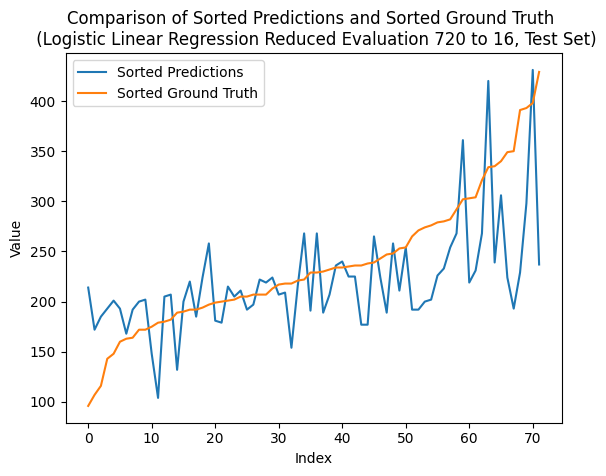

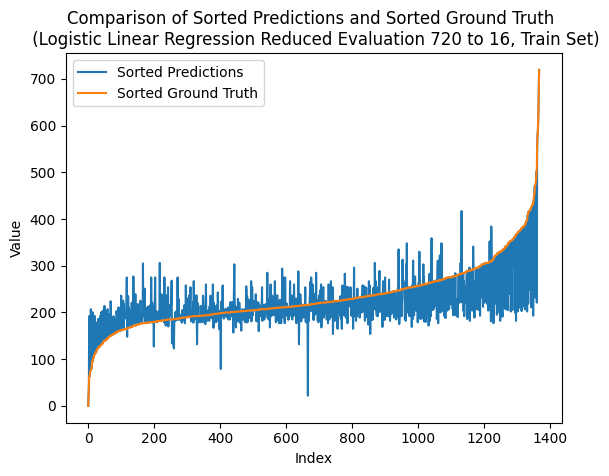

---- ---- ----
class_num = 736
Number of unique elements: 305
[  0.  46.  92. 138. 184. 230. 276. 322. 368. 414. 460. 506. 552. 598.
 644. 690. 736.]
test eval:
Mean squared error: 2.0277777777777777
Correlation coefficient: 0.46823650867493877
Coefficient of determination (R-squared score, R2 score): 0.08678655199374508
train eval:
Mean squared error: 1.3289473684210527
Correlation coefficient: 0.7118455044586857
Coefficient of determination (R-squared score, R2 score): 0.46216263033023164


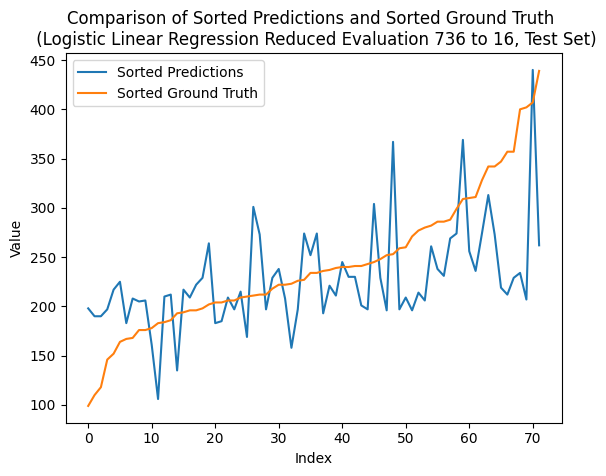

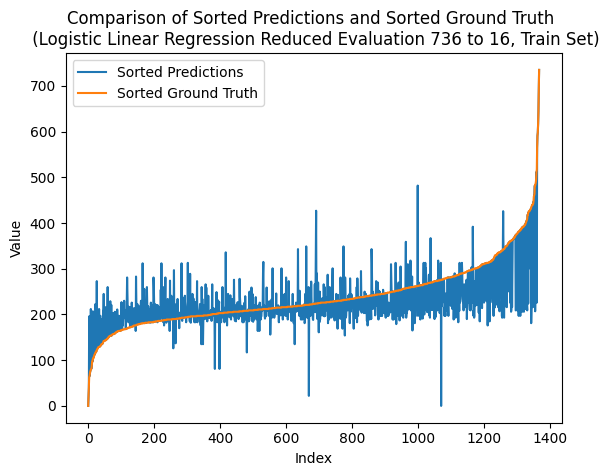

---- ---- ----
class_num = 752
Number of unique elements: 309
[  0.  47.  94. 141. 188. 235. 282. 329. 376. 423. 470. 517. 564. 611.
 658. 705. 752.]
test eval:
Mean squared error: 2.0
Correlation coefficient: 0.5239289261492032
Coefficient of determination (R-squared score, R2 score): 0.09929632525410481
train eval:
Mean squared error: 1.2880116959064327
Correlation coefficient: 0.7250005536617228
Coefficient of determination (R-squared score, R2 score): 0.47872967802082955


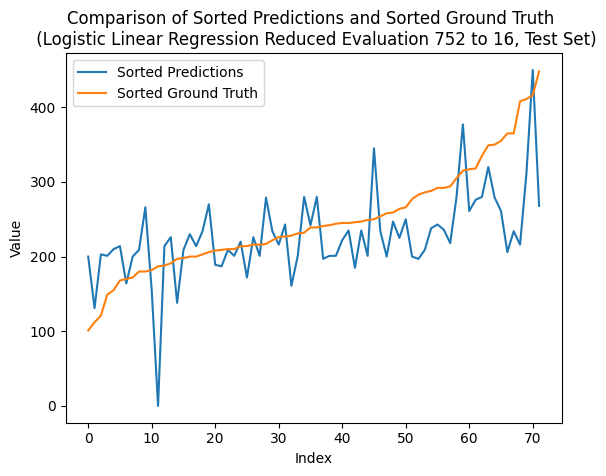

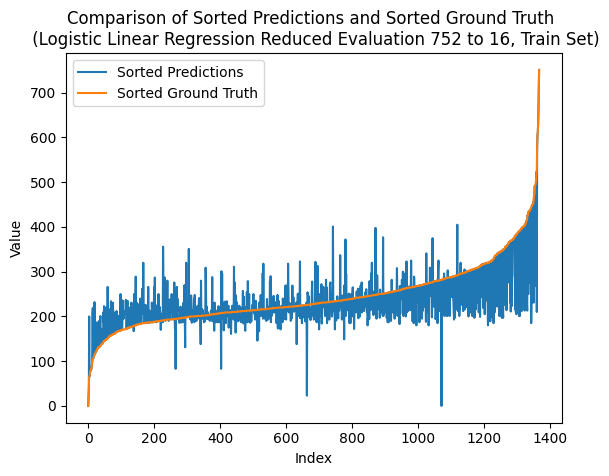

---- ---- ----
class_num = 768
Number of unique elements: 316
[  0.  48.  96. 144. 192. 240. 288. 336. 384. 432. 480. 528. 576. 624.
 672. 720. 768.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.5231864530986835
Coefficient of determination (R-squared score, R2 score): 0.1430805316653636
train eval:
Mean squared error: 1.3062865497076024
Correlation coefficient: 0.7248861113739451
Coefficient of determination (R-squared score, R2 score): 0.47133367458752684


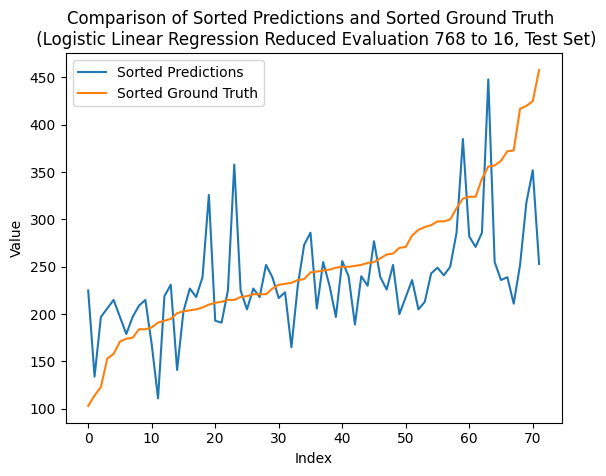

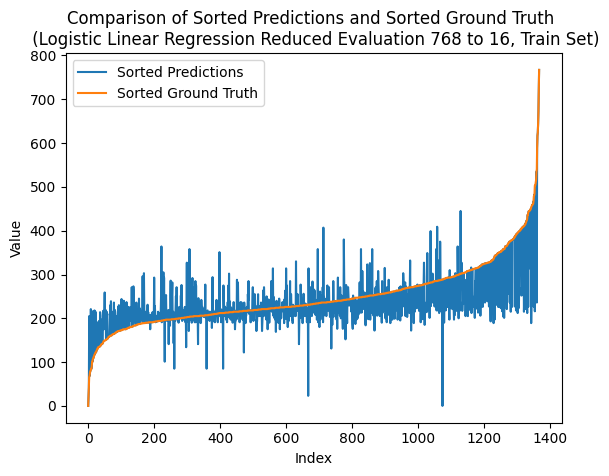

---- ---- ----
class_num = 784
Number of unique elements: 322
[  0.  49.  98. 147. 196. 245. 294. 343. 392. 441. 490. 539. 588. 637.
 686. 735. 784.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.5492064202911231
Coefficient of determination (R-squared score, R2 score): 0.19311962470680222
train eval:
Mean squared error: 1.3252923976608186
Correlation coefficient: 0.7139022410000105
Coefficient of determination (R-squared score, R2 score): 0.46364183101689216


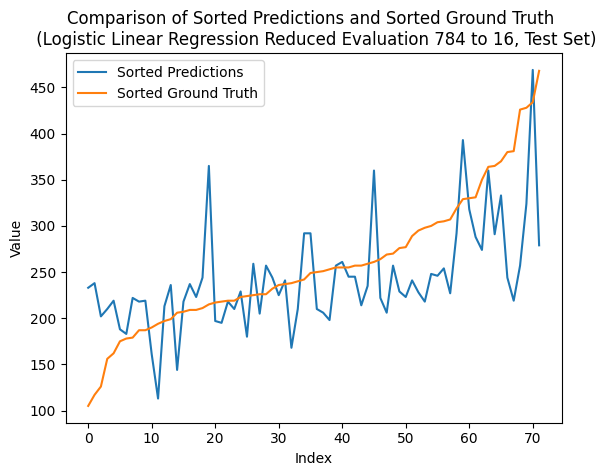

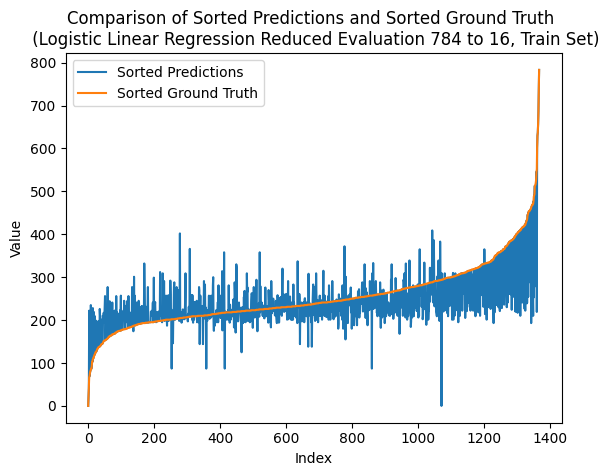

---- ---- ----
class_num = 800
Number of unique elements: 321
[  0.  50. 100. 150. 200. 250. 300. 350. 400. 450. 500. 550. 600. 650.
 700. 750. 800.]
test eval:
Mean squared error: 1.7916666666666667
Correlation coefficient: 0.5261061384718736
Coefficient of determination (R-squared score, R2 score): 0.19311962470680222
train eval:
Mean squared error: 1.2887426900584795
Correlation coefficient: 0.7264070435601421
Coefficient of determination (R-squared score, R2 score): 0.47843383788349736


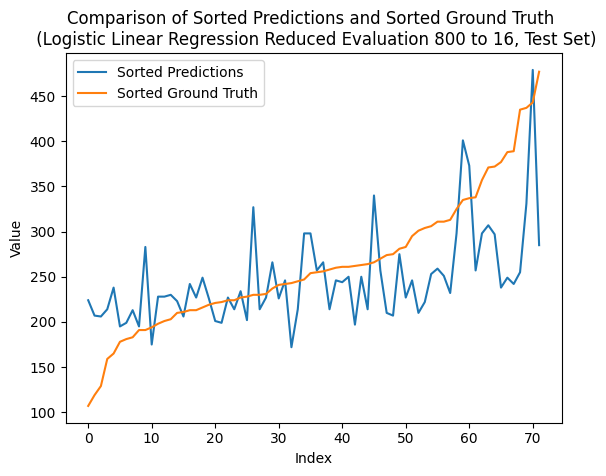

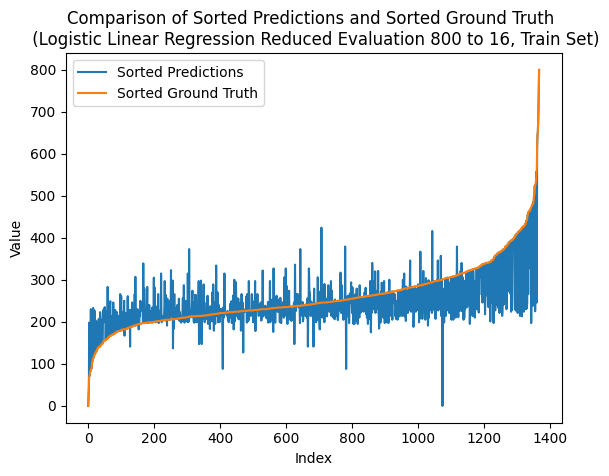

---- ---- ----
class_num = 816
Number of unique elements: 332
[  0.  51. 102. 153. 204. 255. 306. 357. 408. 459. 510. 561. 612. 663.
 714. 765. 816.]
test eval:
Mean squared error: 1.7777777777777777
Correlation coefficient: 0.5507446832749942
Coefficient of determination (R-squared score, R2 score): 0.19937451133698203
train eval:
Mean squared error: 1.2171052631578947
Correlation coefficient: 0.7401210197857923
Coefficient of determination (R-squared score, R2 score): 0.5074261713420438


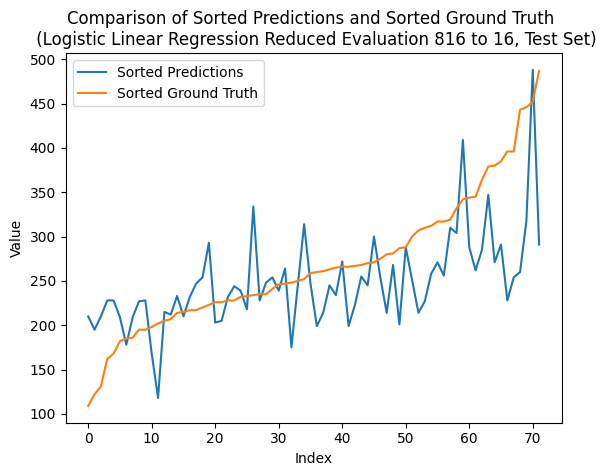

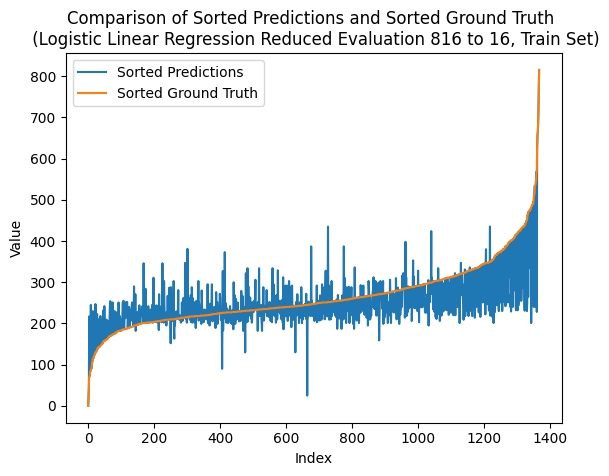

---- ---- ----
class_num = 832
Number of unique elements: 334
[  0.  52. 104. 156. 208. 260. 312. 364. 416. 468. 520. 572. 624. 676.
 728. 780. 832.]
test eval:
Mean squared error: 1.625
Correlation coefficient: 0.5912301691213336
Coefficient of determination (R-squared score, R2 score): 0.2681782642689601
train eval:
Mean squared error: 1.280701754385965
Correlation coefficient: 0.7265522966814091
Coefficient of determination (R-squared score, R2 score): 0.4816880793941506


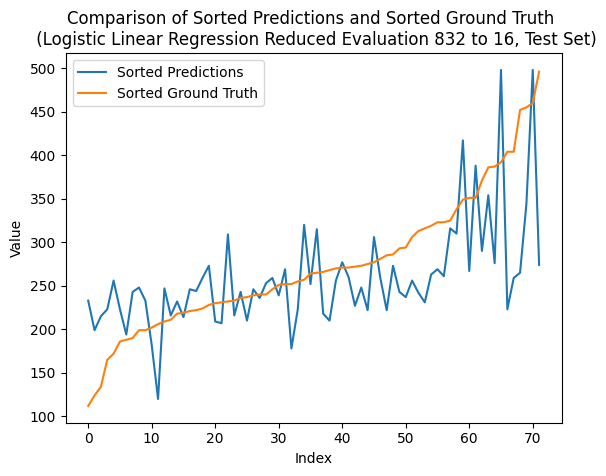

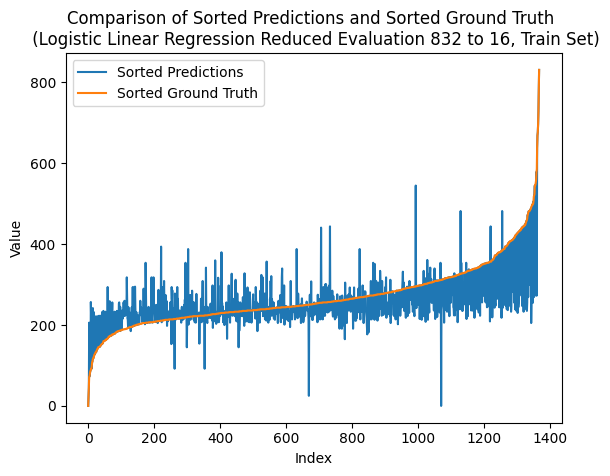

---- ---- ----
class_num = 848
Number of unique elements: 337
[  0.  53. 106. 159. 212. 265. 318. 371. 424. 477. 530. 583. 636. 689.
 742. 795. 848.]
test eval:
Mean squared error: 1.75
Correlation coefficient: 0.5631715239025781
Coefficient of determination (R-squared score, R2 score): 0.21188428459734165
train eval:
Mean squared error: 1.253654970760234
Correlation coefficient: 0.732431191225941
Coefficient of determination (R-squared score, R2 score): 0.4926341644754385


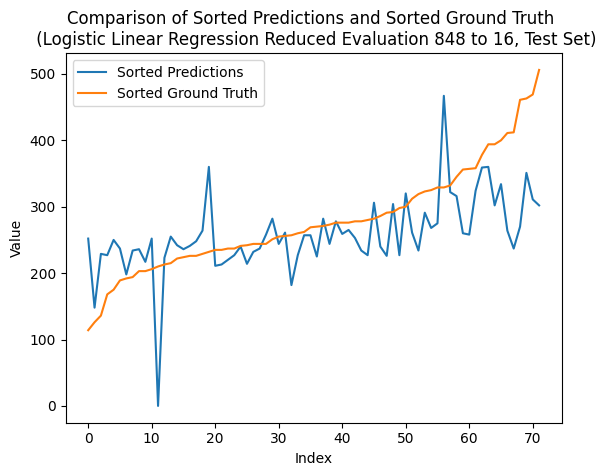

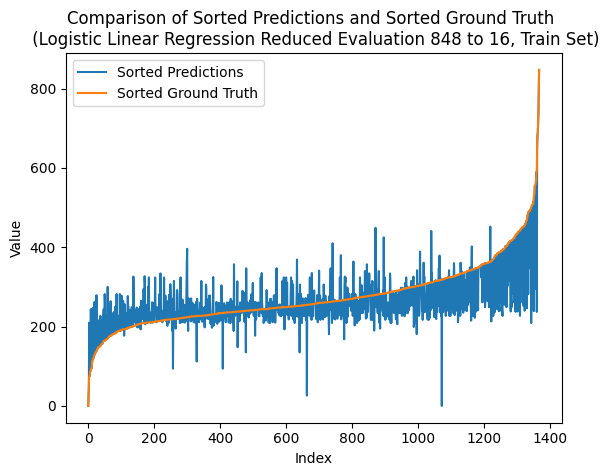

---- ---- ----
class_num = 864
Number of unique elements: 343
[  0.  54. 108. 162. 216. 270. 324. 378. 432. 486. 540. 594. 648. 702.
 756. 810. 864.]
test eval:
Mean squared error: 1.5694444444444444
Correlation coefficient: 0.5896390409751046
Coefficient of determination (R-squared score, R2 score): 0.29319781078967944
train eval:
Mean squared error: 1.1907894736842106
Correlation coefficient: 0.7432072656572639
Coefficient of determination (R-squared score, R2 score): 0.5180764162859997


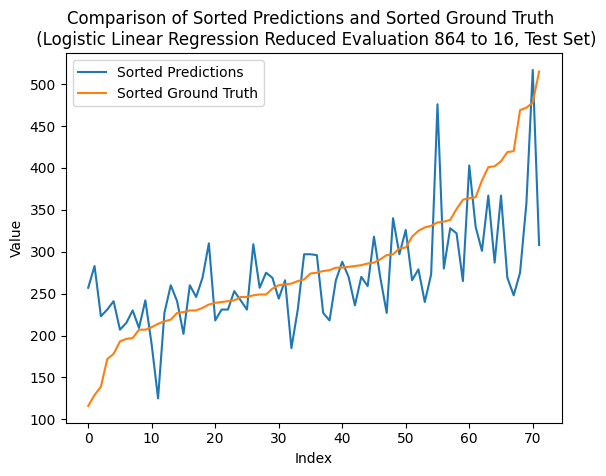

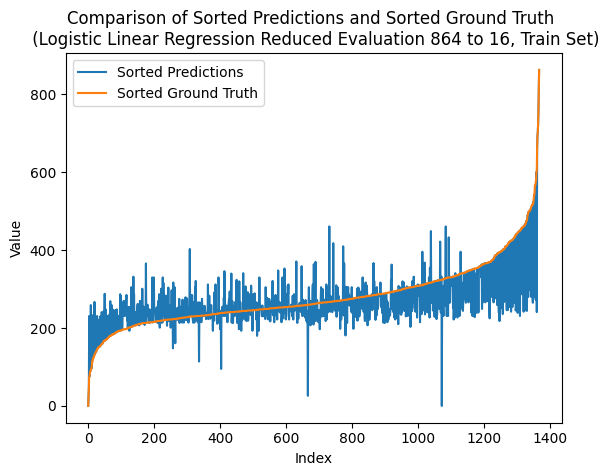

---- ---- ----
class_num = 880
Number of unique elements: 347
[  0.  55. 110. 165. 220. 275. 330. 385. 440. 495. 550. 605. 660. 715.
 770. 825. 880.]
test eval:
Mean squared error: 1.7083333333333333
Correlation coefficient: 0.5238874410839923
Coefficient of determination (R-squared score, R2 score): 0.2306489444878812
train eval:
Mean squared error: 1.2448830409356726
Correlation coefficient: 0.7301356520404361
Coefficient of determination (R-squared score, R2 score): 0.4961842461234237


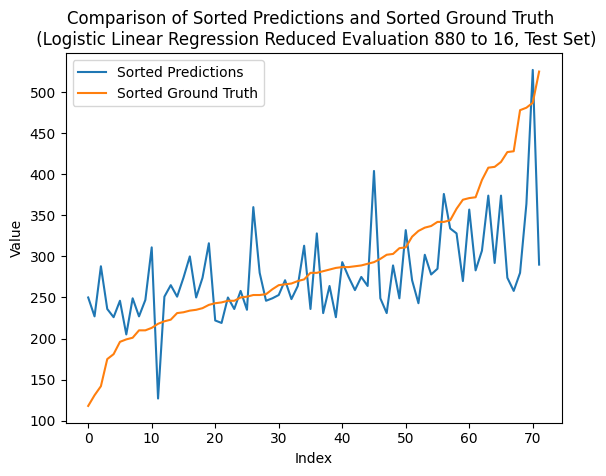

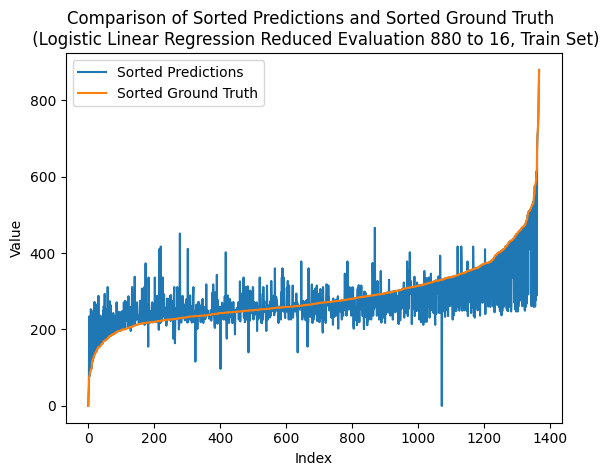

---- ---- ----
class_num = 896
Number of unique elements: 355
[  0.  56. 112. 168. 224. 280. 336. 392. 448. 504. 560. 616. 672. 728.
 784. 840. 896.]
test eval:
Mean squared error: 1.9583333333333333
Correlation coefficient: 0.5461353683320944
Coefficient of determination (R-squared score, R2 score): 0.11806098514464425
train eval:
Mean squared error: 1.1776315789473684
Correlation coefficient: 0.7471704259100531
Coefficient of determination (R-squared score, R2 score): 0.5234015387579776


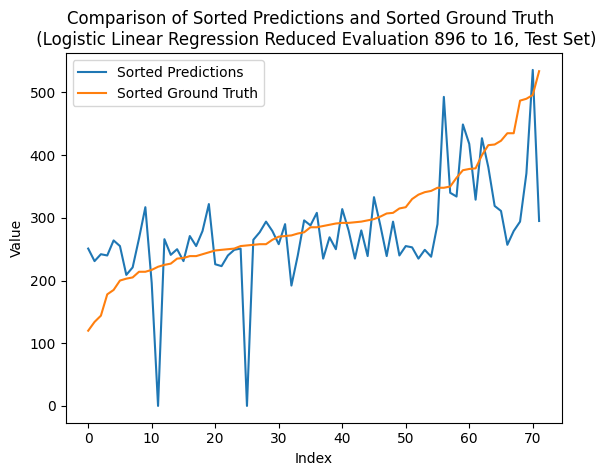

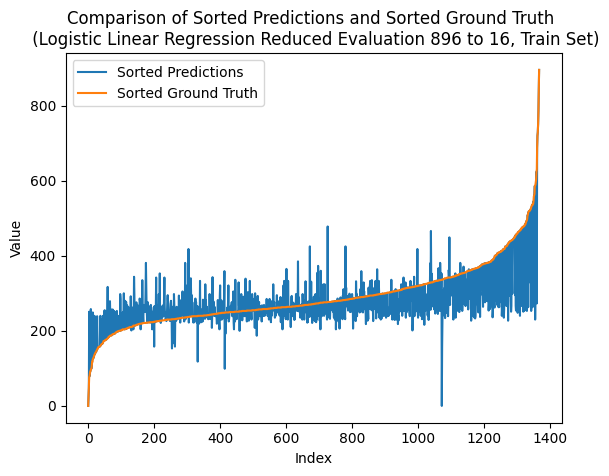

---- ---- ----
class_num = 912
Number of unique elements: 355
[  0.  57. 114. 171. 228. 285. 342. 399. 456. 513. 570. 627. 684. 741.
 798. 855. 912.]
test eval:
Mean squared error: 1.9861111111111112
Correlation coefficient: 0.5121155542700909
Coefficient of determination (R-squared score, R2 score): 0.10555121188428462
train eval:
Mean squared error: 1.1988304093567252
Correlation coefficient: 0.7427922108914937
Coefficient of determination (R-squared score, R2 score): 0.5148221747753464


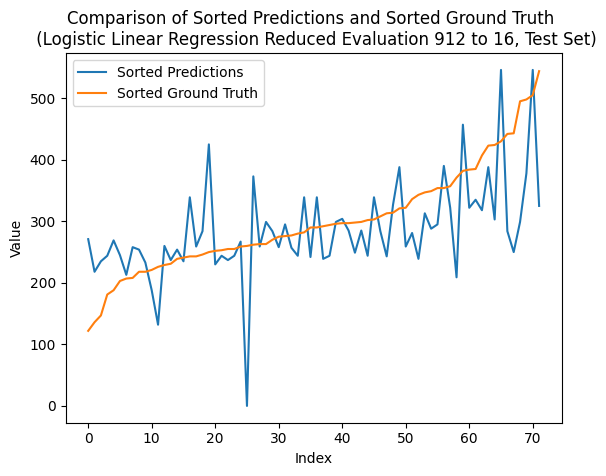

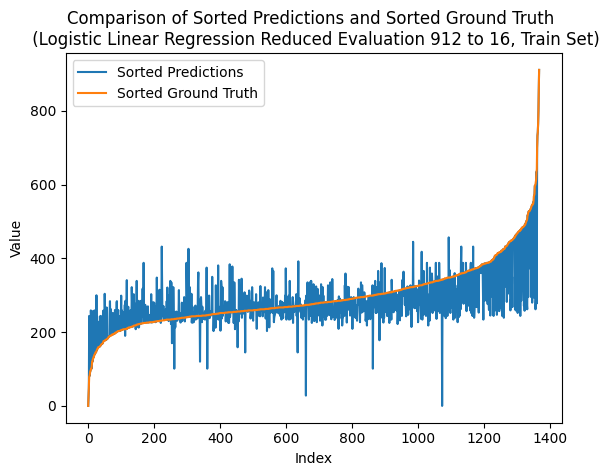

---- ---- ----
class_num = 928
Number of unique elements: 363
[  0.  58. 116. 174. 232. 290. 348. 406. 464. 522. 580. 638. 696. 754.
 812. 870. 928.]
test eval:
Mean squared error: 1.9722222222222223
Correlation coefficient: 0.4576065263250449
Coefficient of determination (R-squared score, R2 score): 0.11180609851446444
train eval:
Mean squared error: 1.1505847953216375
Correlation coefficient: 0.7541712638304823
Coefficient of determination (R-squared score, R2 score): 0.5343476238392655


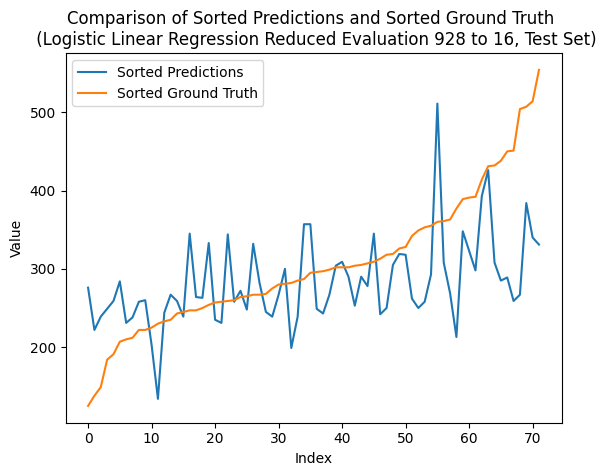

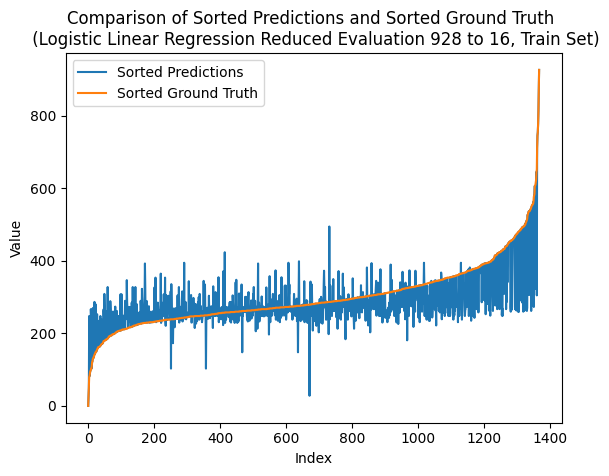

---- ---- ----
class_num = 944
Number of unique elements: 364
[  0.  59. 118. 177. 236. 295. 354. 413. 472. 531. 590. 649. 708. 767.
 826. 885. 944.]
test eval:
Mean squared error: 2.125
Correlation coefficient: 0.4906627364923384
Coefficient of determination (R-squared score, R2 score): 0.04300234558248628
train eval:
Mean squared error: 1.2361111111111112
Correlation coefficient: 0.7352946580155483
Coefficient of determination (R-squared score, R2 score): 0.499734327771409


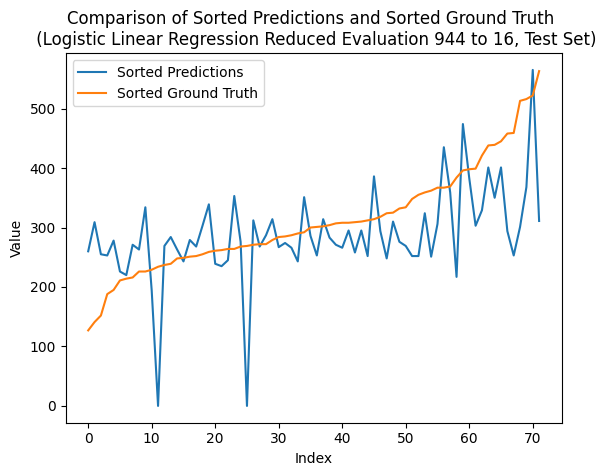

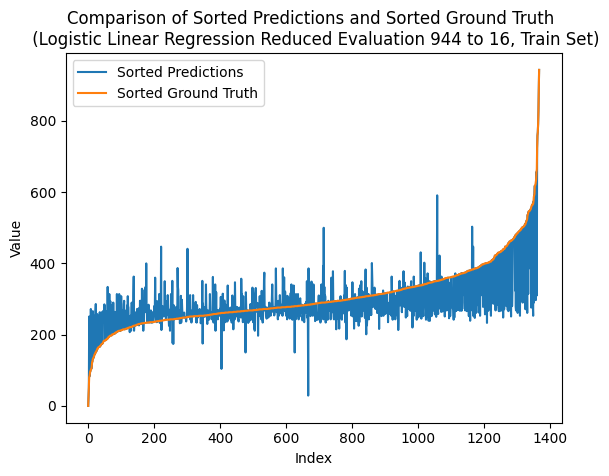

---- ---- ----
class_num = 960
Number of unique elements: 363
[  0.  60. 120. 180. 240. 300. 360. 420. 480. 540. 600. 660. 720. 780.
 840. 900. 960.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.5457061044764493
Coefficient of determination (R-squared score, R2 score): 0.1430805316653636
train eval:
Mean squared error: 1.155701754385965
Correlation coefficient: 0.7504168491544679
Coefficient of determination (R-squared score, R2 score): 0.5322767428779407


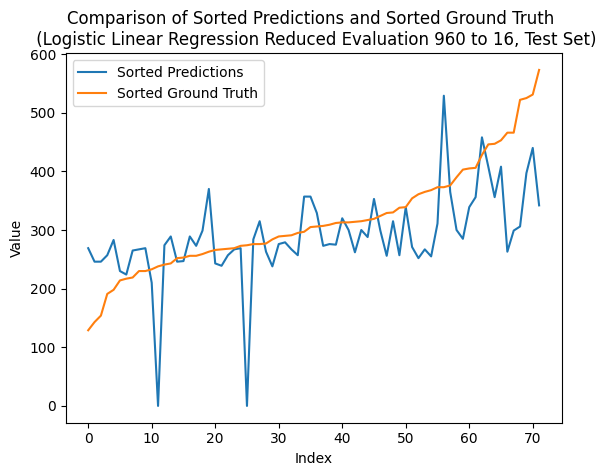

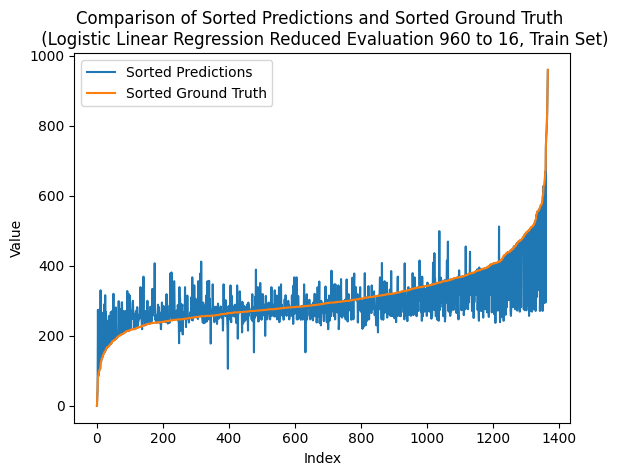

---- ---- ----
class_num = 976
Number of unique elements: 372
[  0.  61. 122. 183. 244. 305. 366. 427. 488. 549. 610. 671. 732. 793.
 854. 915. 976.]
test eval:
Mean squared error: 2.1527777777777777
Correlation coefficient: 0.4554586462380864
Coefficient of determination (R-squared score, R2 score): 0.030492572322126654
train eval:
Mean squared error: 1.1966374269005848
Correlation coefficient: 0.7419774769103924
Coefficient of determination (R-squared score, R2 score): 0.5157096951873428


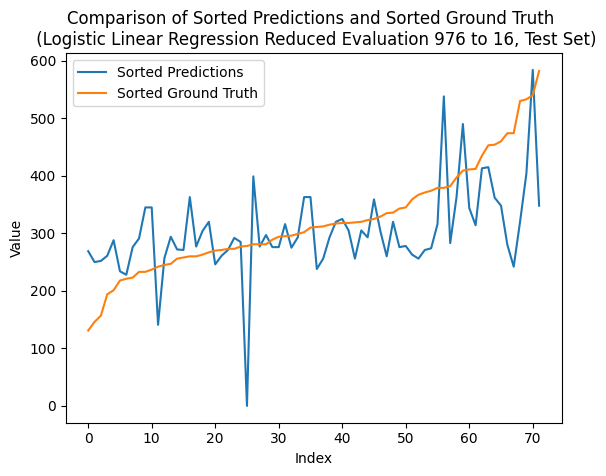

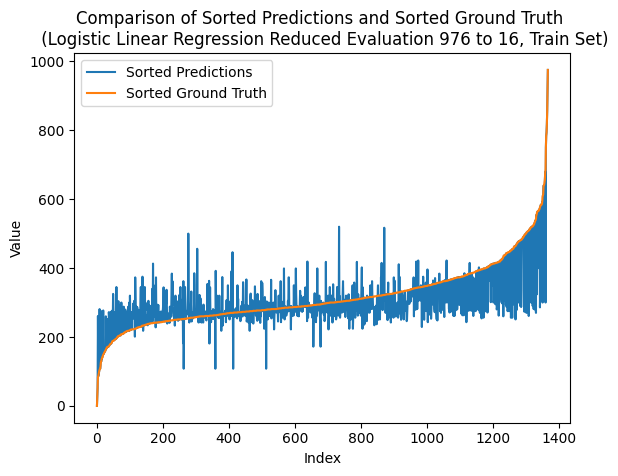

---- ---- ----
class_num = 992
Number of unique elements: 378
[  0.  62. 124. 186. 248. 310. 372. 434. 496. 558. 620. 682. 744. 806.
 868. 930. 992.]
test eval:
Mean squared error: 2.2777777777777777
Correlation coefficient: 0.4159191143914347
Coefficient of determination (R-squared score, R2 score): -0.02580140734949188
train eval:
Mean squared error: 1.1944444444444444
Correlation coefficient: 0.7453328822482349
Coefficient of determination (R-squared score, R2 score): 0.516597215599339


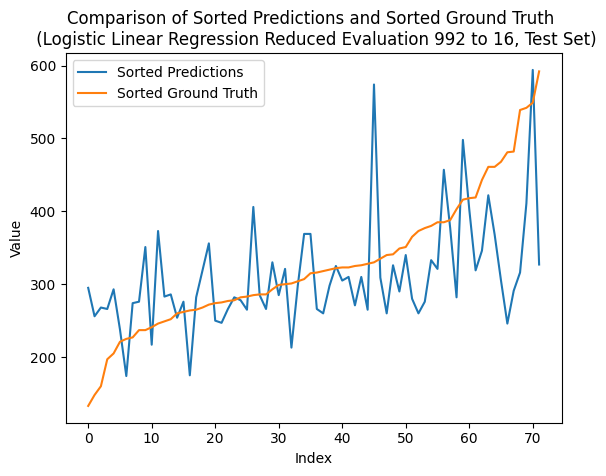

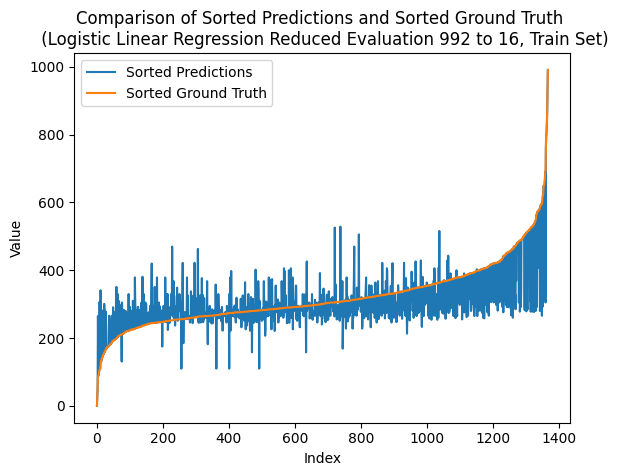

---- ---- ----
class_num = 1008
Number of unique elements: 376
[   0.   63.  126.  189.  252.  315.  378.  441.  504.  567.  630.  693.
  756.  819.  882.  945. 1008.]
test eval:
Mean squared error: 2.138888888888889
Correlation coefficient: 0.4668479855414059
Coefficient of determination (R-squared score, R2 score): 0.036747458952306467
train eval:
Mean squared error: 1.135233918128655
Correlation coefficient: 0.7538034522814625
Coefficient of determination (R-squared score, R2 score): 0.5405602667232396


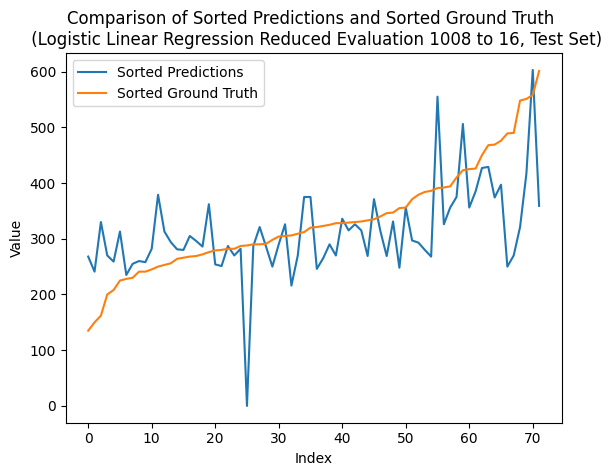

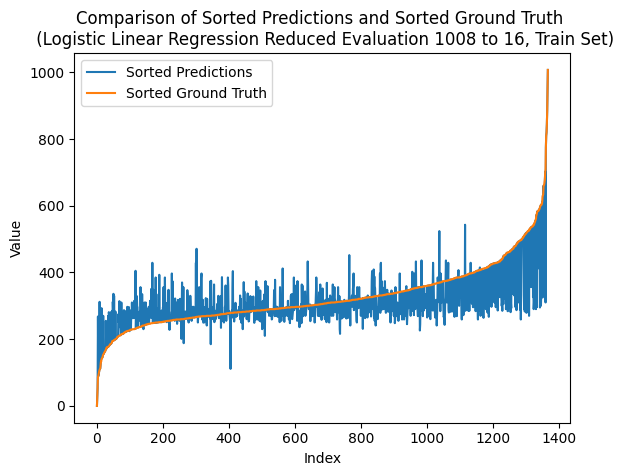

---- ---- ----
class_num = 1024
Number of unique elements: 380
[   0.   64.  128.  192.  256.  320.  384.  448.  512.  576.  640.  704.
  768.  832.  896.  960. 1024.]
test eval:
Mean squared error: 2.2083333333333335
Correlation coefficient: 0.46824962175866347
Coefficient of determination (R-squared score, R2 score): 0.005473025801407294
train eval:
Mean squared error: 1.135233918128655
Correlation coefficient: 0.7549627972944217
Coefficient of determination (R-squared score, R2 score): 0.5405602667232396


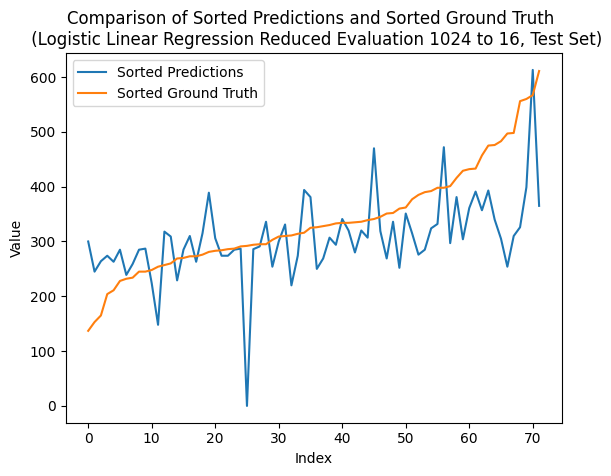

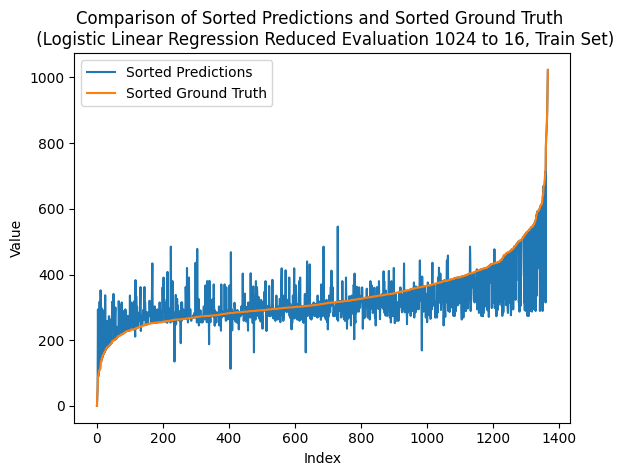

---- ---- ----
class_num = 1040
Number of unique elements: 385
[   0.   65.  130.  195.  260.  325.  390.  455.  520.  585.  650.  715.
  780.  845.  910.  975. 1040.]
test eval:
Mean squared error: 2.0555555555555554
Correlation coefficient: 0.45125988315140564
Coefficient of determination (R-squared score, R2 score): 0.07427677873338545
train eval:
Mean squared error: 1.189327485380117
Correlation coefficient: 0.7468659578758385
Coefficient of determination (R-squared score, R2 score): 0.5186680965606638


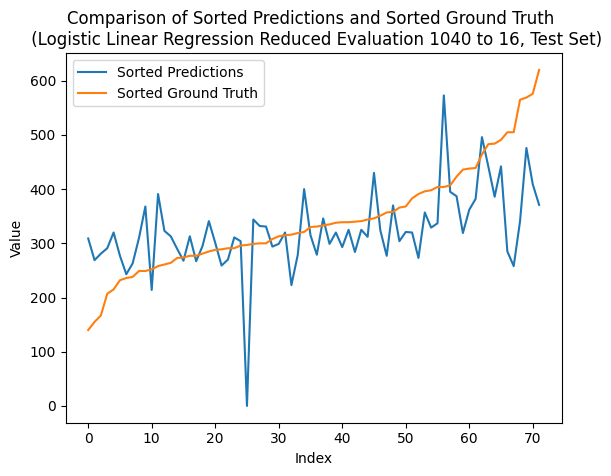

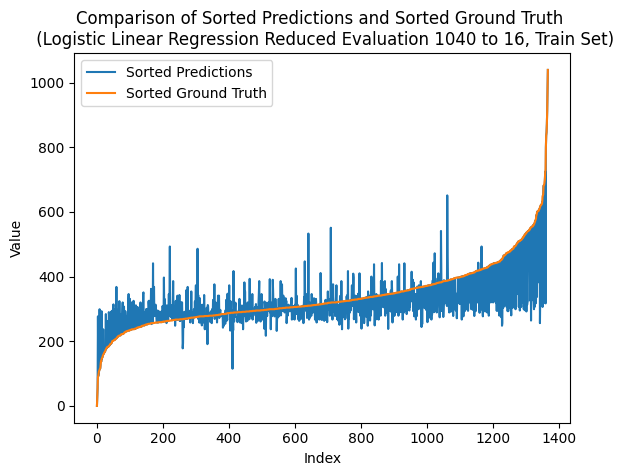

---- ---- ----
class_num = 1056
Number of unique elements: 391
[   0.   66.  132.  198.  264.  330.  396.  462.  528.  594.  660.  726.
  792.  858.  924.  990. 1056.]
test eval:
Mean squared error: 1.8472222222222223
Correlation coefficient: 0.5130781048269216
Coefficient of determination (R-squared score, R2 score): 0.16810007818608286
train eval:
Mean squared error: 1.266812865497076
Correlation coefficient: 0.7281259918076318
Coefficient of determination (R-squared score, R2 score): 0.4873090420034606


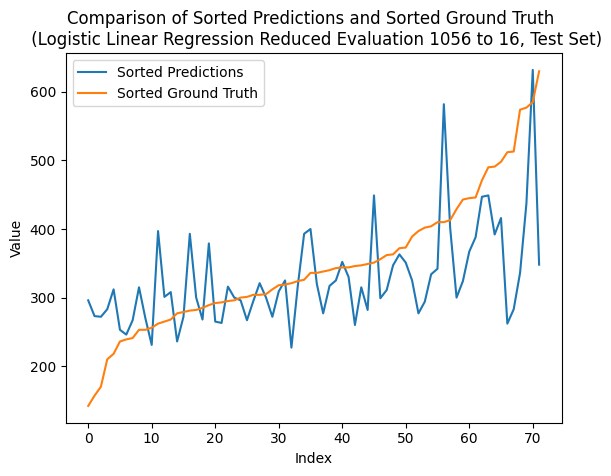

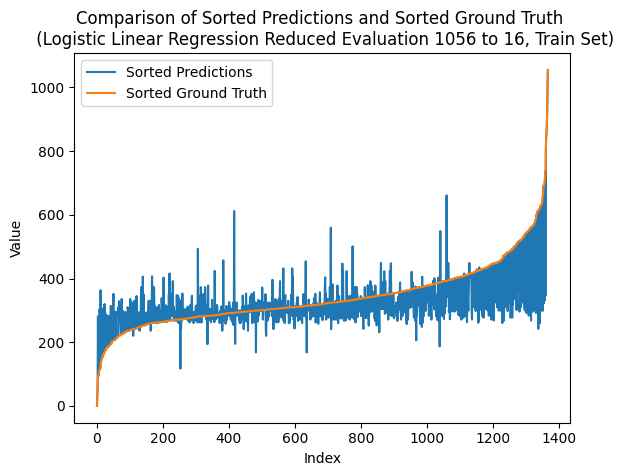

---- ---- ----
class_num = 1072
Number of unique elements: 394
[   0.   67.  134.  201.  268.  335.  402.  469.  536.  603.  670.  737.
  804.  871.  938. 1005. 1072.]
test eval:
Mean squared error: 2.125
Correlation coefficient: 0.4885776553817262
Coefficient of determination (R-squared score, R2 score): 0.04300234558248628
train eval:
Mean squared error: 1.1578947368421053
Correlation coefficient: 0.7528736514201982
Coefficient of determination (R-squared score, R2 score): 0.5313892224659443


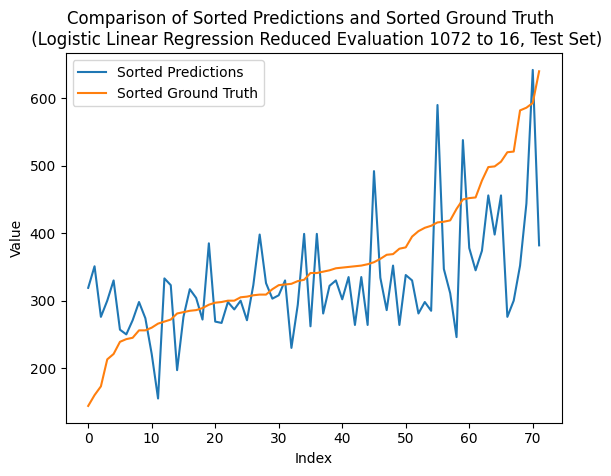

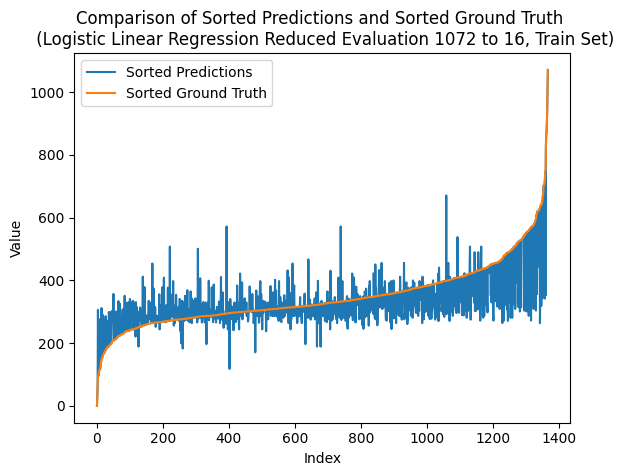

---- ---- ----
class_num = 1088
Number of unique elements: 395
[   0.   68.  136.  204.  272.  340.  408.  476.  544.  612.  680.  748.
  816.  884.  952. 1020. 1088.]
test eval:
Mean squared error: 2.0
Correlation coefficient: 0.4969166232808309
Coefficient of determination (R-squared score, R2 score): 0.09929632525410481
train eval:
Mean squared error: 1.1761695906432748
Correlation coefficient: 0.7479355139522919
Coefficient of determination (R-squared score, R2 score): 0.5239932190326417


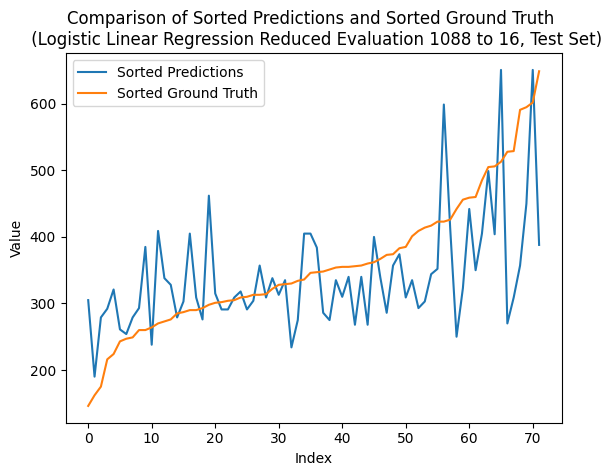

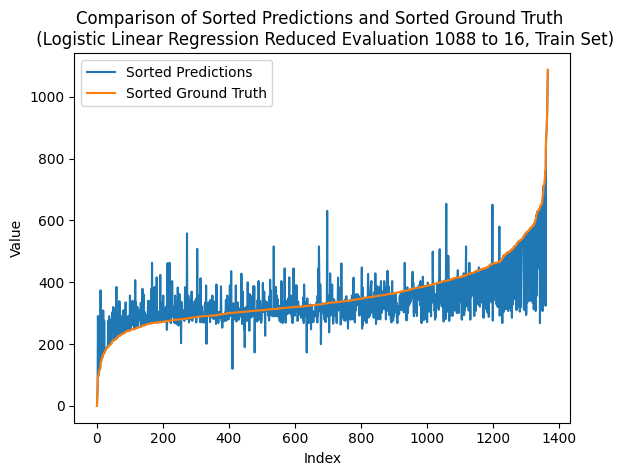

---- ---- ----
class_num = 1104
Number of unique elements: 406
[   0.   69.  138.  207.  276.  345.  414.  483.  552.  621.  690.  759.
  828.  897.  966. 1035. 1104.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.4736159663367158
Coefficient of determination (R-squared score, R2 score): 0.1430805316653636
train eval:
Mean squared error: 1.1564327485380117
Correlation coefficient: 0.7512817747119447
Coefficient of determination (R-squared score, R2 score): 0.5319809027406086


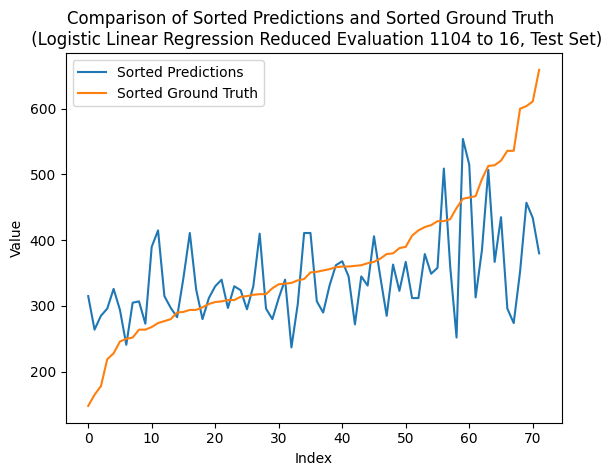

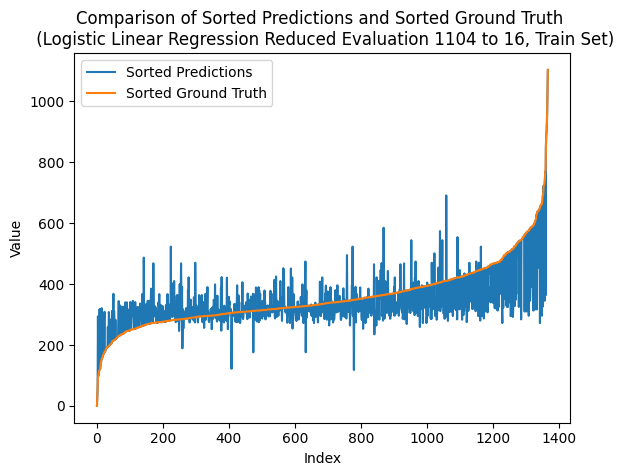

---- ---- ----
class_num = 1120
Number of unique elements: 410
[   0.   70.  140.  210.  280.  350.  420.  490.  560.  630.  700.  770.
  840.  910.  980. 1050. 1120.]
test eval:
Mean squared error: 2.0
Correlation coefficient: 0.503818005341409
Coefficient of determination (R-squared score, R2 score): 0.09929632525410481
train eval:
Mean squared error: 1.1469298245614035
Correlation coefficient: 0.7558114111256459
Coefficient of determination (R-squared score, R2 score): 0.5358268245259259


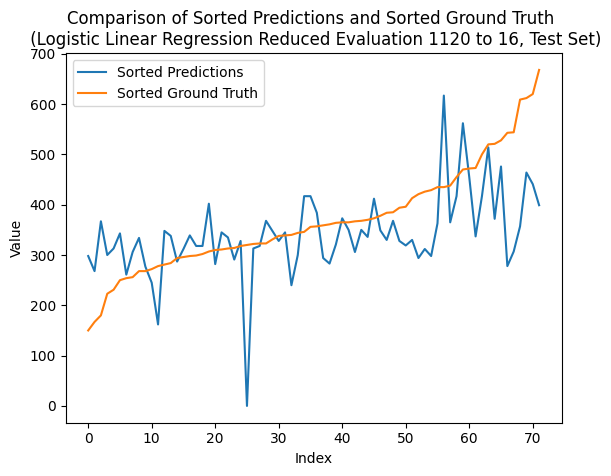

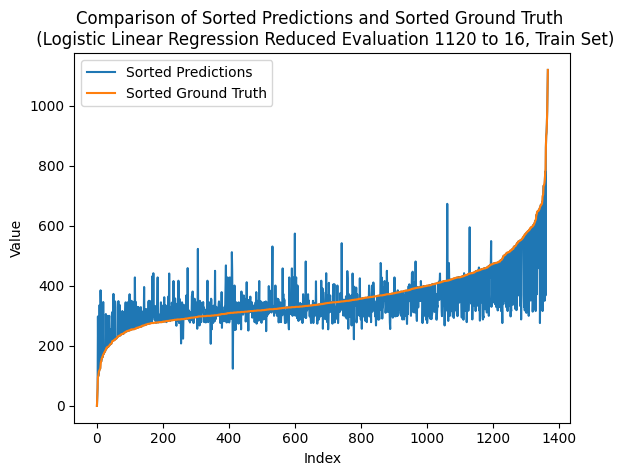

---- ---- ----
class_num = 1136
Number of unique elements: 405
[   0.   71.  142.  213.  284.  355.  426.  497.  568.  639.  710.  781.
  852.  923.  994. 1065. 1136.]
test eval:
Mean squared error: 2.3194444444444446
Correlation coefficient: 0.43985754513025477
Coefficient of determination (R-squared score, R2 score): -0.044566067240031204
train eval:
Mean squared error: 1.08406432748538
Correlation coefficient: 0.7685058019687545
Coefficient of determination (R-squared score, R2 score): 0.561269076336487


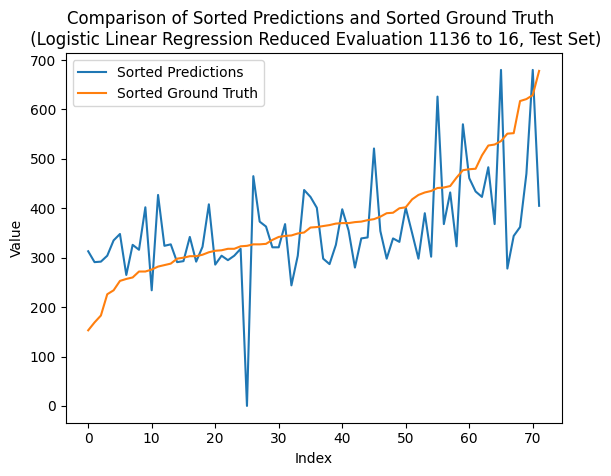

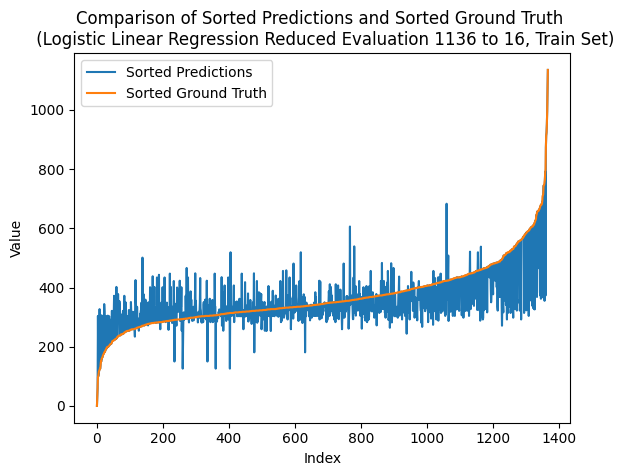

---- ---- ----
class_num = 1152
Number of unique elements: 416
[   0.   72.  144.  216.  288.  360.  432.  504.  576.  648.  720.  792.
  864.  936. 1008. 1080. 1152.]
test eval:
Mean squared error: 2.111111111111111
Correlation coefficient: 0.40565136701847715
Coefficient of determination (R-squared score, R2 score): 0.04925723221266609
train eval:
Mean squared error: 1.1111111111111112
Correlation coefficient: 0.7628608538508173
Coefficient of determination (R-squared score, R2 score): 0.5503229912551991


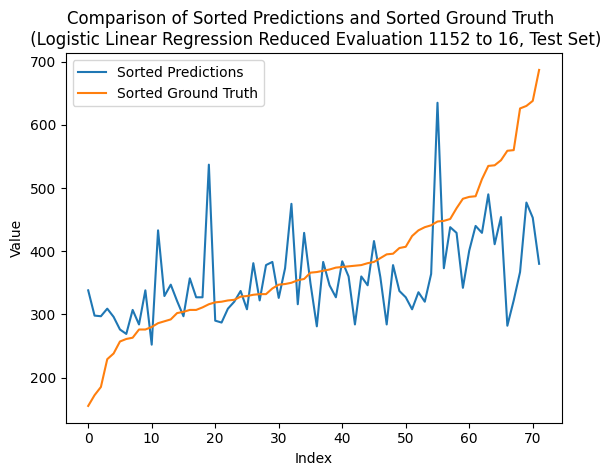

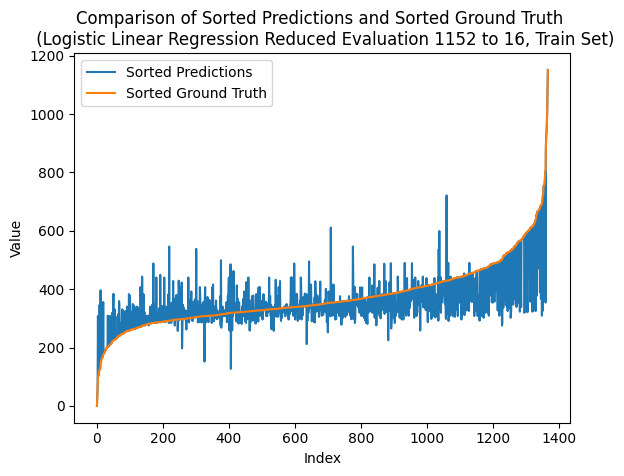

---- ---- ----
class_num = 1168
Number of unique elements: 412
[   0.   73.  146.  219.  292.  365.  438.  511.  584.  657.  730.  803.
  876.  949. 1022. 1095. 1168.]
test eval:
Mean squared error: 1.9861111111111112
Correlation coefficient: 0.5158284806947144
Coefficient of determination (R-squared score, R2 score): 0.10555121188428462
train eval:
Mean squared error: 1.1798245614035088
Correlation coefficient: 0.7480937566638783
Coefficient of determination (R-squared score, R2 score): 0.5225140183459811


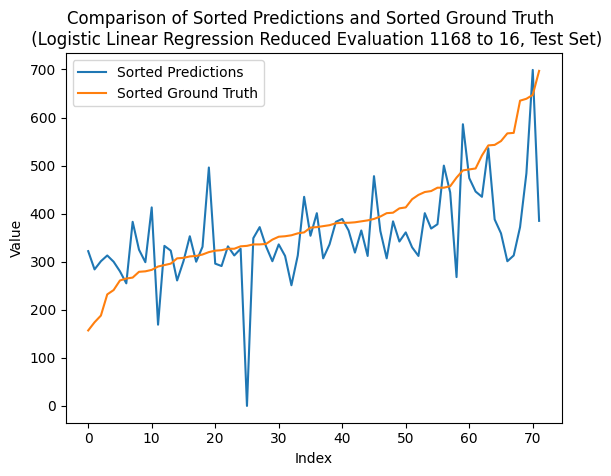

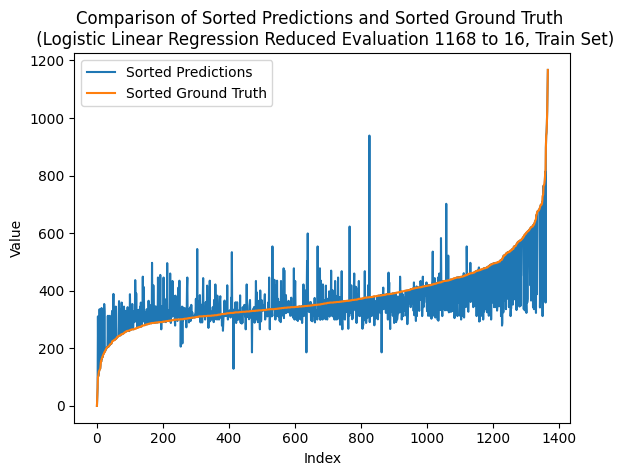

---- ---- ----
class_num = 1184
Number of unique elements: 419
[   0.   74.  148.  222.  296.  370.  444.  518.  592.  666.  740.  814.
  888.  962. 1036. 1110. 1184.]
test eval:
Mean squared error: 2.3333333333333335
Correlation coefficient: 0.40640906836800295
Coefficient of determination (R-squared score, R2 score): -0.05082095387021113
train eval:
Mean squared error: 1.1425438596491229
Correlation coefficient: 0.7561894950102771
Coefficient of determination (R-squared score, R2 score): 0.5376018653499186


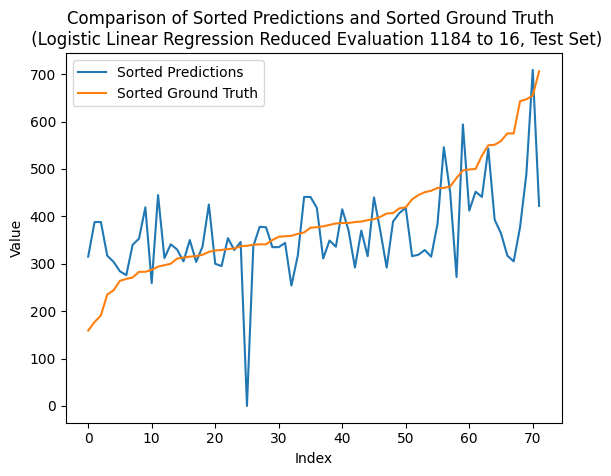

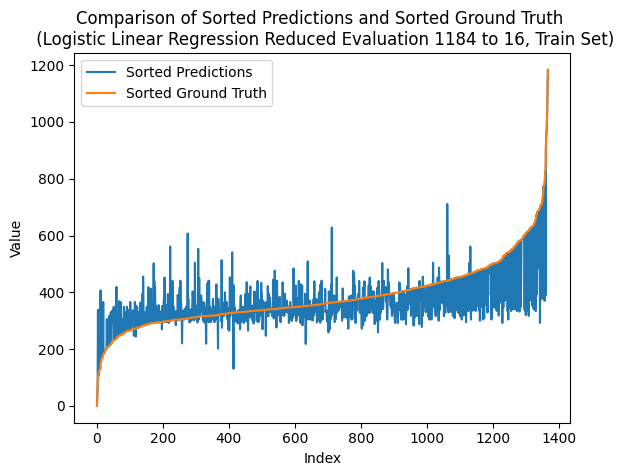

---- ---- ----
class_num = 1200
Number of unique elements: 421
[   0.   75.  150.  225.  300.  375.  450.  525.  600.  675.  750.  825.
  900.  975. 1050. 1125. 1200.]
test eval:
Mean squared error: 1.8611111111111112
Correlation coefficient: 0.4848982329915254
Coefficient of determination (R-squared score, R2 score): 0.16184519155590305
train eval:
Mean squared error: 1.1703216374269005
Correlation coefficient: 0.7507576000075372
Coefficient of determination (R-squared score, R2 score): 0.5263599401312986


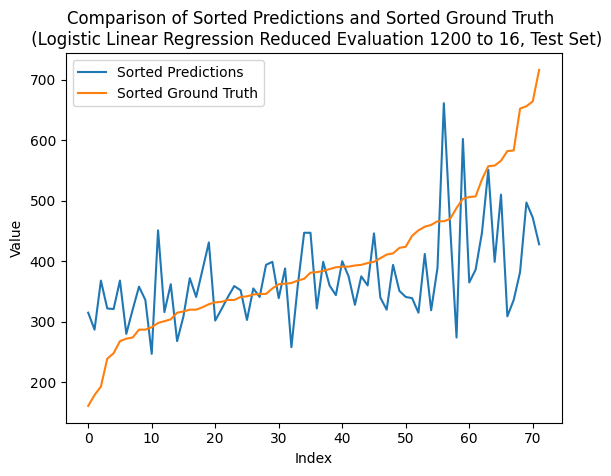

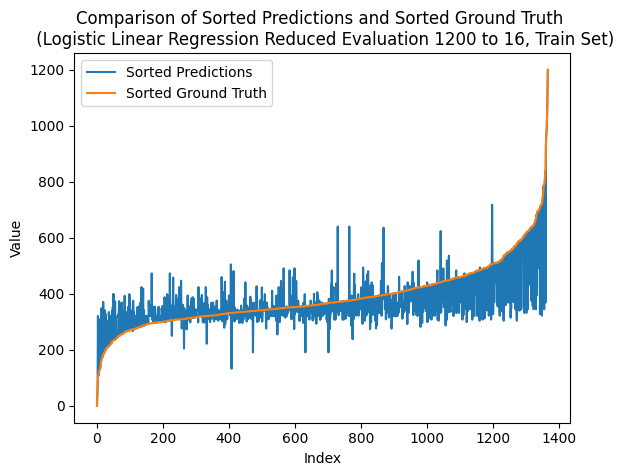

---- ---- ----
class_num = 1216
Number of unique elements: 424
[   0.   76.  152.  228.  304.  380.  456.  532.  608.  684.  760.  836.
  912.  988. 1064. 1140. 1216.]
test eval:
Mean squared error: 1.7361111111111112
Correlation coefficient: 0.5623389650349839
Coefficient of determination (R-squared score, R2 score): 0.21813917122752147
train eval:
Mean squared error: 1.1089181286549707
Correlation coefficient: 0.7652604833466888
Coefficient of determination (R-squared score, R2 score): 0.5512105116671955


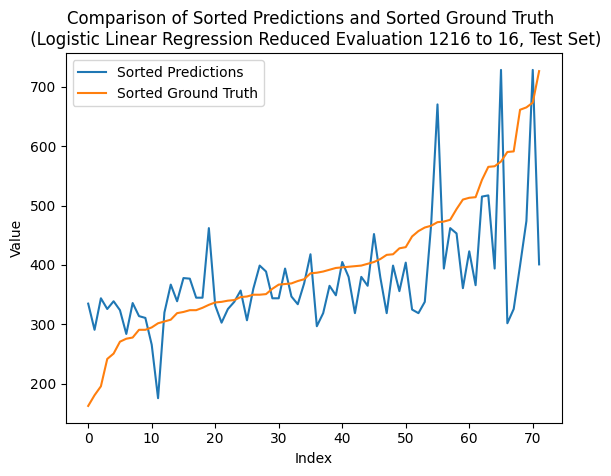

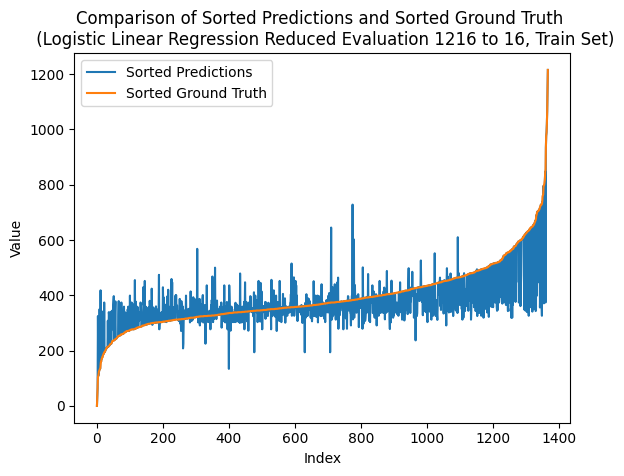

---- ---- ----
class_num = 1232
Number of unique elements: 429
[   0.   77.  154.  231.  308.  385.  462.  539.  616.  693.  770.  847.
  924. 1001. 1078. 1155. 1232.]
test eval:
Mean squared error: 2.0694444444444446
Correlation coefficient: 0.44619756845606207
Coefficient of determination (R-squared score, R2 score): 0.06802189210320564
train eval:
Mean squared error: 1.0716374269005848
Correlation coefficient: 0.7723676726827026
Coefficient of determination (R-squared score, R2 score): 0.5662983586711328


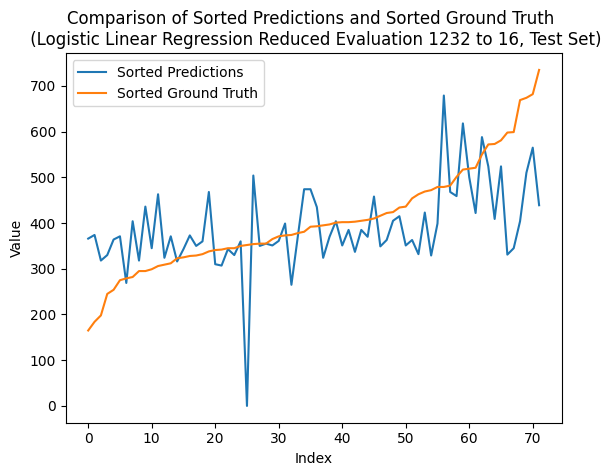

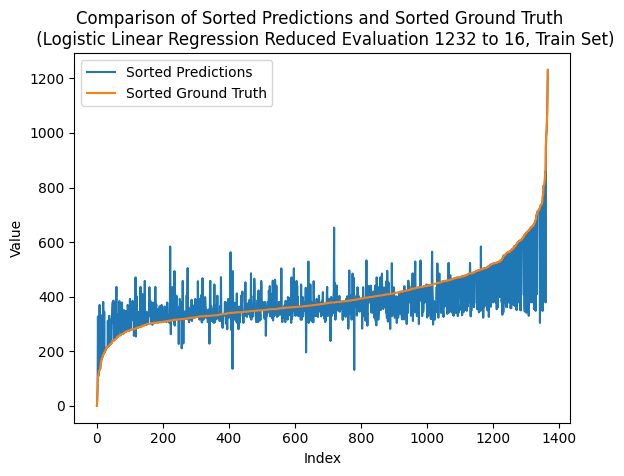

---- ---- ----
class_num = 1248
Number of unique elements: 435
[   0.   78.  156.  234.  312.  390.  468.  546.  624.  702.  780.  858.
  936. 1014. 1092. 1170. 1248.]
test eval:
Mean squared error: 1.9861111111111112
Correlation coefficient: 0.48316695216648764
Coefficient of determination (R-squared score, R2 score): 0.10555121188428462
train eval:
Mean squared error: 1.1176900584795322
Correlation coefficient: 0.7586424680288707
Coefficient of determination (R-squared score, R2 score): 0.5476604300192102


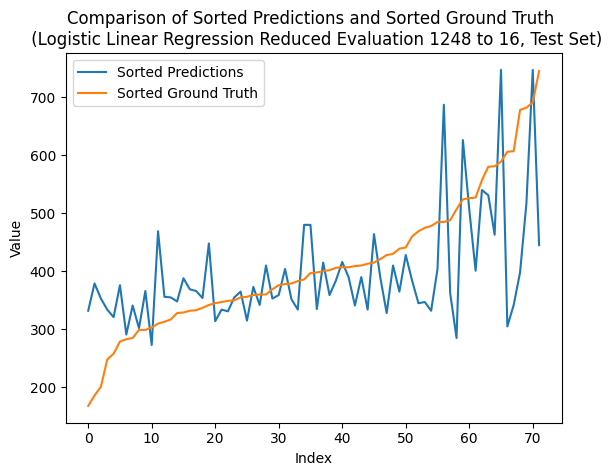

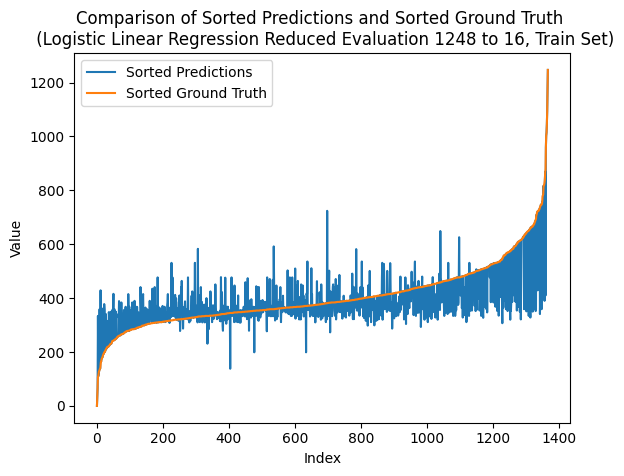

---- ---- ----
class_num = 1264
Number of unique elements: 437
[   0.   79.  158.  237.  316.  395.  474.  553.  632.  711.  790.  869.
  948. 1027. 1106. 1185. 1264.]
test eval:
Mean squared error: 1.8055555555555556
Correlation coefficient: 0.5172745428296153
Coefficient of determination (R-squared score, R2 score): 0.1868647380766224
train eval:
Mean squared error: 1.0964912280701755
Correlation coefficient: 0.7661660937760479
Coefficient of determination (R-squared score, R2 score): 0.5562397940018413


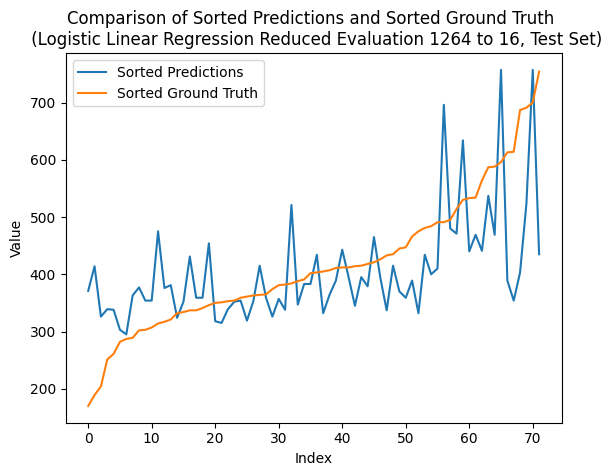

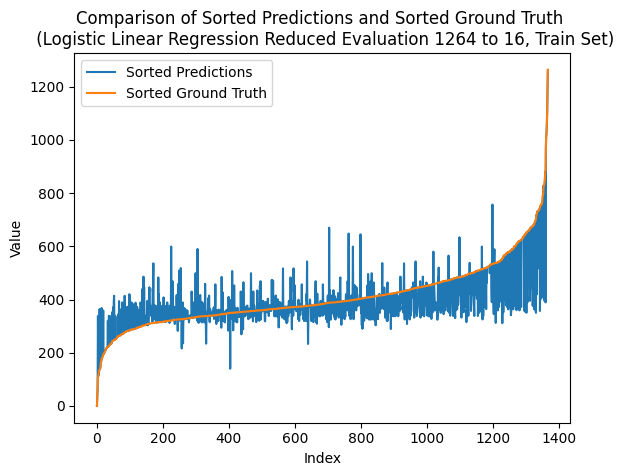

---- ---- ----
class_num = 1280
Number of unique elements: 434
[   0.   80.  160.  240.  320.  400.  480.  560.  640.  720.  800.  880.
  960. 1040. 1120. 1200. 1280.]
test eval:
Mean squared error: 1.8194444444444444
Correlation coefficient: 0.5267627485984017
Coefficient of determination (R-squared score, R2 score): 0.18060985144644248
train eval:
Mean squared error: 1.1271929824561404
Correlation coefficient: 0.7595370337490345
Coefficient of determination (R-squared score, R2 score): 0.5438145082338928


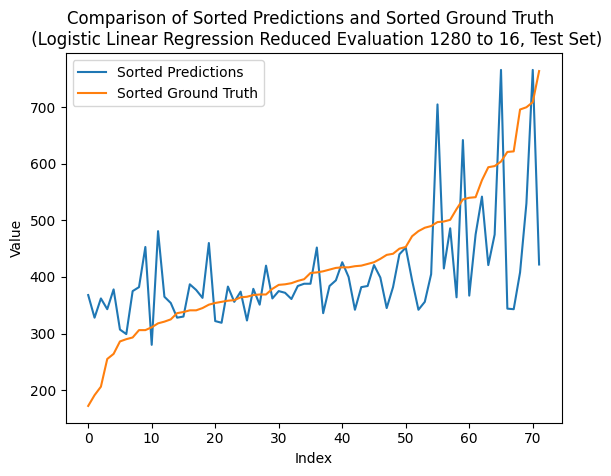

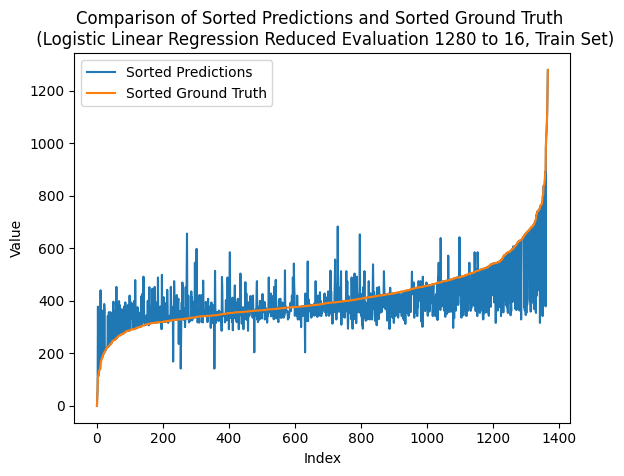

---- ---- ----
class_num = 1296
Number of unique elements: 444
[   0.   81.  162.  243.  324.  405.  486.  567.  648.  729.  810.  891.
  972. 1053. 1134. 1215. 1296.]
test eval:
Mean squared error: 2.0277777777777777
Correlation coefficient: 0.47990856870306964
Coefficient of determination (R-squared score, R2 score): 0.08678655199374508
train eval:
Mean squared error: 1.0533625730994152
Correlation coefficient: 0.7734722722244853
Coefficient of determination (R-squared score, R2 score): 0.5736943621044355


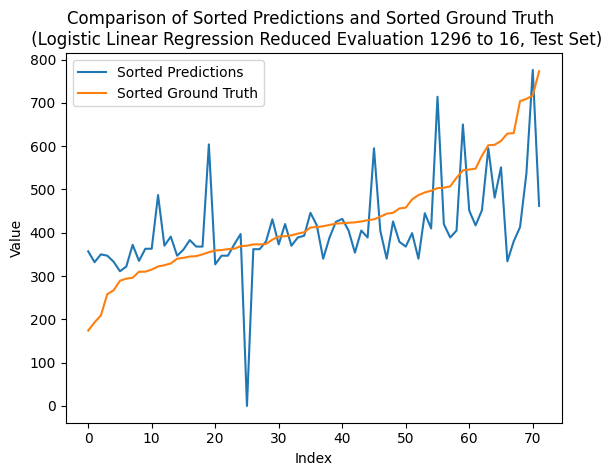

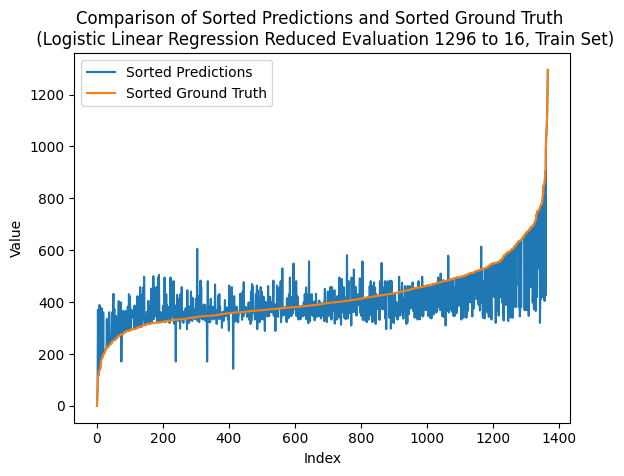

---- ---- ----
class_num = 1312
Number of unique elements: 448
[   0.   82.  164.  246.  328.  410.  492.  574.  656.  738.  820.  902.
  984. 1066. 1148. 1230. 1312.]
test eval:
Mean squared error: 1.9583333333333333
Correlation coefficient: 0.4924947717386248
Coefficient of determination (R-squared score, R2 score): 0.11806098514464425
train eval:
Mean squared error: 1.0862573099415205
Correlation coefficient: 0.7698524937794883
Coefficient of determination (R-squared score, R2 score): 0.5603815559244907


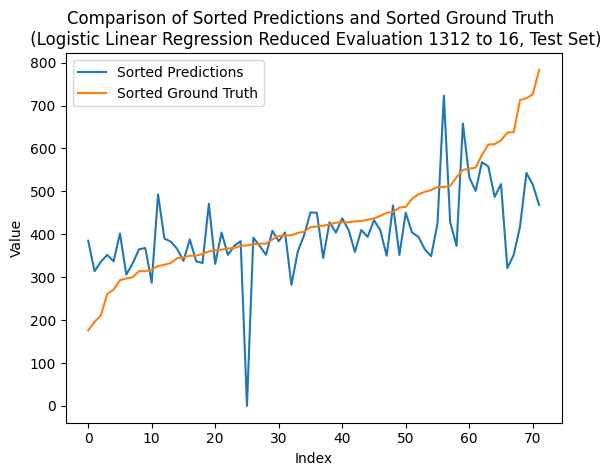

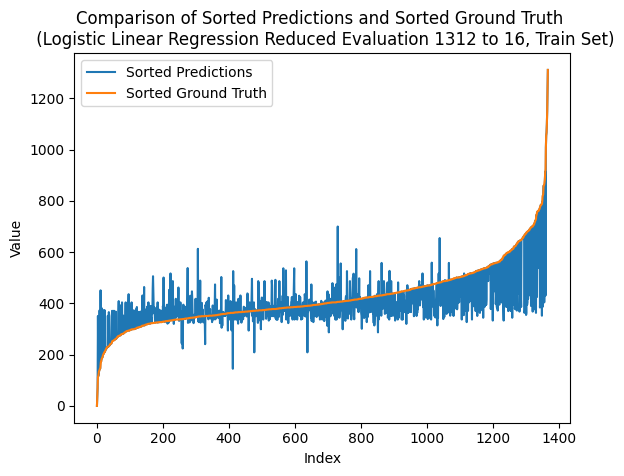

---- ---- ----
class_num = 1328
Number of unique elements: 444
[   0.   83.  166.  249.  332.  415.  498.  581.  664.  747.  830.  913.
  996. 1079. 1162. 1245. 1328.]
test eval:
Mean squared error: 1.9722222222222223
Correlation coefficient: 0.5062439960042644
Coefficient of determination (R-squared score, R2 score): 0.11180609851446444
train eval:
Mean squared error: 1.1388888888888888
Correlation coefficient: 0.7564454947309022
Coefficient of determination (R-squared score, R2 score): 0.5390810660365791


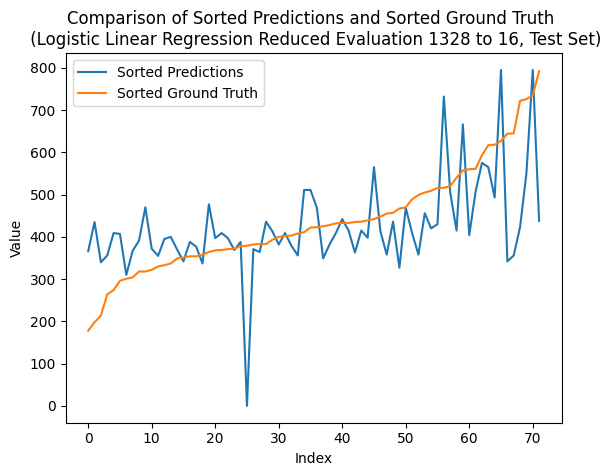

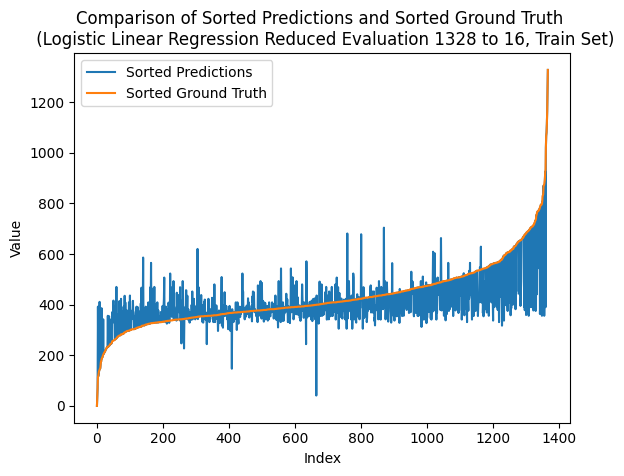

---- ---- ----
class_num = 1344
Number of unique elements: 449
[   0.   84.  168.  252.  336.  420.  504.  588.  672.  756.  840.  924.
 1008. 1092. 1176. 1260. 1344.]
test eval:
Mean squared error: 2.0555555555555554
Correlation coefficient: 0.47725559542926077
Coefficient of determination (R-squared score, R2 score): 0.07427677873338545
train eval:
Mean squared error: 1.121345029239766
Correlation coefficient: 0.760954259107545
Coefficient of determination (R-squared score, R2 score): 0.5461812293325496


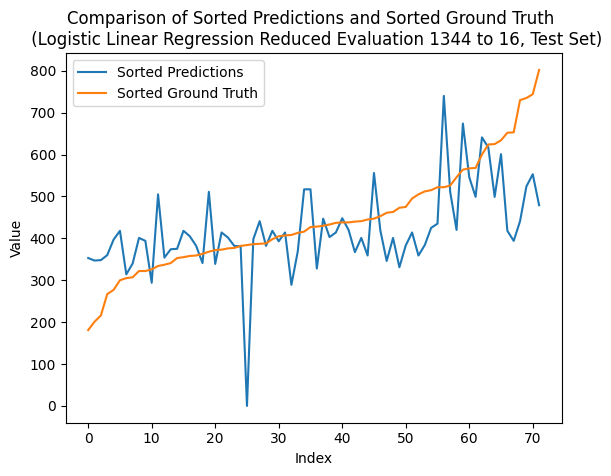

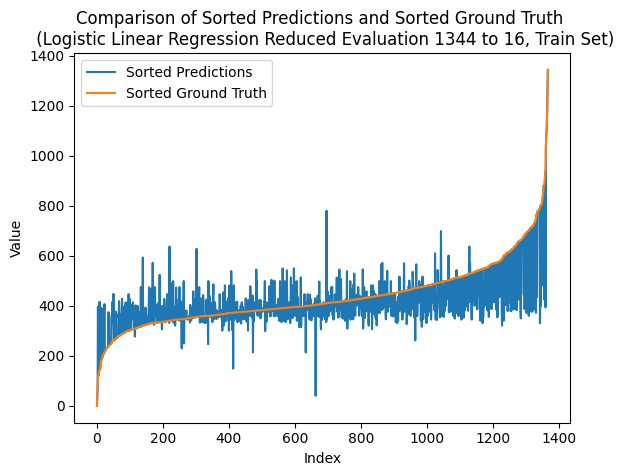

---- ---- ----
class_num = 1360
Number of unique elements: 451
[   0.   85.  170.  255.  340.  425.  510.  595.  680.  765.  850.  935.
 1020. 1105. 1190. 1275. 1360.]
test eval:
Mean squared error: 1.9027777777777777
Correlation coefficient: 0.52587540320356
Coefficient of determination (R-squared score, R2 score): 0.1430805316653636
train eval:
Mean squared error: 1.04093567251462
Correlation coefficient: 0.7772740742836265
Coefficient of determination (R-squared score, R2 score): 0.5787236444390813


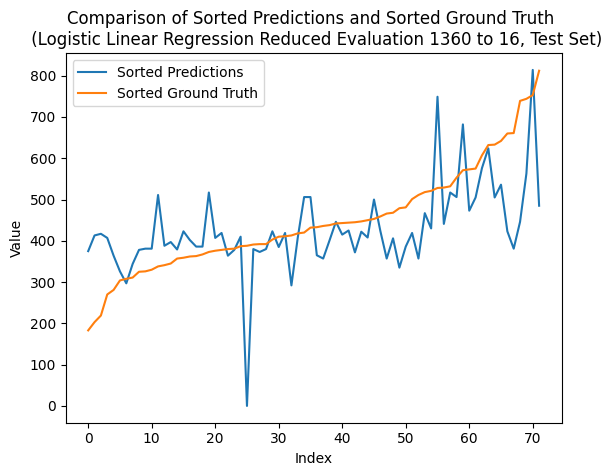

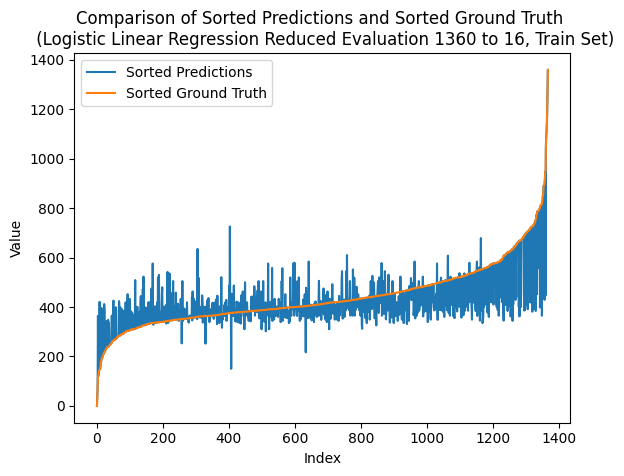

---- ---- ----
class_num = 1376
Number of unique elements: 458
[   0.   86.  172.  258.  344.  430.  516.  602.  688.  774.  860.  946.
 1032. 1118. 1204. 1290. 1376.]
test eval:
Mean squared error: 2.1944444444444446
Correlation coefficient: 0.44979610532069697
Coefficient of determination (R-squared score, R2 score): 0.011727912431587217
train eval:
Mean squared error: 1.128654970760234
Correlation coefficient: 0.7614995725818208
Coefficient of determination (R-squared score, R2 score): 0.5432228279592286


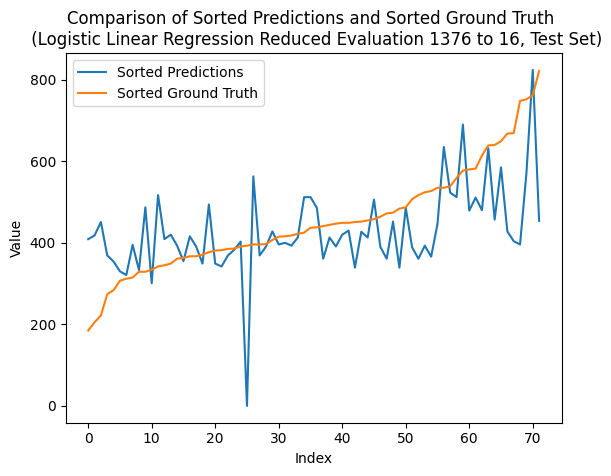

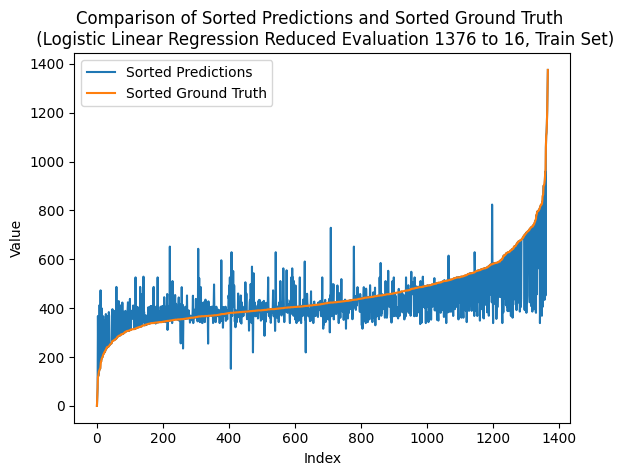

---- ---- ----
class_num = 1392
Number of unique elements: 464
[   0.   87.  174.  261.  348.  435.  522.  609.  696.  783.  870.  957.
 1044. 1131. 1218. 1305. 1392.]
test eval:
Mean squared error: 2.138888888888889
Correlation coefficient: 0.4266168011579253
Coefficient of determination (R-squared score, R2 score): 0.036747458952306467
train eval:
Mean squared error: 1.1279239766081872
Correlation coefficient: 0.758405944526864
Coefficient of determination (R-squared score, R2 score): 0.5435186680965607


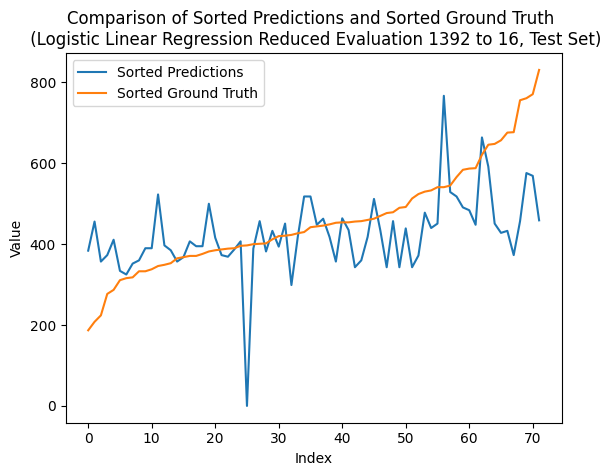

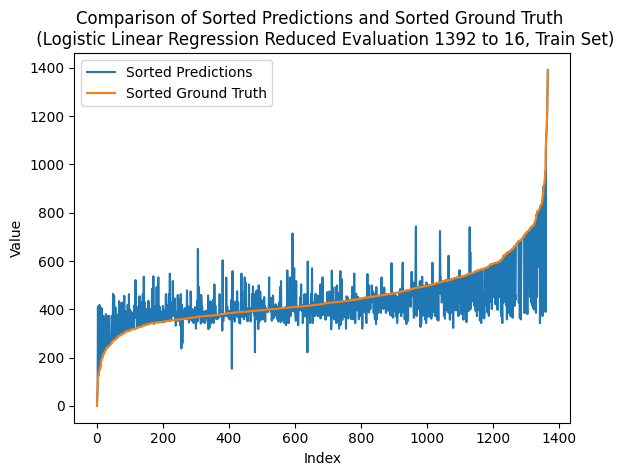

---- ---- ----
class_num = 1408
Number of unique elements: 472
[   0.   88.  176.  264.  352.  440.  528.  616.  704.  792.  880.  968.
 1056. 1144. 1232. 1320. 1408.]
test eval:
Mean squared error: 2.013888888888889
Correlation coefficient: 0.49391780108480127
Coefficient of determination (R-squared score, R2 score): 0.09304143862392489
train eval:
Mean squared error: 1.1169590643274854
Correlation coefficient: 0.7644547780853643
Coefficient of determination (R-squared score, R2 score): 0.5479562701565424


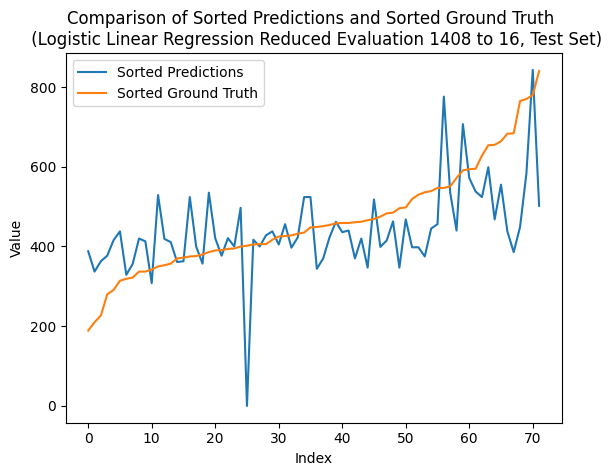

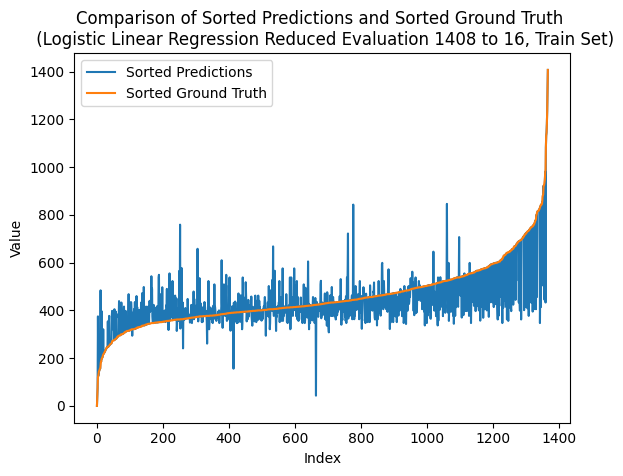

---- ---- ----
class_num = 1424
Number of unique elements: 467
[   0.   89.  178.  267.  356.  445.  534.  623.  712.  801.  890.  979.
 1068. 1157. 1246. 1335. 1424.]
test eval:
Mean squared error: 2.1944444444444446
Correlation coefficient: 0.40885651802212275
Coefficient of determination (R-squared score, R2 score): 0.011727912431587217
train eval:
Mean squared error: 1.097953216374269
Correlation coefficient: 0.7669376011912291
Coefficient of determination (R-squared score, R2 score): 0.555648113727177


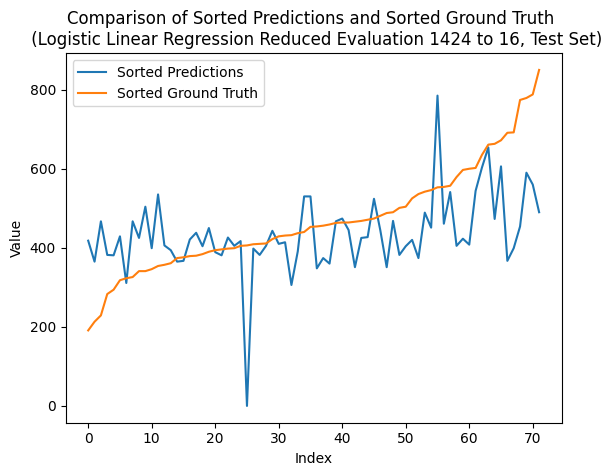

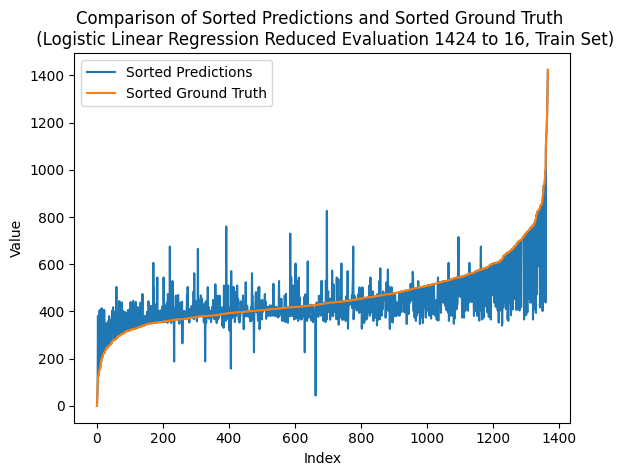

---- ---- ----
class_num = 1440
Number of unique elements: 474
[   0.   90.  180.  270.  360.  450.  540.  630.  720.  810.  900.  990.
 1080. 1170. 1260. 1350. 1440.]
test eval:
Mean squared error: 2.0555555555555554
Correlation coefficient: 0.5129581542720034
Coefficient of determination (R-squared score, R2 score): 0.07427677873338545
train eval:
Mean squared error: 1.054093567251462
Correlation coefficient: 0.777938370681754
Coefficient of determination (R-squared score, R2 score): 0.5733985219671034


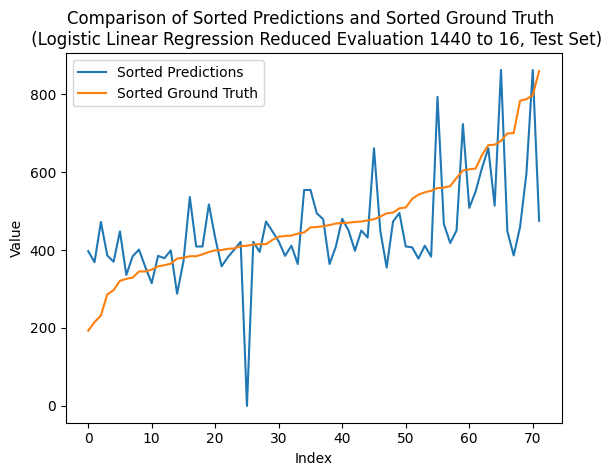

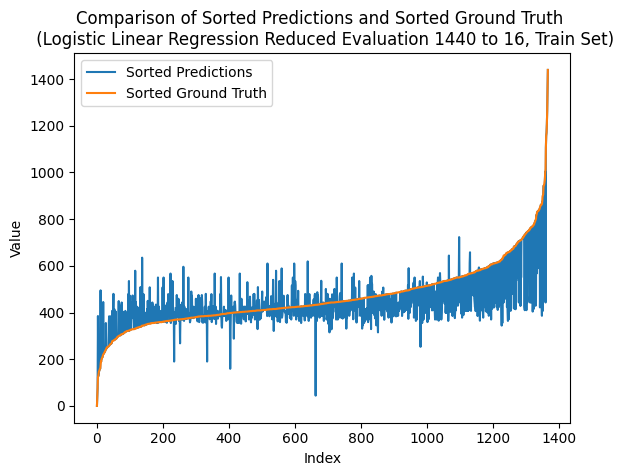

---- ---- ----
class_num = 1456
Number of unique elements: 475
[   0.   91.  182.  273.  364.  455.  546.  637.  728.  819.  910. 1001.
 1092. 1183. 1274. 1365. 1456.]
test eval:
Mean squared error: 2.1527777777777777
Correlation coefficient: 0.43893751881801385
Coefficient of determination (R-squared score, R2 score): 0.030492572322126654
train eval:
Mean squared error: 1.023391812865497
Correlation coefficient: 0.7823177608292132
Coefficient of determination (R-squared score, R2 score): 0.5858238077350518


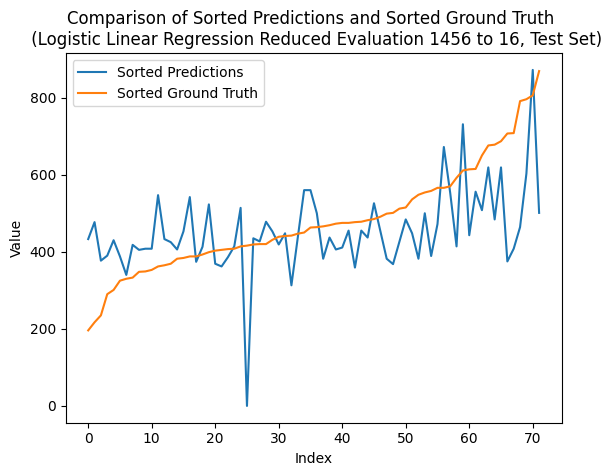

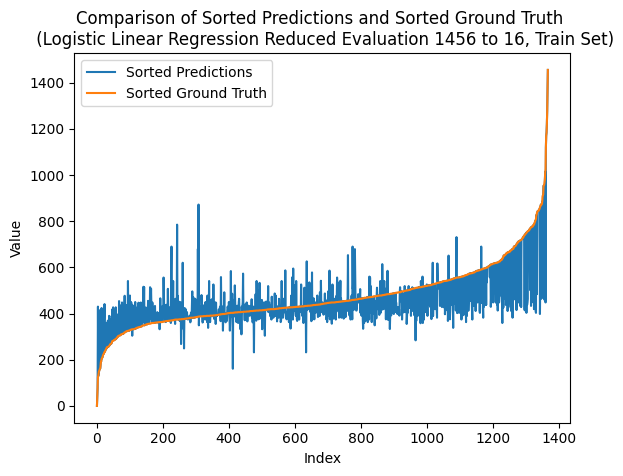

---- ---- ----
class_num = 1472
Number of unique elements: 478
[   0.   92.  184.  276.  368.  460.  552.  644.  736.  828.  920. 1012.
 1104. 1196. 1288. 1380. 1472.]
test eval:
Mean squared error: 2.1527777777777777
Correlation coefficient: 0.4852850848020409
Coefficient of determination (R-squared score, R2 score): 0.030492572322126654
train eval:
Mean squared error: 1.0730994152046784
Correlation coefficient: 0.7705387665253034
Coefficient of determination (R-squared score, R2 score): 0.5657066783964686


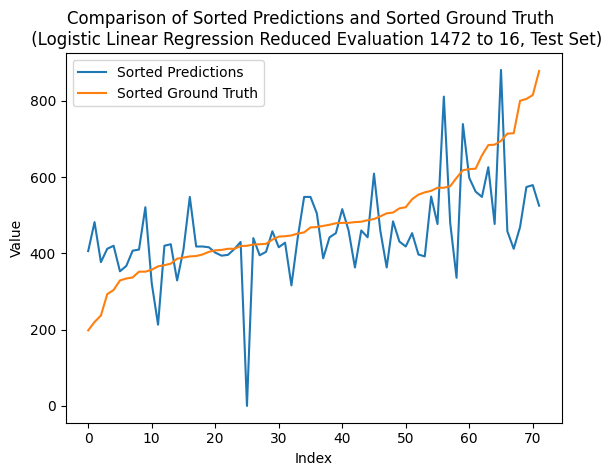

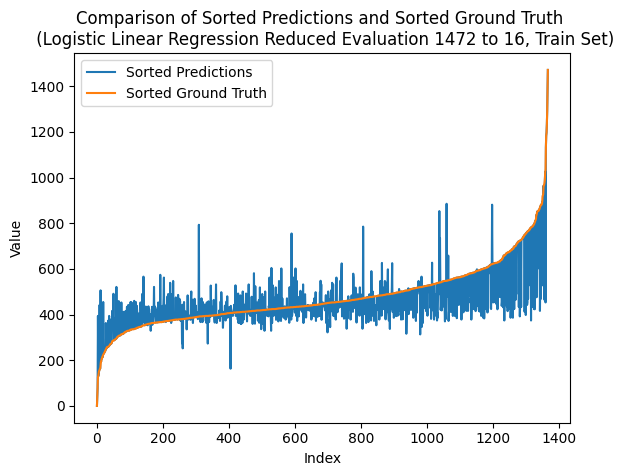

---- ---- ----
class_num = 1488
Number of unique elements: 475
[   0.   93.  186.  279.  372.  465.  558.  651.  744.  837.  930. 1023.
 1116. 1209. 1302. 1395. 1488.]
test eval:
Mean squared error: 2.0972222222222223
Correlation coefficient: 0.482564993219076
Coefficient of determination (R-squared score, R2 score): 0.055512118842846014
train eval:
Mean squared error: 1.0504385964912282
Correlation coefficient: 0.7766070205959213
Coefficient of determination (R-squared score, R2 score): 0.5748777226537639


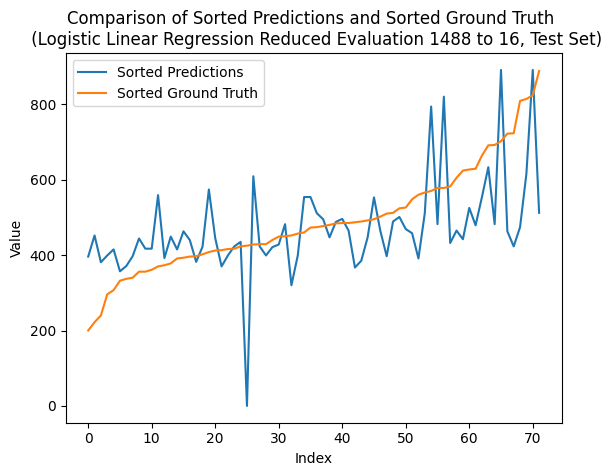

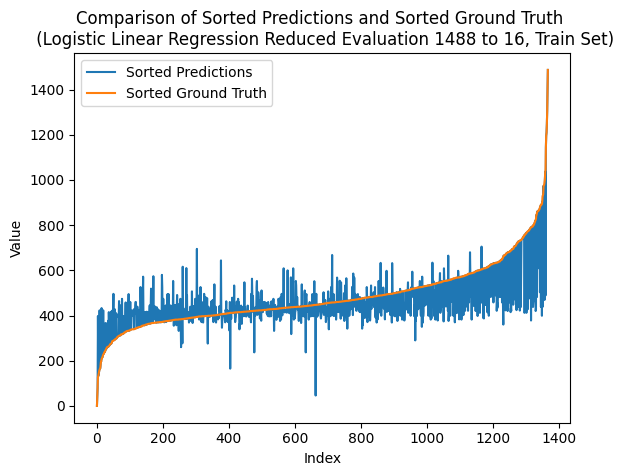

---- ---- ----
class_num = 1504
Number of unique elements: 480
[   0.   94.  188.  282.  376.  470.  564.  658.  752.  846.  940. 1034.
 1128. 1222. 1316. 1410. 1504.]
test eval:
Mean squared error: 1.875
Correlation coefficient: 0.46958405729404645
Coefficient of determination (R-squared score, R2 score): 0.15559030492572323
train eval:
Mean squared error: 0.9437134502923976
Correlation coefficient: 0.7995305213331454
Coefficient of determination (R-squared score, R2 score): 0.6180703827042513


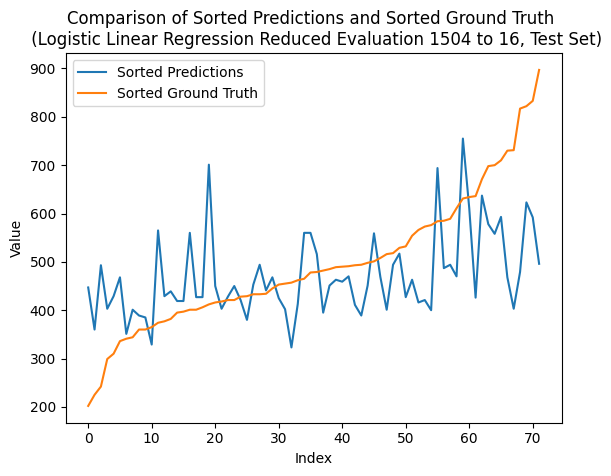

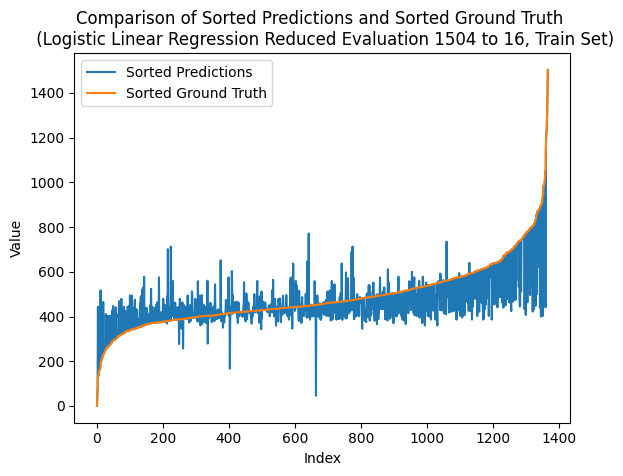

---- ---- ----
class_num = 1520
Number of unique elements: 485
[   0.   95.  190.  285.  380.  475.  570.  665.  760.  855.  950. 1045.
 1140. 1235. 1330. 1425. 1520.]
test eval:
Mean squared error: 1.8333333333333333
Correlation coefficient: 0.5232955120884032
Coefficient of determination (R-squared score, R2 score): 0.17435496481626267
train eval:
Mean squared error: 1.0431286549707601
Correlation coefficient: 0.7791778492261693
Coefficient of determination (R-squared score, R2 score): 0.577836124027085


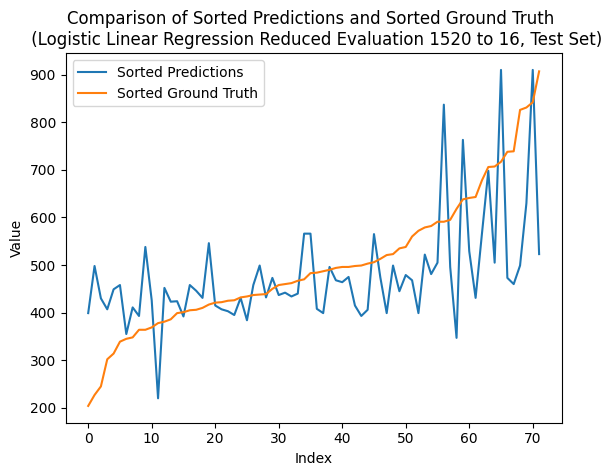

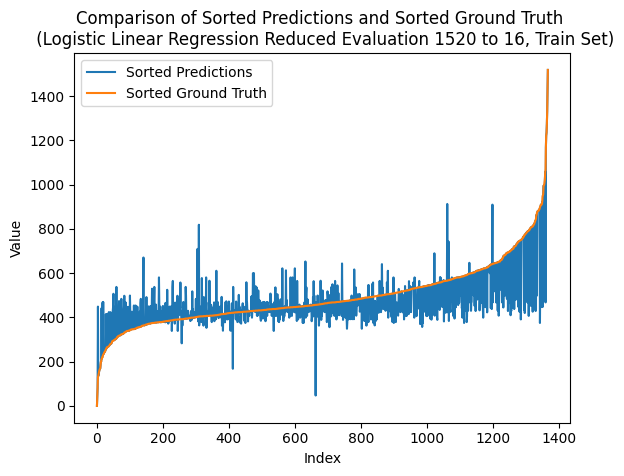

---- ---- ----
class_num = 1536
Number of unique elements: 488
[   0.   96.  192.  288.  384.  480.  576.  672.  768.  864.  960. 1056.
 1152. 1248. 1344. 1440. 1536.]
test eval:
Mean squared error: 2.5972222222222223
Correlation coefficient: 0.3025888598515331
Coefficient of determination (R-squared score, R2 score): -0.1696637998436279
train eval:
Mean squared error: 1.003654970760234
Correlation coefficient: 0.7879356584726166
Coefficient of determination (R-squared score, R2 score): 0.5938114914430187


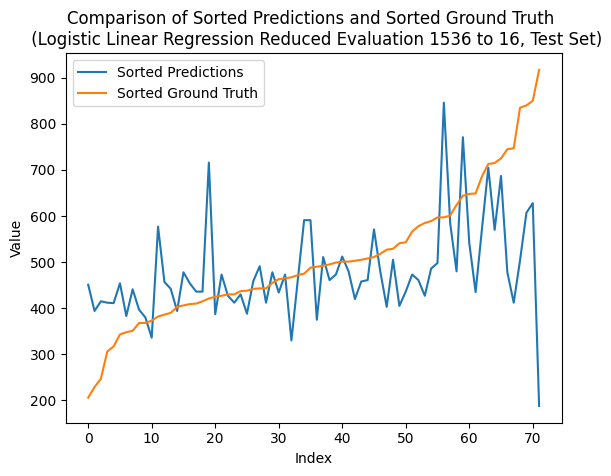

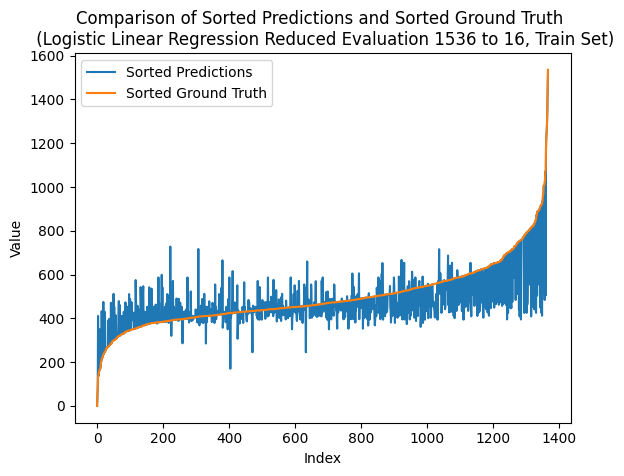

---- ---- ----
class_num = 1552
Number of unique elements: 493
[   0.   97.  194.  291.  388.  485.  582.  679.  776.  873.  970. 1067.
 1164. 1261. 1358. 1455. 1552.]
test eval:
Mean squared error: 1.9166666666666667
Correlation coefficient: 0.5064839042784918
Coefficient of determination (R-squared score, R2 score): 0.13682564503518369
train eval:
Mean squared error: 0.9963450292397661
Correlation coefficient: 0.7885125721139171
Coefficient of determination (R-squared score, R2 score): 0.5967698928163397


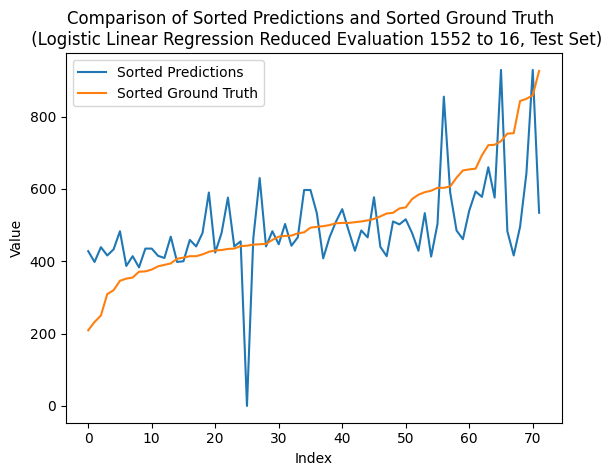

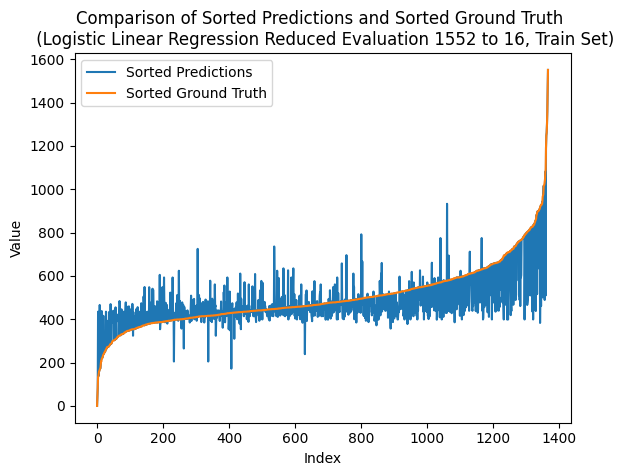

---- ---- ----
class_num = 1568
Number of unique elements: 487
[   0.   98.  196.  294.  392.  490.  588.  686.  784.  882.  980. 1078.
 1176. 1274. 1372. 1470. 1568.]
test eval:
Mean squared error: 2.236111111111111
Correlation coefficient: 0.4137988835703925
Coefficient of determination (R-squared score, R2 score): -0.0070367474589523304
train eval:
Mean squared error: 0.9941520467836257
Correlation coefficient: 0.7887278054019051
Coefficient of determination (R-squared score, R2 score): 0.5976574132283361


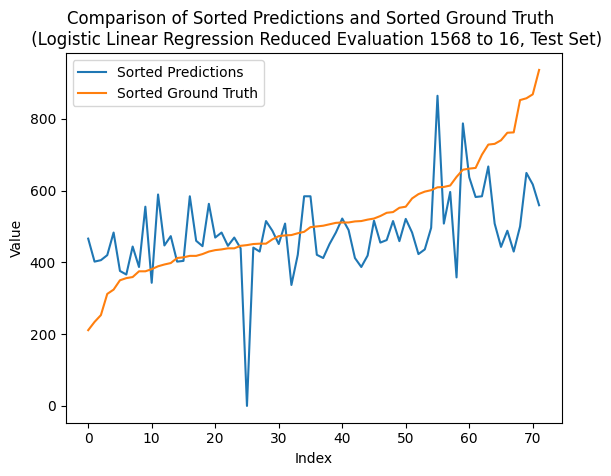

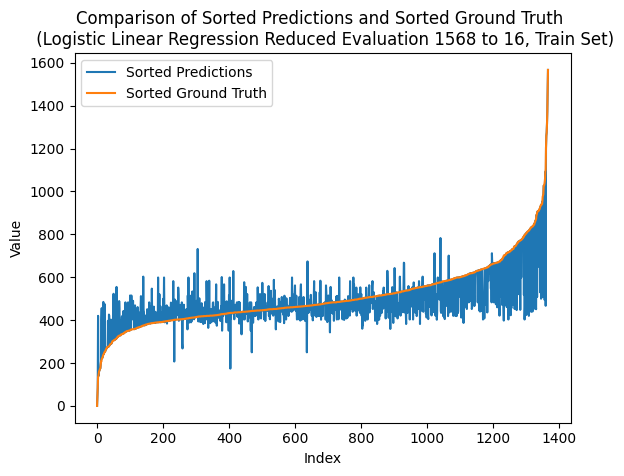

---- ---- ----
class_num = 1584
Number of unique elements: 499
[   0.   99.  198.  297.  396.  495.  594.  693.  792.  891.  990. 1089.
 1188. 1287. 1386. 1485. 1584.]
test eval:
Mean squared error: 1.9305555555555556
Correlation coefficient: 0.4789200965094406
Coefficient of determination (R-squared score, R2 score): 0.13057075840500387
train eval:
Mean squared error: 0.9948830409356725
Correlation coefficient: 0.7903863320654227
Coefficient of determination (R-squared score, R2 score): 0.597361573091004


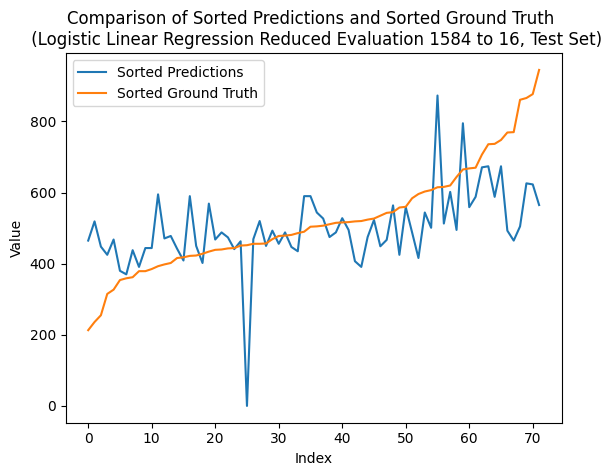

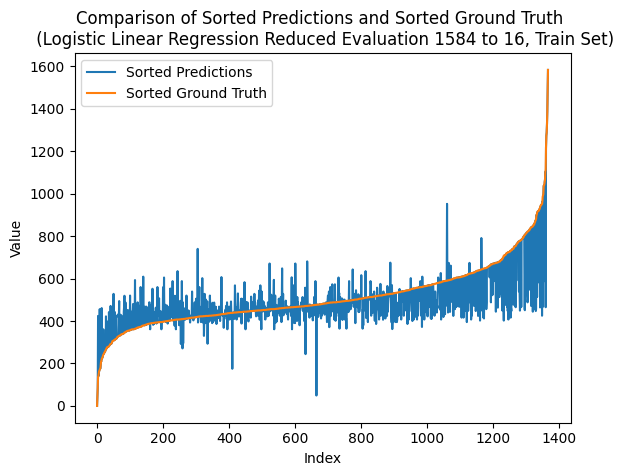

---- ---- ----
class_num = 1600
Number of unique elements: 502
[   0.  100.  200.  300.  400.  500.  600.  700.  800.  900. 1000. 1100.
 1200. 1300. 1400. 1500. 1600.]
test eval:
Mean squared error: 1.9305555555555556
Correlation coefficient: 0.5341637807956756
Coefficient of determination (R-squared score, R2 score): 0.13057075840500387
train eval:
Mean squared error: 1.0467836257309941
Correlation coefficient: 0.7804634250802601
Coefficient of determination (R-squared score, R2 score): 0.5763569233404244


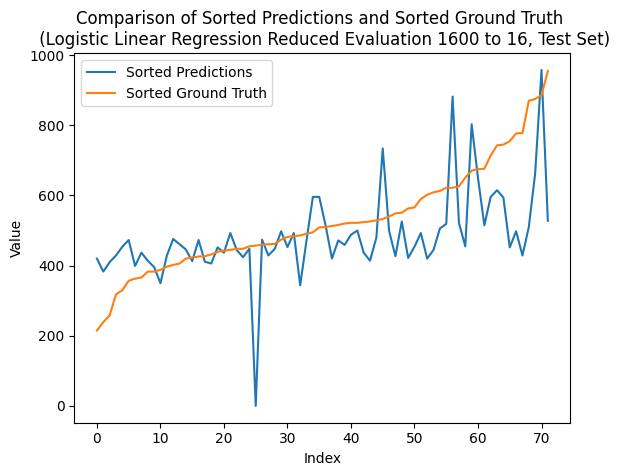

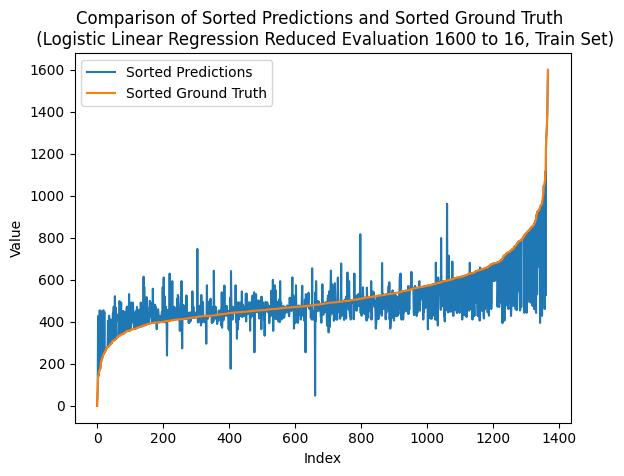

In [91]:
# independent data
x = group_satcked_green
# dependent data (labels/targets)
y = np.squeeze(stacked_red)

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)
# Calculate the minimum and maximum values
infinitesimal = np.finfo(float).eps
min_val = np.min(y) - infinitesimal # to guarantee to include min
max_val = np.max(y) + infinitesimal # to guarantee to include max

print("x_train shape:", x_train.shape)
print("y_train shape:", y_train.shape)
print("x_test shape:", x_test.shape)
print("y_test shape:", y_test.shape)

reduced_class_num = 16
class_num_array = np.arange(reduced_class_num, reduced_class_num * 100 + 1, reduced_class_num)
# class_num_array = np.arange(reduced_class_num * 5, reduced_class_num * 40 + 1, reduced_class_num)
mse_test_list = []
correlation_test_list = []
r_squared_test_list = []
mse_train_list = []
correlation_train_list = []
r_squared_train_list = []

for class_num in class_num_array:
    print('---- ---- ----')
    print(f'class_num = {class_num}')

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.05, random_state=42)

    # Generate class_num+1 evenly spaced intervals
    intervals = np.linspace(min_val, max_val, num=class_num+1) # num = class num + 1
    # print(intervals)
    # Digitize the array to get the indices of the intervals
    y_train = np.digitize(y_train, intervals) - 1
    y_test = np.digitize(y_test, intervals) - 1

    # to see unique elements (see if we have all 0, 1,..., class_num-1 classes, better close to all)
    unique_elements = np.unique(y_train)
    # print("Unique elements:", unique_elements)
    print("Number of unique elements:", len(unique_elements))

    model = linear_model.LogisticRegression(fit_intercept=True, max_iter=1000, multi_class='multinomial')
    fit_result = model.fit(x_train, y_train)

    y_pred = model.predict(x_test)
    y_pred_ = model.predict(x_train)

    # Define the boundaries for digitization
    intervals = np.arange(0, class_num+1, class_num/16)
    print(intervals)

    y_train_digital = np.digitize(y_train, intervals) - 1
    y_test_digital = np.digitize(y_test, intervals) - 1
    y_pred_train_digital = np.digitize(y_pred_, intervals) - 1
    y_pred_test_digital = np.digitize(y_pred, intervals) - 1
    # print(y_pred)
    # print(y_pred_test_digital)
    print("test eval:")
    mse = mean_squared_error(y_test_digital, y_pred_test_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_test_digital, y_test_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_test_digital, y_pred_test_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_test_list.append(mse)
    correlation_test_list.append(correlation)
    r_squared_test_list.append(r_squared)

    print("train eval:")
    mse = mean_squared_error(y_train_digital, y_pred_train_digital)
    print("Mean squared error:", mse)
    correlation = np.corrcoef(y_pred_train_digital, y_train_digital)[0, 1]
    print("Correlation coefficient:", correlation)
    r_squared = r2_score(y_train_digital, y_pred_train_digital)
    print("Coefficient of determination (R-squared score, R2 score):", r_squared)
    mse_train_list.append(mse)
    correlation_train_list.append(correlation)
    r_squared_train_list.append(r_squared)

    plot_comparison(y_test, y_pred, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Test Set')
    plot_comparison(y_train, y_pred_, f'Logistic Linear Regression Reduced Evaluation {class_num} to {reduced_class_num}, Train Set')



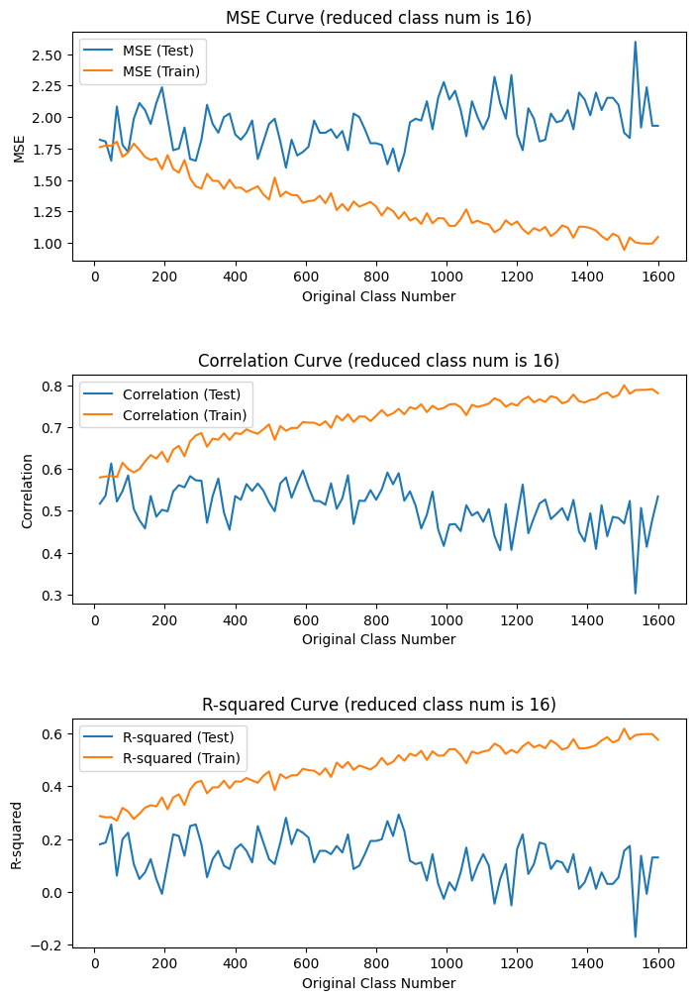

Max Index: 53
Max Original Class Num: 864


In [92]:
# plot the trend figures of mse, correlation, and r2

# Create a figure and subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(8, 12))

# Plot MSE
ax1.plot(class_num_array, mse_test_list, label='MSE (Test)')
ax1.plot(class_num_array, mse_train_list, label='MSE (Train)')
ax1.set_ylabel('MSE')
ax1.set_xlabel('Original Class Number')
ax1.set_title(f'MSE Curve (reduced class num is {reduced_class_num})')
ax1.legend()

# Plot Correlation
ax2.plot(class_num_array, correlation_test_list, label='Correlation (Test)')
ax2.plot(class_num_array, correlation_train_list, label='Correlation (Train)')
ax2.set_ylabel('Correlation')
ax2.set_xlabel('Original Class Number')
ax2.set_title(f'Correlation Curve (reduced class num is {reduced_class_num})')
ax2.legend()

# Plot R-squared
ax3.plot(class_num_array, r_squared_test_list, label='R-squared (Test)')
ax3.plot(class_num_array, r_squared_train_list, label='R-squared (Train)')
ax3.set_ylabel('R-squared')
ax3.set_xlabel('Original Class Number')
ax3.set_title(f'R-squared Curve (reduced class num is {reduced_class_num})')
ax3.legend()

# Increase the vertical spacing between subplots
plt.subplots_adjust(hspace=0.5)

# Adjust tick, label, title, and legend font sizes
plt.rcParams.update({'font.size': 12})
ax1.tick_params(labelsize=10)
ax2.tick_params(labelsize=10)
ax3.tick_params(labelsize=10)

# Save the figure
plt.savefig(f'mse_correlation_r2_trend_curve_reduced_eval_reduced_class_num_{reduced_class_num}.png', bbox_inches='tight')

# Show the figure
plt.show()

# Convert r_squared_test_list to a NumPy array
r_squared_test_array = np.array(r_squared_test_list)
# Find the index of the maximum value
max_index = np.argmax(r_squared_test_array)
# Get the corresponding class_num value
max_class_num = class_num_array[max_index]

# Print the index and corresponding class_num
print("Max Index:", max_index)
print("Max Original Class Num:", max_class_num)